In [2]:
from pathlib import Path
import nibabel as nib
import numpy as np
import os
import sys
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from scipy.signal import hilbert
from cmath import phase
# from numpy.linalg import eig as eigenvectors
import pandas as pd
from datetime import date
import random
import scipy.io

import matplotlib as mpl
import pickle
import scipy
import mat73
# from statannotations.Annotator import Annotator
import seaborn as sns

# import igraph as ig

from tqdm import tqdm

from numpy.linalg import eigh as eigenvectors #compute real eigenvec and eigenvals (only for symmetric or Hermitian matrices)
from scipy.sparse.linalg import eigsh # BAD - but I don't know why
import networkx as nx
from sklearn import linear_model
from scipy.stats import brunnermunzel

# PCA
from sklearn.decomposition import PCA
import pandas as pd

# K-MEANS
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.metrics import homogeneity_score, completeness_score, v_measure_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.mixture import GaussianMixture
from scipy.stats import multivariate_normal as mvn
from scipy.stats import zscore
from sklearn.preprocessing import MinMaxScaler

# Stat test
from scipy.stats import ttest_ind, ttest_1samp, pearsonr
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm

# Similaritys
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial.distance import euclidean
import sklearn

# Normalization
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from scipy.spatial import distance

# from nilearn import plotting
from scipy.cluster.vq import vq
from numpy.linalg import norm

# statistics
import pingouin as pg
from statannotations.Annotator import Annotator

from scipy.stats import zscore
# from scipy.stats import norm # to compute p-value
from sklearn.utils import shuffle

# ENIGMA PLOTS
sys.path.append('../src')
# from utils_neuromaps_brain import plot_adjustments, truncate_colormap, normal_view, full_view, compose_full_view

from utils_stat import cohen, annotate_D, conf_int_pval
from utils_graph import graph_metrics, Digraph_metrics, cort_subcort_connectivity, homotopic_connectivity
from utils import utri2mat, mov_av_smooth, find_the_min, boool
from utils_plot import plot_ordered_fc, plot_array, plot_arrays
    
# NILEARN
from nilearn import plotting

from skimage.metrics import structural_similarity as ssim
from nilearn import plotting, surface, datasets
from matplotlib.colors import LinearSegmentedColormap

from statsmodels.stats.multitest import multipletests
import itertools
from scipy.stats import entropy

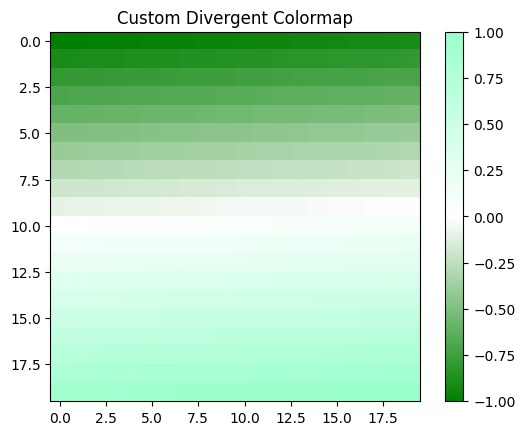

In [3]:
import matplotlib.pyplot as plt


# Define the colormap
colors = {
    'red':   [(0.0, 0.0, 0.0),  # Dark green (left)
              (0.5, 1.0, 1.0),  # White (center)
              (1.0, 0.6, 0.6)], # Light green (right)
    'green': [(0.0, 0.5, 0.5),  # Dark green (left)
              (0.5, 1.0, 1.0),  # White (center)
              (1.0, 1.0, 1.0)], # Light green (right)
    'blue':  [(0.0, 0.0, 0.0),  # Dark green (left)
              (0.5, 1.0, 1.0),  # White (center)
              (1.0, 0.8, 0.8)]  # Light green (right)
}

# colors = {
#     'red':   [(0.0, 0.0, 0.0),  # Dark green (left)
#               (0.5, 0.0, 0.0),  # Black (center)
#               (1.0, 0.6, 0.6)], # Light green (right)
#     'green': [(0.0, 0.5, 0.5),  # Dark green (left)
#               (0.5, 0.0, 0.0),  # Black (center)
#               (1.0, 1.0, 1.0)], # Light green (right)
#     'blue':  [(0.0, 0.0, 0.0),  # Dark green (left)
#               (0.5, 0.0, 0.0),  # Black (center)
#               (1.0, 0.8, 0.8)]  # Light green (right)
# }

# colors = {
#     'red':   [(0.0, 0.0, 0.0),  # Dark green (left)
#               (0.5, 0.7, 0.7),  # Grey (center)
#               (1.0, 0.6, 0.6)], # Light green (right)
#     'green': [(0.0, 0.5, 0.5),  # Dark green (left)
#               (0.5, 0.7, 0.7),  # Grey (center)
#               (1.0, 1.0, 1.0)], # Light green (right)
#     'blue':  [(0.0, 0.0, 0.0),  # Dark green (left)
#               (0.5, 0.7, 0.7),  # Grey (center)
#               (1.0, 0.8, 0.8)]  # Light green (right)
# }

# Create the colormap
custom_cmap = LinearSegmentedColormap('CustomDivergent', colors)

# Test the colormap
import numpy as np
data = np.linspace(-1, 1, 400).reshape(20, 20)  # Example data

# Plot using the custom colormap
plt.imshow(data, cmap=custom_cmap)
plt.colorbar()
plt.title('Custom Divergent Colormap')
plt.show()

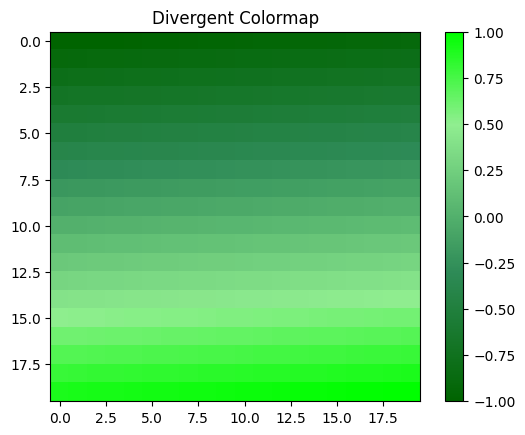

In [4]:
from matplotlib.colors import LinearSegmentedColormap

# Define colors with white shifted toward the center
blues_div = [
    (0.0, 'blue'),
    (0.35, 'royalblue'),
    (0.5, 'white'),
    (0.75, 'paleturquoise'),
    (1.0, 'deepskyblue')
]

greens_div = [
    (0.0, 'darkgreen'),
    (0.35, 'seagreen'),
    (0.5, 'white'),
    (0.75, 'lightgreen'),
    (1.0, 'lime')
]

reds_div = [
    (0.0, 'crimson'),
    (0.35, 'palevioletred'),
    (0.5, 'white'),
    (0.75, 'orange'),
    (1.0, 'darkorange')
]

blues = [
    (0.0, 'blue'),
    (0.35, 'royalblue'),
    (0.75, 'paleturquoise'),
    (1.0, 'deepskyblue')
]

greens = [
    (0.0, 'darkgreen'),
    (0.35, 'seagreen'),
    (0.75, 'lightgreen'),
    (1.0, 'lime')
]

reds = [
    (0.0, 'crimson'),
    (0.35, 'palevioletred'),
    (0.75, 'orange'),
    (1.0, 'darkorange')
]



# Create the colormap
blue_div_cmap = LinearSegmentedColormap.from_list('CustomDivergent_blue', blues_div)
green_div_cmap = LinearSegmentedColormap.from_list('CustomDivergent_green', greens_div)
red_div_cmap = LinearSegmentedColormap.from_list('CustomDivergent_green', reds_div)

blue_cmap = LinearSegmentedColormap.from_list('Custom_blue', blues)
green_cmap = LinearSegmentedColormap.from_list('Custom_green', greens)
red_cmap = LinearSegmentedColormap.from_list('Custom_green', reds)

# Test the colormap
import numpy as np
data = np.linspace(-1, 1, 400).reshape(20, 20)

# Plot using the custom colormap
plt.imshow(data, cmap=green_cmap)
plt.colorbar()
plt.title('Divergent Colormap')
plt.show()

In [5]:
my_pal = {'C':'blue', 'B':'g', 'NB':'r'}

In [6]:
# Get data path
cwd = Path(os.getcwd())
pardir = str(cwd.parent.absolute())
projdir = os.path.dirname(pardir)
projdir = os.path.dirname(projdir)
pardir, projdir

if projdir=='/home/aborriero': # we are in the dinozord
    pardir = '/data/aborriero/blindsight'
    output_folder = '/data/aborriero/blindsight/outputs/'
else:
    output_folder = 'outputs/'
    

In [7]:
sns.__version__

'0.11.2'

In [8]:
# !pip install matplotlib==3.7.3
# # !pip uninstall seaborn
# !pip install seaborn==0.11.2 # for statsannotations
# # !pip install pandas==1.5.3 # for statsannotations
# !pip install pandas==2.2.2 # the most updated
# # !pip install seaborn==0.13.2 # for annotion over heatmaps

In [9]:
n_sub = 33

## Load atlas

In [10]:
# Shafer

path = pardir+'/data/atlas/schafer/Schaefer2018_200Parcels_7Networks_plus_TIAN_SC_LGN_order_FSLMNI152_2.4mm.nii.gz'
path_lab = pardir+'/data/atlas/schafer/Schaefer2018_200Parcels_7Networks_plus_TIAN_SC_LGN.csv'

atlas_ = nib.load(path)
atlas = atlas_.get_fdata()
atlas_header = atlas_.header
atlas_affine = atlas_.affine
print(atlas.shape)


atlas_labels = pd.read_csv(path_lab, delimiter=';')
# atlas_labels.rename(columns = {0:'from', 1:'hemisphere',2:'network',3:'super network',4:'area',5:'count'}, inplace = True)
# atlas_labels.replace('Diano', 'Tian', inplace=True)
# bastardi = np.unique(atlas_labels[atlas_labels['from']=='Tian']['network'].values)
# for basta in bastardi:
#     atlas_labels.replace(basta, 'subcortical', inplace=True)
# nodes_labels = atlas_labels['area'].values

# n_area = []
# for n,a in zip(atlas_labels['network'].values, atlas_labels['area'].values):
#     n_area.append(n +'-'+a)
# atlas_labels['n_area'] = n_area

atlas_labels

(75, 90, 75)


,ROI_label,ROI_name,ROI_network,Hemisphere
0,1,LH_Vis_1,Vis,LH
1,2,LH_Vis_2,Vis,LH
2,3,LH_Vis_3,Vis,LH
3,4,LH_Vis_4,Vis,LH
4,5,LH_Vis_5,Vis,LH
...,...,...,...,...
231,232,LH_pCAU,Subcortical,LH
232,233,LH_SC,Subcortical,LH
233,234,RH_SC,Subcortical,RH
234,235,LH_LGN,Subcortical,LH


In [11]:
# Divides the nodes in macro areas
# Divide areas for network
networks = np.unique(atlas_labels['ROI_network'].values)
net_idx = {}
net_dic = {} # Area index associated to each macro area (as dictionary keys)
net_list = [] # same as mas_dic, but as a concatenation of list
for ne_idx, ne in enumerate(networks):
    net_dic[ne] = atlas_labels.index[atlas_labels['ROI_network']==ne].tolist()
    net_list.append(atlas_labels.index[atlas_labels['ROI_network']==ne].tolist())

In [12]:
# GLASSER
# Shafer
path = pardir+'/data/atlas/glasser/Glasser_Tian_SC_BlindsightResamp.nii.gz'
path_lab = pardir+'/data/atlas/glasser/atlas_finev1.csv'
glasser_ = nib.load(path)
glasser = glasser_.get_fdata()
glasser_header = glasser_.header
glasser_affine = glasser_.affine
print(glasser.shape)


glasser_labels = pd.read_csv(path_lab, delimiter=';')
# glasser_labels.rename(columns = {0:'from', 1:'hemisphere',2:'network',3:'super network',4:'area',5:'count'}, inplace = True)
# glasser_labels.replace('Diano', 'Tian', inplace=True)

(75, 90, 75)


## Plot subcortical maps

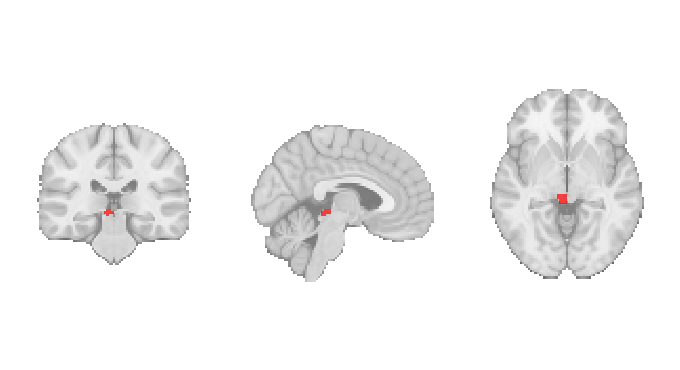

In [13]:
L_SC_idx = glasser_labels.loc[glasser_labels['Area']=='L_SC'].index[0]
L_SC_mask = np.zeros(glasser.shape)
coord = np.where(glasser==L_SC_idx+1)
L_SC_mask[coord[0],coord[1],coord[2]] = 1
nifti_L_SC_mask = nib.Nifti1Image(L_SC_mask, glasser_affine)

fig = plotting.plot_roi(nifti_L_SC_mask, cmap='autumn', draw_cross=False, annotate=False)
plt.savefig('L_SC_roi.png', dpi=300)

In [14]:
atlas_labels[200:]

,ROI_label,ROI_name,ROI_network,Hemisphere
200,201,RH_aHIP,Subcortical,RH
201,202,RH_pHIP,Subcortical,RH
202,203,RH_lAMY,Subcortical,RH
203,204,RH_mAMY,Subcortical,RH
204,205,RH_THA_DP,Subcortical,RH
205,206,RH_THA_VP,Subcortical,RH
206,207,RH_THA_VA,Subcortical,RH
207,208,RH_THA_DA,Subcortical,RH
208,209,RH_NAc_shell,Subcortical,RH
209,210,RH_NAc_core,Subcortical,RH


['posterior thal', 'anterior thal', 'SC', 'LGN']

<Figure size 640x480 with 0 Axes>

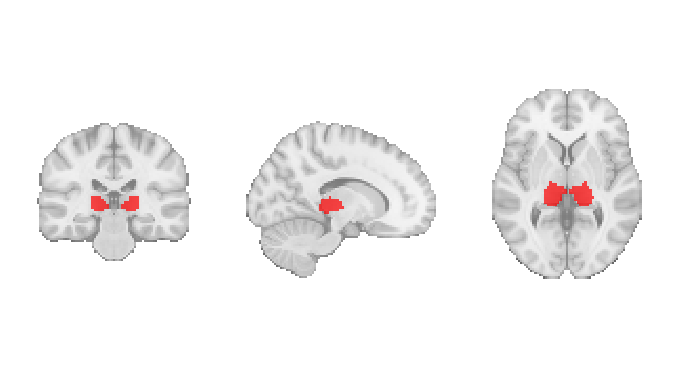

<Figure size 640x480 with 0 Axes>

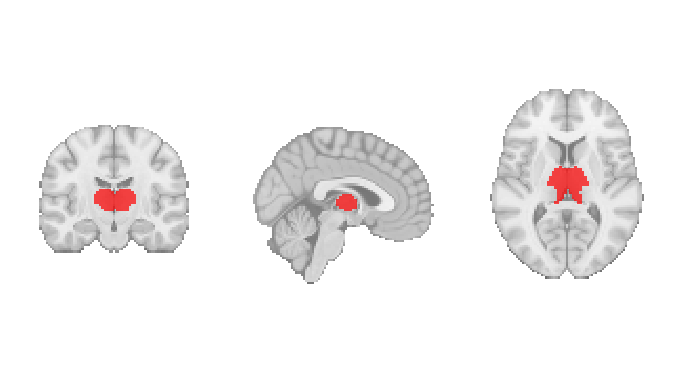

<Figure size 640x480 with 0 Axes>

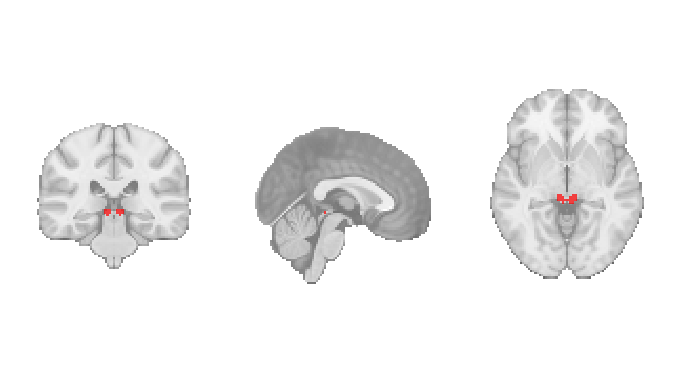

<Figure size 640x480 with 0 Axes>

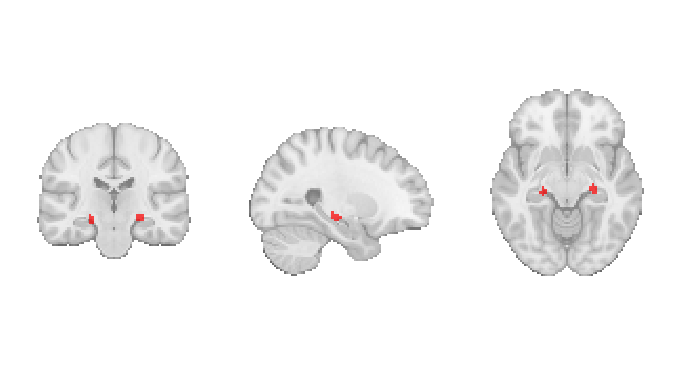

In [112]:
seeddini = [['THA_DP', 'THA_VP'], ['THA_DA', 'THA_VA'], ['SC'], ['LGN']]


# sub_mask = np.zeros(atlas.shape)
for i,seeds in enumerate(seeddini):
    name = seeddini_labels[i]
    sub_mask = np.zeros(atlas.shape)
    for seed in seeds:
        for hemi in ['LH_','RH_']:
            seed_idx = atlas_labels.loc[atlas_labels['ROI_name']==hemi+seed].index[0]
            coord = np.where(atlas==seed_idx+1)
            sub_mask[coord[0],coord[1],coord[2]] = i+1

    
    nifti_sub_mask = nib.Nifti1Image(sub_mask, glasser_affine)
    fig = plt.figure()
    plotting.plot_roi(nifti_sub_mask, cmap='autumn', draw_cross=False, annotate=False)
    plt.savefig(name+'_roi.png', dpi=300)

## Glasser - Schaefer match

In [15]:
glasser_labels

,Hemisphere,Area,Macro Area
0,LH,L_V1,Primary Visual Cortex
1,LH,L_MST,MT+ Complex and Neighboring Visual Areas
2,LH,L_V6,Dorsal Stream Visual Cortex
3,LH,L_V2,Early Visual Cortex
4,LH,L_V3,Early Visual Cortex
...,...,...,...
389,RH,R_Caud_post,Tian_Caudate
390,RH,R_Pall_post,Tian_Pallidus
391,RH,R_Put_post,Tian_Putamen
392,LH,L_Substantia_Nigra,Substantia_Nigra


In [16]:
print(glasser_labels.loc[glasser_labels['Area']=='L_MT'].index,
      glasser_labels.loc[glasser_labels['Area']=='R_MT'].index,
      glasser_labels.loc[glasser_labels['Area']=='L_V1'].index,
      glasser_labels.loc[glasser_labels['Area']=='R_V1'].index)

Index([22], dtype='int64') Index([203], dtype='int64') Index([0], dtype='int64') Index([181], dtype='int64')


In [17]:
# my_areas = ['L_MT','R_MT','L_V1','R_V1']
my_areas = ['L_MT','R_MT']

for a in my_areas:
    a_cord = np.where(glasser==glasser_labels.loc[glasser_labels['Area']==a].index[0]+1)
    print(np.unique(atlas[a_cord[0], a_cord[1], a_cord[2]])+1) # schafer

[1. 4. 9.]
[106. 112. 137.]


In [18]:
L_MT_idx = [4, 9]
R_MT_idx = [106,112,137]

## Load subjects informations

In [19]:
classif = pd.read_excel(pardir+'/data/MD_05122023/davide_class_blindsight.xlsx')
# classif.drop(labels='Unnamed: 3', axis=1, inplace=True)
# new = classif['NEW ID'].values
# old = classif['OLD ID'].values
group = classif['CLASS'].values
# time_points = int(time_all.shape[1]/len(group))
group_dic = {'C':0, 'B':1, 'NB':2}

In [20]:
subjects_code = classif['ID'].values
subjects_group = classif['CLASS'].values
n_sub = len(subjects_code)

B_code = []
NB_code = []
C_code = []
for sub_i, sub in enumerate(subjects_code):
    if subjects_group[sub_i]=='B':
        B_code.append(sub)
    elif subjects_group[sub_i]=='NB':
        NB_code.append(sub)
    elif subjects_group[sub_i]=='C':
        C_code.append(sub)
    

# Load LEIDA results

In [21]:
# state_labels
path = pardir + '/data/AB_15052024/clustering_res.mat'
kmeans_leida_ = mat73.loadmat(path)
print(kmeans_leida_.keys())
kmeans_leida = kmeans_leida_['Kmeans_results']
# kmeans_leida = kmeans_leida_['Kmeans_results']
K_max = len(kmeans_leida) + 3
print(kmeans_leida[0].keys())

K = 4
k = K-2
kmeans_leida[k].keys()
centroids = kmeans_leida[k]['C']

dict_keys(['Kmeans_results', 'mal_dist_kmean'])
dict_keys(['C', 'D', 'IDX', 'SUMD'])


In [22]:
# define a labeling for the each area according to dfc state
state_labels_vec = np.zeros((236,))
state_names_dic = {0:'DMN', 1:'Somatosensory', 2:'Visual', 3:'Subcortical'}
for i,c in enumerate(centroids[1:]):
    state_labels_vec[np.where(c>0)] = i
# Add also a Subcortical state
sc_idx = atlas_labels.loc[atlas_labels['ROI_network']=='Subcortical'].index.values
state_labels_vec[sc_idx] = 3

state_labels_list =  []
for a in state_labels_vec:
    state_labels_list.append(state_names_dic[a])

In [23]:
atlas_labels['ROI_state'] = state_labels_list

In [24]:
atlas_labels

,ROI_label,ROI_name,ROI_network,Hemisphere,ROI_state
0,1,LH_Vis_1,Vis,LH,Visual
1,2,LH_Vis_2,Vis,LH,Visual
2,3,LH_Vis_3,Vis,LH,Visual
3,4,LH_Vis_4,Vis,LH,Visual
4,5,LH_Vis_5,Vis,LH,Visual
...,...,...,...,...,...
231,232,LH_pCAU,Subcortical,LH,Subcortical
232,233,LH_SC,Subcortical,LH,Subcortical
233,234,RH_SC,Subcortical,RH,Subcortical
234,235,LH_LGN,Subcortical,LH,Subcortical


# Load Structural Connectivity

In [25]:
sc = scipy.io.loadmat(pardir+'/data/StructuralConnectivity/healthy/healthy_average_all_sub_SC.mat')['connectivity']
sc = (sc - sc.min()) / (sc.max() - sc.min()) # normalization
SC_healthy = sc

SC_patients = []
for f in os.listdir(pardir+'/data/StructuralConnectivity/patients'):
    sc = scipy.io.loadmat(pardir+'/data/StructuralConnectivity/patients/'+f)['connectivity']
    sc = (sc - sc.min()) / (sc.max() - sc.min()) # normalization
    SC_patients.append(sc)

In [22]:
# Is the structural connectivity asymmetric?
# Healthy
print('HEALTHY')
m = SC_healthy
m_l = []
m_u = []
for i in range(234): # lower
    for j in range(234):
        if i<j: # lower
            m_l.append(m[i,j])
m_t = np.copy(m).transpose()
for i in range(234): # lower
    for j in range(234):
        if i<j: # lower
            m_u.append(m_t[i,j])

print(pearsonr(m_l, m_u))

# Patients
print('PATIENTS')
for m in SC_patients:
    m_l = []
    m_u = []
    for i in range(234): # lower
        for j in range(234):
            if i<j: # lower
                m_l.append(m[i,j])
    m_t = np.copy(m).transpose()
    for i in range(234): # lower
        for j in range(234):
            if i<j: # lower
                m_u.append(m_t[i,j])
    
    print(pearsonr(m_l, m_u))

HEALTHY
PearsonRResult(statistic=1.0, pvalue=0.0)
PATIENTS
PearsonRResult(statistic=1.0, pvalue=0.0)
PearsonRResult(statistic=1.0, pvalue=0.0)
PearsonRResult(statistic=1.0, pvalue=0.0)
PearsonRResult(statistic=1.0, pvalue=0.0)
PearsonRResult(statistic=1.0, pvalue=0.0)
PearsonRResult(statistic=0.9999999999999998, pvalue=0.0)
PearsonRResult(statistic=1.0, pvalue=0.0)
PearsonRResult(statistic=1.0, pvalue=0.0)
PearsonRResult(statistic=0.9999999999999999, pvalue=0.0)
PearsonRResult(statistic=1.0, pvalue=0.0)
PearsonRResult(statistic=1.0, pvalue=0.0)
PearsonRResult(statistic=1.0, pvalue=0.0)
PearsonRResult(statistic=1.0, pvalue=0.0)
PearsonRResult(statistic=0.9999999999999999, pvalue=0.0)
PearsonRResult(statistic=1.0, pvalue=0.0)
PearsonRResult(statistic=0.9999999999999998, pvalue=0.0)


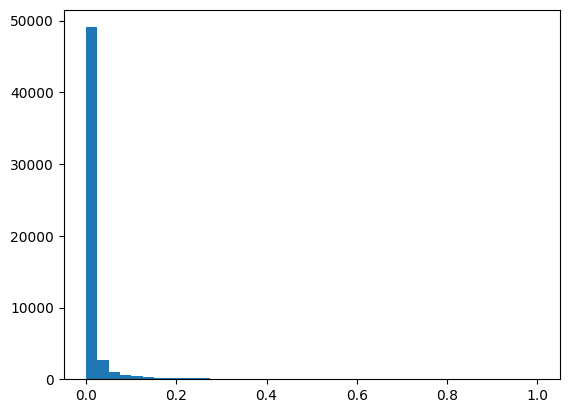

In [23]:
plt.hist(SC_patients[0].flatten(), bins=40);

# Load Effective Connectivity

/tmp/ipykernel_106618/2094890094.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1,2, figsize=(10,3))


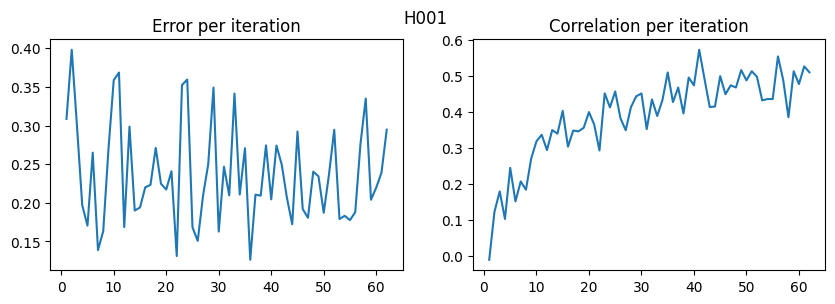

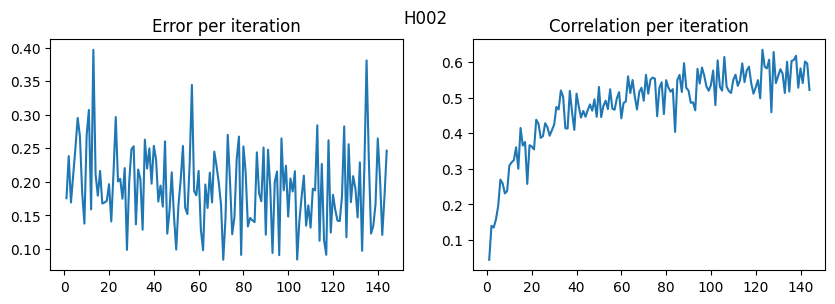

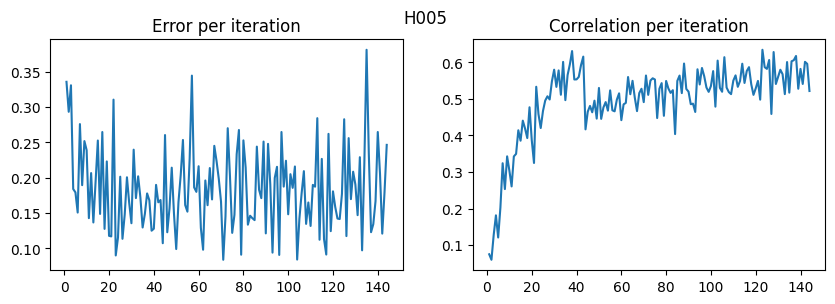

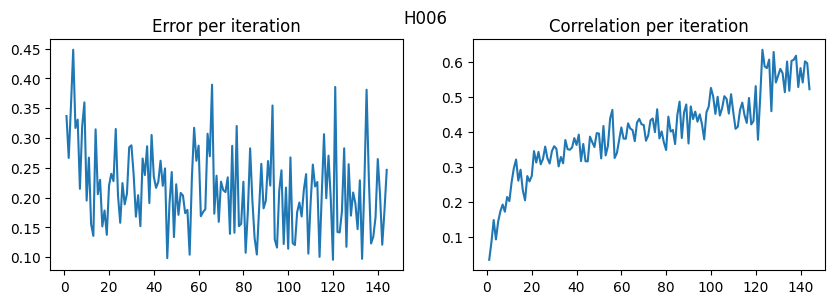

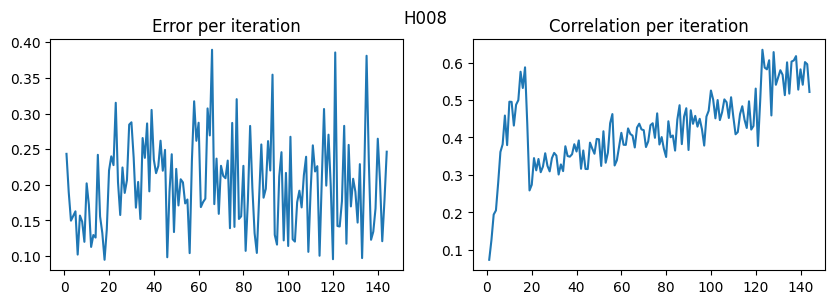

...

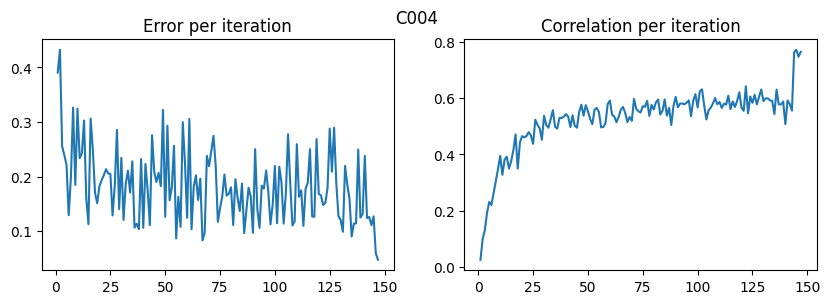

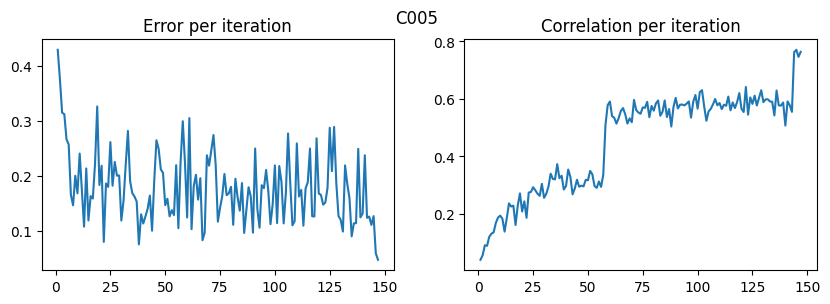

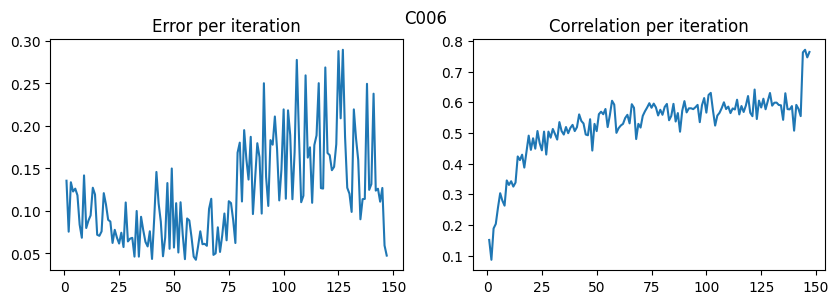

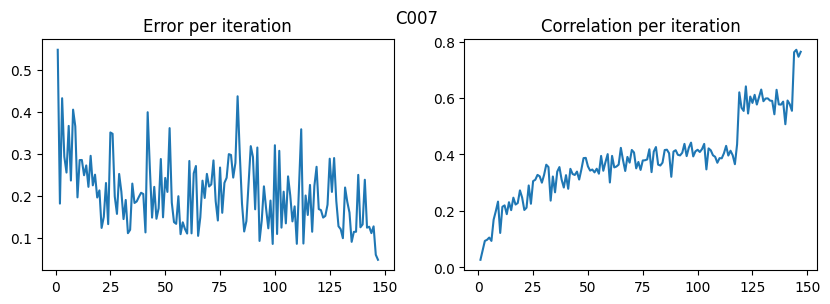

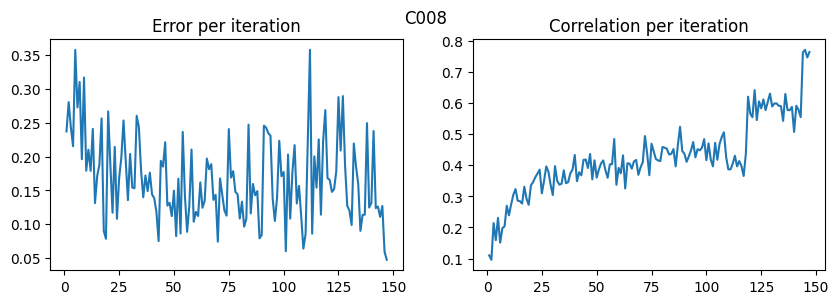

In [26]:
for sub in subjects_code:
    GEC_patient_err_corr = scipy.io.loadmat(pardir+'/data/EffectiveConnectivity/EC_global/GEC_'+sub+'_err&corr.mat')
    err = GEC_patient_err_corr['errorFC']
    corr = GEC_patient_err_corr['corr_accum']
    fig, axs = plt.subplots(1,2, figsize=(10,3))
    plt.suptitle(sub)
    axs[0].plot([x+1 for x in range(err.shape[1])], err[0])
    axs[0].set_title('Error per iteration')
    axs[1].plot([x+1 for x in range(corr.shape[1])], corr[0])
    axs[1].set_title('Correlation per iteration')


In [29]:
GEC_sub = []
FC_sub = []
FCsim_sub = []
for sub in subjects_code:
#     if sub=='R011':
    GEC_subject = scipy.io.loadmat(pardir+'/data/EffectiveConnectivity/EC_global/GEC_'+sub+'.mat')

    Cnew = GEC_subject['Cnew']
    FCemp = GEC_subject['FCemp']
    FCsim = GEC_subject['FCsim']
    GEC_sub.append(Cnew)
    FC_sub.append(FCemp)
    FCsim_sub.append(FCsim)
    

    # titles = ['Cnew', 'Fsim', 'FCemp']
    # fig, axs = plt.subplots(1,3, figsize=(15,4.5))
    # sns.heatmap(Cnew, square=True, ax=axs[0])
    # sns.heatmap(FCsim, square=True, ax=axs[1], cmap='viridis')
    # sns.heatmap(FCemp, square=True, ax=axs[2], cmap='viridis')
    # for i,ax in enumerate(axs.flat):
    #     ax.set_xticks([])
    #     ax.set_yticks([])
    #     ax.set_title(titles[i])
    # plt.suptitle('sub '+sub, y=1.05)
    # plt.tight_layout()
    # plt.savefig('output_global/Matrices_example.png', dpi=300)
    

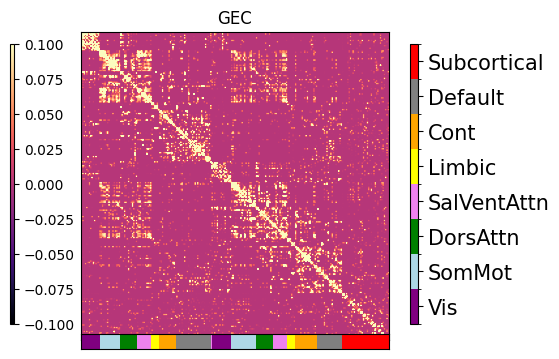

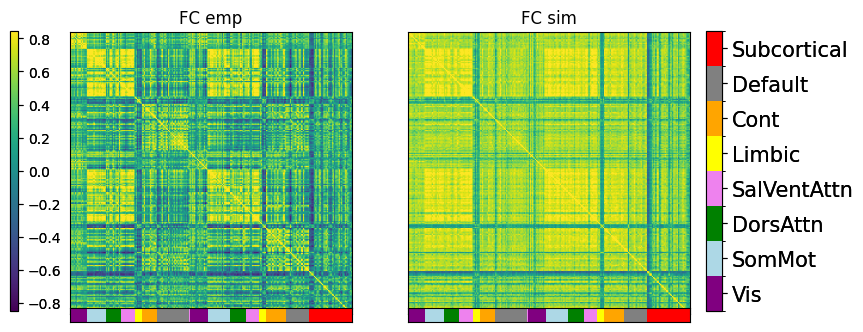

In [70]:
matrix = [GEC_sub[1]]
fig = plot_ordered_fc(matrix, ['GEC'], '', atlas, atlas_labels,  c_map='magma', x_cbar=-0.05, x_netbar=0.95)
plt.savefig(output_folder+'output_global/GEC_example.png', dpi=300)

matrix = [FC_sub[1], FCsim_sub[1]]
fig = plot_ordered_fc(matrix, ['FC emp','FC sim'], '', atlas, atlas_labels,  c_map='viridis', x_cbar=0.05, x_netbar=0.92)
plt.savefig(output_folder+'output_global/FC_example.png', dpi=300)


In [66]:
import matplotlib as mpl
import matplotlib.pyplot as plt 
import numpy as np

max = lambda a,b:a if a > b else b
def plot_ordered_fc(matrix, matrix_label, suptitle, atlas, atlas_labels, c_map='viridis', x_cbar=-0.05, x_netbar=0.92):
    """
    matrix: matrix I want to plot
    matrix_label: label of the matrix

    """
    
    N_mat = len(matrix)

    N=int(atlas.max()) # Number of areas
    
    dic = {}
    for i,n in enumerate(atlas_labels['ROI_network'].unique()):
        dic[n] = i
    
    super_area_indx = [dic[a] for a in atlas_labels['ROI_network'].to_numpy()]
    super_area_indx = np.asarray(super_area_indx)
    
    alpha=1
    
    # Add an additional color for the first 16 elements
    colors = [
              mpl.colors.to_rgba('purple',alpha), #Attention
              mpl.colors.to_rgba('lightblue',alpha), #Auditive
              mpl.colors.to_rgba('green',alpha), #Control  
              mpl.colors.to_rgba('violet',alpha),#Default
              mpl.colors.to_rgba('yellow',alpha), #Language
              mpl.colors.to_rgba('orange',alpha), #Somatomotor
              mpl.colors.to_rgba('gray', alpha),  # Subcortical
              mpl.colors.to_rgba('red',alpha), #Visual
             ]
    
    n_bin = np.unique(list(atlas_labels['ROI_network'])).shape[0] # Increment number of bins
    cmap_name = 'my_list'
    cmap = mpl.colors.LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bin)
    family = super_area_indx
        
    # Define your labels for each color
    labels = atlas_labels['ROI_network'].unique()
        
    vmin = np.min(matrix)
    vmax = np.min(matrix)
    vtot = max(vmax,abs(vmin))

    ### PLOT ###
    cmap_ = plt.get_cmap(c_map)
    fig, axs = plt.subplots(nrows=1, ncols=N_mat, figsize=(4*N_mat, 4))
    fig.suptitle(suptitle)
    for i in range(N_mat):
        if N_mat>1:
            ax = axs[i]
        else:
            ax = axs
        # Plot the matrix
        im = ax.imshow(matrix[i], vmin=-vtot, vmax=vtot, cmap=c_map)
        ax.set_title(matrix_label[i])
        ax.set_xticks([])
        ax.set_yticks([])
    
        # Plot the family color bar at the bottom of the matrix
        cax_bottom = ax.inset_axes([0, -0.03, 1, 0.05])  # adjust [left, bottom, width, height] as needed
        cax_bottom.imshow(family[np.newaxis, :], aspect='auto', cmap=cmap)
        cax_bottom.set_yticks([])
        cax_bottom.set_xticks([])
        
        # Set the boundaries to match your data
        boundaries = [0]  # start with 0
        
        # Add the boundary for the first color
        boundaries.append(16)
        
        # Add the boundaries for the rest of the colors
        for i in range(2, n_bin+1):
            boundaries.append(boundaries[-1] + 10)
        
        # Create a color bar legend with labels
        cax_legend = fig.add_axes([x_netbar, 0.15, 0.02, 0.7])  # adjust [left, bottom, width, height] as needed
        norm = mpl.colors.BoundaryNorm(boundaries, cmap.N)
        cb = mpl.colorbar.ColorbarBase(cax_legend, cmap=cmap, norm=norm, 
                                       ticks=np.array(boundaries[:-1]) + np.diff(boundaries) / 2,  # set ticks at the middle of boundaries
                                       orientation='vertical')
    
        cb.set_ticklabels(labels, fontsize=15)  # set fontsize to desired value
            
        # Add common colorbar
        cbar_ax = fig.add_axes([x_cbar, 0.15, 0.01, 0.7]) # Adjust as necessary.
        fig.colorbar(im, cax=cbar_ax, orientation='vertical')
    return fig

# Load INSIDEOUT results 

In [27]:
path = pardir+'/data/INSIDEOUT/InsideOut_AllSub.mat'
I_global = scipy.io.loadmat(path)['FowRev']
I_matrix = scipy.io.loadmat(path)['I_matrix']
df = pd.DataFrame({'I': I_global[:,0], 'group': subjects_group})
I_per_area = np.zeros((33,236))
for i,sub in enumerate(I_matrix):
    I_per_area[i] =np.mean(sub,axis=1) 

print(I_global.shape, I_matrix.shape, I_per_area.shape)

(33, 1) (33, 236, 236) (33, 236)


In [26]:
# # Simmetry of the irreversibility matrices
# for sub_i,sub in enumerate(subjects_code):
#     print(sub)
#     m = I_matrix[sub_i]
#     m_l = []
#     m_u = []
#     for i in range(236): # lower
#         for j in range(236):
#             if i<j: # lower
#                 m_l.append(m[i,j])
#     m_t = np.copy(m).transpose()
#     for i in range(236): # lower
#         for j in range(236):
#             if i<j: # lower
#                 m_u.append(m_t[i,j])

#     print(pearsonr(m_l, m_u))

# EC values distribution

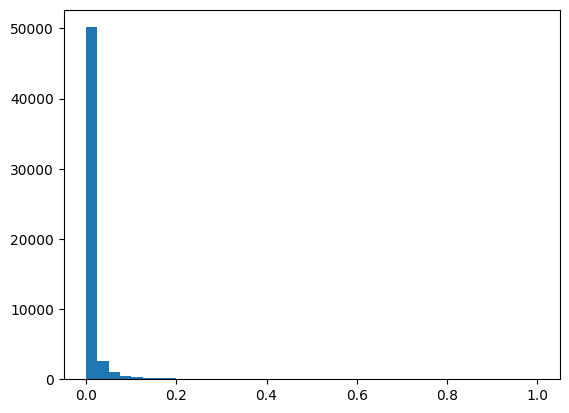

In [27]:
plt.hist(GEC_sub[0].flatten(), bins=40);

# Is the effective connectivity asymmetric?

In [27]:
for sub_i,sub in enumerate(subjects_code):
    print(sub)
    m = GEC_sub[sub_i]
    m_l = []
    m_u = []
    for i in range(234): # lower
        for j in range(234):
            if i<j: # lower
                m_l.append(m[i,j])
    m_t = np.copy(m).transpose()
    for i in range(234): # lower
        for j in range(234):
            if i<j: # lower
                m_u.append(m_t[i,j])

    print(pearsonr(m_l, m_u))

H001
PearsonRResult(statistic=0.9999294127232785, pvalue=0.0)
H002
PearsonRResult(statistic=0.9990684246908409, pvalue=0.0)
H005
PearsonRResult(statistic=0.9999607887218871, pvalue=0.0)
H006
PearsonRResult(statistic=0.9993982716182401, pvalue=0.0)
H008
PearsonRResult(statistic=0.9999529309379867, pvalue=0.0)
H009
PearsonRResult(statistic=0.9993243052956903, pvalue=0.0)
H010
PearsonRResult(statistic=0.9999240487887139, pvalue=0.0)
R006
PearsonRResult(statistic=0.9993690049718211, pvalue=0.0)
R011
PearsonRResult(statistic=0.9993371972051287, pvalue=0.0)
R013
PearsonRResult(statistic=0.9997186706533214, pvalue=0.0)
R014
PearsonRResult(statistic=0.9997626107674367, pvalue=0.0)
R017
PearsonRResult(statistic=0.9998297698272016, pvalue=0.0)
R018
PearsonRResult(statistic=0.9992863740825472, pvalue=0.0)
R020
PearsonRResult(statistic=0.9983501727447822, pvalue=0.0)
R023
PearsonRResult(statistic=0.9999658317639996, pvalue=0.0)
R024
PearsonRResult(statistic=0.9997078488724067, pvalue=0.0)
23M
Pear

H001
5323
H002
6103
H005
5442
H006
8394
H008
7866
H009
7524
H010
7103
R006
10051
R011
12237
R013
5176
R014
6567
R017
5012
R018
6471
R020
6539
R023
12708
R024
9001
23M
17073
24F
6506
32M
8133
41F
13144
69M
8511
71M


/tmp/ipykernel_351113/1756083693.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(5,3))


8715
73M
11327
112SUB
7270
164SUB
5571
C001
7541
C002
8354
C003
9997
C004
6145
C005
5194
C006
8321
C007
6932
C008
5070


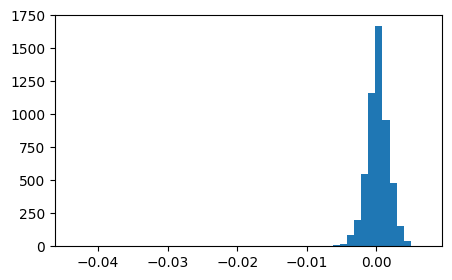

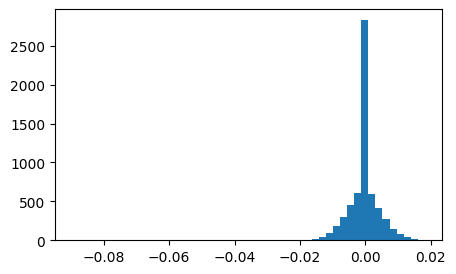

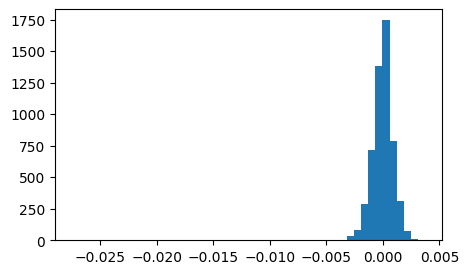

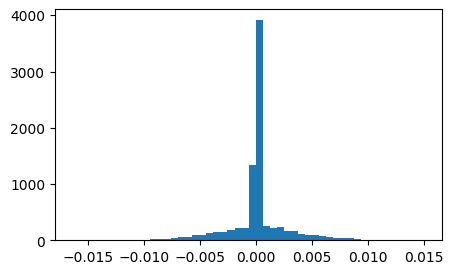

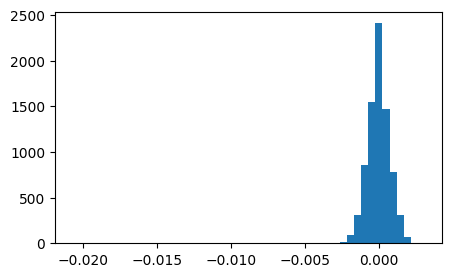

...

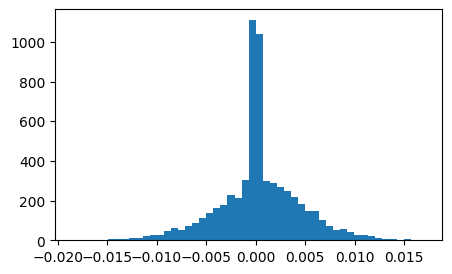

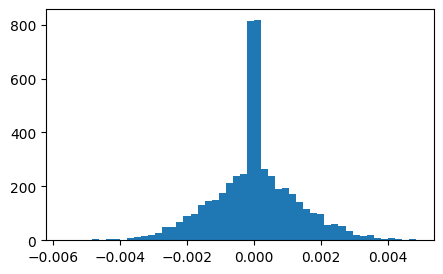

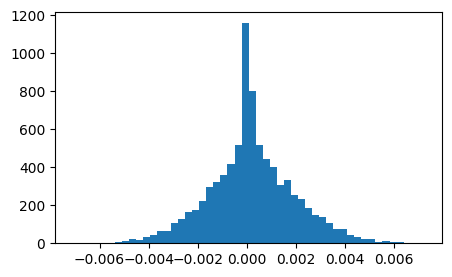

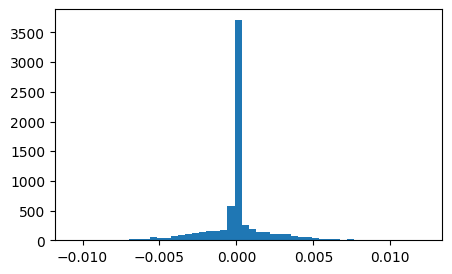

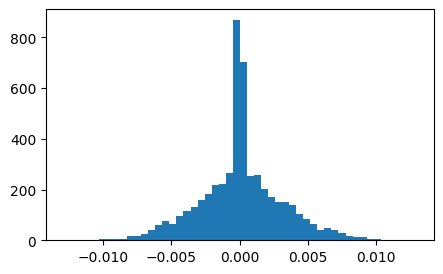

In [28]:
# How many connections have directionality of connections different from zero
for sub_i,sub in enumerate(subjects_code):
    print(sub)
    m = GEC_sub[sub_i]
    diffs = []
    for i in range(236):
        for j in range(236):
            if j<i:
                if m[i,j]-m[j,i] != 0:
                    diffs.append(m[i,j]-m[j,i])
    print(len(diffs))
    fig = plt.figure(figsize=(5,3))
    plt.hist(diffs, bins=50)
    # break

# Correlation between FC and SC

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: Brunner-Munzel test, P_val:1.941e-02 W=-2.516e+00
B vs. NB: Brunner-Munzel test, P_val:2.569e-01 W=1.182e+00
C vs. NB: Brunner-Munzel test, P_val:6.312e-01 W=-4.924e-01


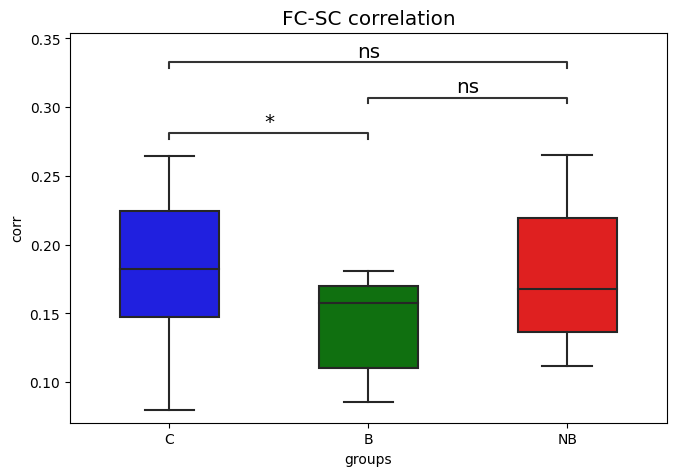

In [29]:
my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
annot_test =  'Brunner-Munzel'
# annot_test = 't-test_ind'
pairs = [('C','B'),('C','NB'),('B','NB')]
corr = []
groupz = []
patients_list = os.listdir(pardir+'/data/StructuralConnectivity/patients')
for sub_i, sub in enumerate(subjects_code):
    group = subjects_group[sub_i]
    fc = FC_sub[sub_i]
    if group=='C':
        sc = SC_healthy
        corr.append(pearsonr(fc.flatten(),sc.flatten())[0])
        groupz.append(group)
    elif group=='B':
        idx = [pat_i for pat_i,pat in enumerate(patients_list) if sub in pat][0]
        sc = SC_patients[idx]
        corr.append(pearsonr(fc.flatten(),sc.flatten())[0])
        groupz.append(group)
    elif group=='NB':
        idx = [pat_i for pat_i,pat in enumerate(patients_list) if sub in pat][0]
        sc = SC_patients[idx]
        corr.append(pearsonr(fc.flatten(),sc.flatten())[0])
        groupz.append(group)
        
df = pd.DataFrame({'corr':corr, 'groups':groupz})
hue_plot_params = {
    'data': df,
    'x': 'groups',
    'y': 'corr',
    "order": ['C','B','NB'],
    "palette": my_pal
}
fig,ax = plt.subplots(1,1, figsize=(7,5))
with sns.plotting_context("notebook", font_scale = 1.2):
    sns.boxplot(**hue_plot_params, showfliers=False, width=0.5, ax=ax)
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test=annot_test, text_format='star', loc='inside')
                        # ,comparisons_correction='Benjamini-Hochberg')
    _, stat = annotator.apply_and_annotate()
    plt.title('FC-SC correlation')
    plt.tight_layout()

# plt.savefig('output_global/FC-SC_correlation.png', dpi=200)

# Correlation between EC and SC

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: Brunner-Munzel test, P_val:4.359e-01 W=8.014e-01
B vs. NB: Brunner-Munzel test, P_val:1.326e-01 W=-1.600e+00
C vs. NB: Brunner-Munzel test, P_val:2.634e-01 W=-1.179e+00


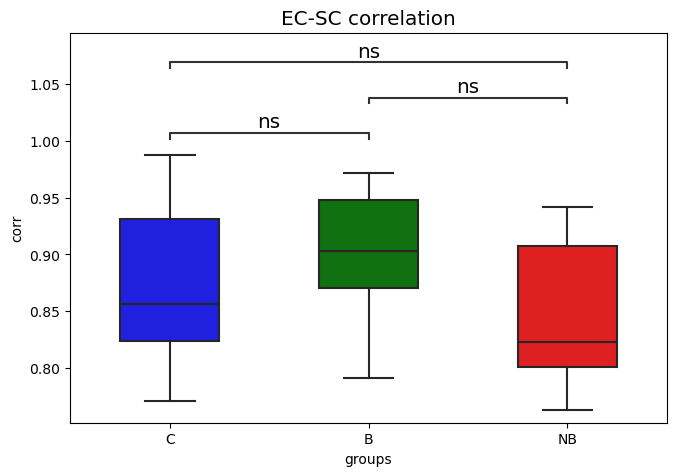

In [32]:
my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
annot_test =  'Brunner-Munzel'
# annot_test = 't-test_ind'
pairs = [('C','B'),('C','NB'),('B','NB')]
corr = []
groupz = []
patients_list = os.listdir('../data/StructuralConnectivity/patients')
for sub_i, sub in enumerate(subjects_code):
    group = subjects_group[sub_i]
    ec = GEC_sub[sub_i]
    if group=='C':
        sc = SC_healthy
        corr.append(pearsonr(ec.flatten(),sc.flatten())[0])
        groupz.append(group)
    elif group=='B':
        idx = [pat_i for pat_i,pat in enumerate(patients_list) if sub in pat][0]
        sc = SC_patients[idx]
        corr.append(pearsonr(ec.flatten(),sc.flatten())[0])
        groupz.append(group)
    elif group=='NB':
        idx = [pat_i for pat_i,pat in enumerate(patients_list) if sub in pat][0]
        sc = SC_patients[idx]
        corr.append(pearsonr(ec.flatten(),sc.flatten())[0])
        groupz.append(group)
        
df = pd.DataFrame({'corr':corr, 'groups':groupz})
hue_plot_params = {
    'data': df,
    'x': 'groups',
    'y': 'corr',
    "order": ['C','B','NB'],
    "palette": my_pal
}
fig,ax = plt.subplots(1,1, figsize=(7,5))
with sns.plotting_context("notebook", font_scale = 1.2):
    sns.boxplot(**hue_plot_params, showfliers=False, width=0.5, ax=ax)
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test=annot_test, text_format='star', loc='inside')
                        # ,comparisons_correction='Benjamini-Hochberg')
    _, stat = annotator.apply_and_annotate()
    plt.title('EC-SC correlation')
    plt.tight_layout()

plt.savefig('output_global/EC-SC_correlation.png', dpi=200)

# Correlation between FC and EC

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: Brunner-Munzel test, P_val:3.881e-02 W=-2.227e+00
B vs. NB: Brunner-Munzel test, P_val:2.838e-02 W=2.471e+00
C vs. NB: Brunner-Munzel test, P_val:4.550e-01 W=7.732e-01


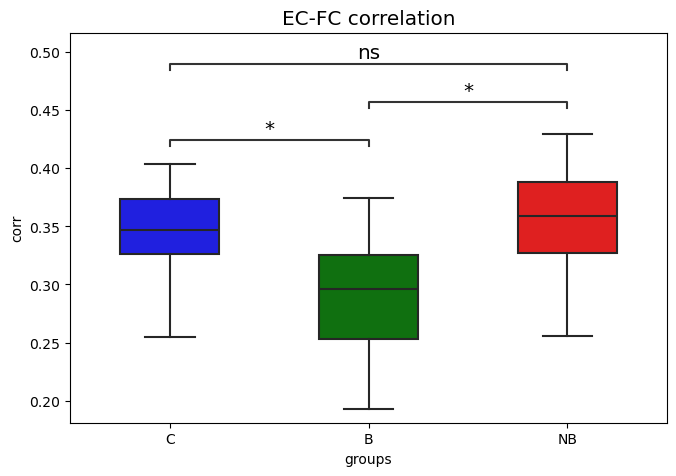

In [33]:
my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
annot_test =  'Brunner-Munzel'
# annot_test = 't-test_ind'
pairs = [('C','B'),('C','NB'),('B','NB')]
corr = []
groupz = []
patients_list = os.listdir('../data/StructuralConnectivity/patients')
for sub_i, sub in enumerate(subjects_code):
    group = subjects_group[sub_i]
    ec = GEC_sub[sub_i]
    fc = FC_sub[sub_i]
    if group=='C':
        sc = SC_healthy
        corr.append(pearsonr(ec.flatten(),fc.flatten())[0])
        groupz.append(group)
    elif group=='B':
        idx = [pat_i for pat_i,pat in enumerate(patients_list) if sub in pat][0]
        sc = SC_patients[idx]
        corr.append(pearsonr(ec.flatten(),fc.flatten())[0])
        groupz.append(group)
    elif group=='NB':
        idx = [pat_i for pat_i,pat in enumerate(patients_list) if sub in pat][0]
        sc = SC_patients[idx]
        corr.append(pearsonr(ec.flatten(),fc.flatten())[0])
        groupz.append(group)
        
df = pd.DataFrame({'corr':corr, 'groups':groupz})
hue_plot_params = {
    'data': df,
    'x': 'groups',
    'y': 'corr',
    "order": ['C','B','NB'],
    "palette": my_pal
}
fig,ax = plt.subplots(1,1, figsize=(7,5))
with sns.plotting_context("notebook", font_scale = 1.2):
    sns.boxplot(**hue_plot_params, showfliers=False, width=0.5, ax=ax)
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test=annot_test, text_format='star', loc='inside')
                        # ,comparisons_correction='Benjamini-Hochberg')
    _, stat = annotator.apply_and_annotate()
    plt.title('EC-FC correlation')
    plt.tight_layout()

plt.savefig('output_global/EC-FC_correlation.png', dpi=200)

# Check FC-SC connectivity per macro areas

HEMISPHERE  RH
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 3.33e-03 < p <= 1.67e-02
      **: 3.33e-04 < p <= 3.33e-03
     ***: 3.33e-05 < p <= 3.33e-04
    ****: p <= 3.33e-05

Control_C vs. Control_B: t-test independent samples, P_val:7.277e-02 t=1.880e+00
Attention_C vs. Attention_B: t-test independent samples, P_val:6.132e-02 t=1.967e+00
Auditory_C vs. Auditory_B: t-test independent samples, P_val:3.072e-01 t=1.044e+00
SomatoMotor_C vs. SomatoMotor_B: t-test independent samples, P_val:3.417e-01 t=9.709e-01
Visual_C vs. Visual_B: t-test independent samples, P_val:9.098e-03 t=2.848e+00
Subcortical_C vs. Subcortical_B: t-test independent samples, P_val:6.826e-01 t=4.142e-01
Language_B vs. Language_NB: t-test independent samples, P_val:6.647e-01 t=-4.428e-01
Control_B vs. Control_NB: t-test independent samples, P_val:7.561e-02 t=-1.919e+00
Attention_B vs. Attention_NB: t-test independent samples, P_val:5.656e-02 t=-2.078e+00
Auditory_B vs. Auditory_NB: t-test independ

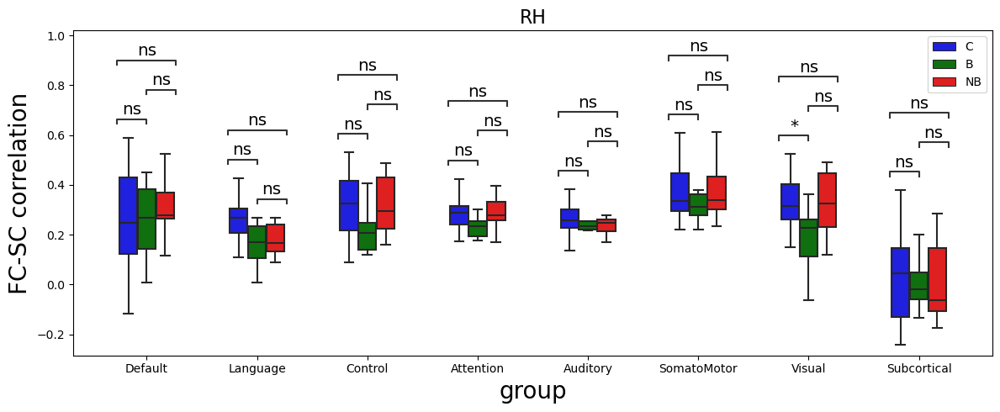

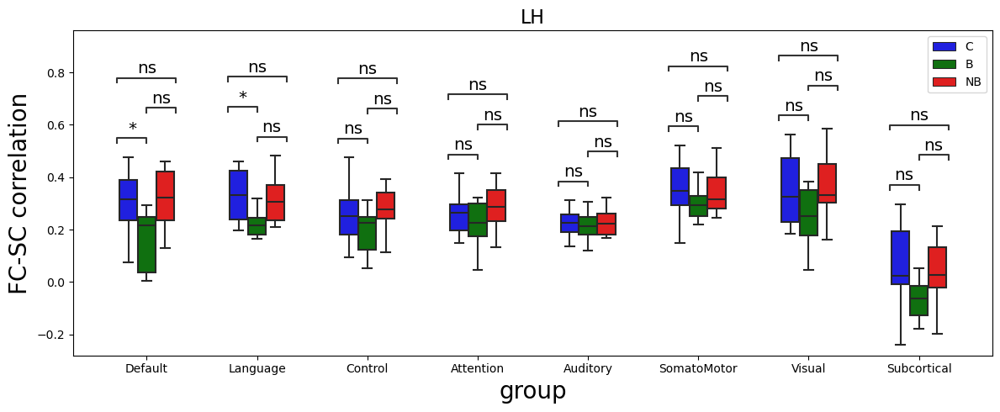

In [68]:
for hemi in ['RH','LH']:
    print('HEMISPHERE ', hemi)
    corr_per_net = []
    nets = []
    groups = []
    for sub in range(n_sub): # Loop over subjects
        group = subjects_group[sub]
        if group=='C':
            sc = SC_healthy
        else:
            idx = [pat_i for pat_i,pat in enumerate(patients_list) if subjects_code[sub] in pat][0]
            sc = SC_patients[idx]
        fc = FC_sub[sub]
                
        for network in super_networks: # Loop over all the networks
            network_idx = atlas_labels.loc[atlas_labels['super network']==network]
            network_idx = network_idx.loc[network_idx['hemisphere']==hemi].index.values
            fc_net = fc[network_idx,:].mean(axis=0)
            sc_net = sc[network_idx,:].mean(axis=0)
            corr = pearsonr(fc_net,sc_net)[0]
            # print(corr, network, group)
            
            
            corr_per_net.append(corr)
            nets.append(network)
            groups.append(group)

    df = pd.DataFrame({'corr':corr_per_net, 'network':nets, 'groups':groups})
    groups_order = ['C', 'B', 'NB']
    pairs = [[(k,'C'),(k,'B')] for k in super_networks] + \
             [[(k,'C'),(k,'NB')] for k in super_networks] + \
             [[(k,'B'),(k,'NB')] for k in super_networks]
    my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
    #     annot_test =  'Brunner-Munze'
    annot_test = 't-test_ind'
    
    hue_plot_params = {
        'data': df,
        'x': 'network',
        'y': 'corr',
        "order": super_networks,
        "hue": 'groups',
        "hue_order": groups_order,
        "palette": my_pal
    }
    
    fig,ax = plt.subplots(1,1, figsize=(12,5))
    with sns.plotting_context("notebook", font_scale = 1.2):
        # Create new plot
    #     ax = get_log_ax()
    
        # Plot with seaborn
        sns.boxplot(ax=ax, **hue_plot_params,
                         showfliers=False,
                         width=0.5)
        ax.set_xlabel('group',fontsize=20)
        ax.set_ylabel('FC-SC correlation', fontsize=20)
    
        # Add annotations
        annotator = Annotator(ax, pairs, **hue_plot_params)
        annotator.configure(test=annot_test, text_format='star', loc='inside')
                            # ,comparisons_correction='Benjamini-Hochberg')
        annotator._pvalue_format.pvalue_thresholds =  [[0.0001/3, '****'], [0.001/3, '***'], [0.01/3, '**'], [0.05/3, '*'], [1, 'ns']]
        _, stat = annotator.apply_and_annotate()
    
        # Label and show
        plt.legend(loc='upper right', fontsize=10, bbox_to_anchor=(1.0,1.0))
        plt.title(hemi, fontsize=16)
    plt.tight_layout()

    # plt.savefig('output_global/FC-SC_correlation_networks_'+hemi+'.png', dpi=200)

# Check EC-SC connectivity per macro areas

# Check EC-FC connectivity per macro areas

HEMISPHERE  RH
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 3.33e-03 < p <= 1.67e-02
      **: 3.33e-04 < p <= 3.33e-03
     ***: 3.33e-05 < p <= 3.33e-04
    ****: p <= 3.33e-05

Control_C vs. Control_B: t-test independent samples, P_val:9.675e-02 t=1.732e+00
Attention_C vs. Attention_B: t-test independent samples, P_val:1.432e-02 t=2.650e+00
Auditory_C vs. Auditory_B: t-test independent samples, P_val:4.477e-02 t=2.123e+00
SomatoMotor_C vs. SomatoMotor_B: t-test independent samples, P_val:1.068e-01 t=1.678e+00
Visual_C vs. Visual_B: t-test independent samples, P_val:1.122e-02 t=2.757e+00
Subcortical_C vs. Subcortical_B: t-test independent samples, P_val:4.257e-01 t=8.109e-01
Language_B vs. Language_NB: t-test independent samples, P_val:2.894e-01 t=-1.101e+00
Control_B vs. Control_NB: t-test independent samples, P_val:5.295e-02 t=-2.114e+00
Attention_B vs. Attention_NB: t-test independent samples, P_val:2.120e-01 t=-1.308e+00
Auditory_B vs. Auditory_NB: t-test independ

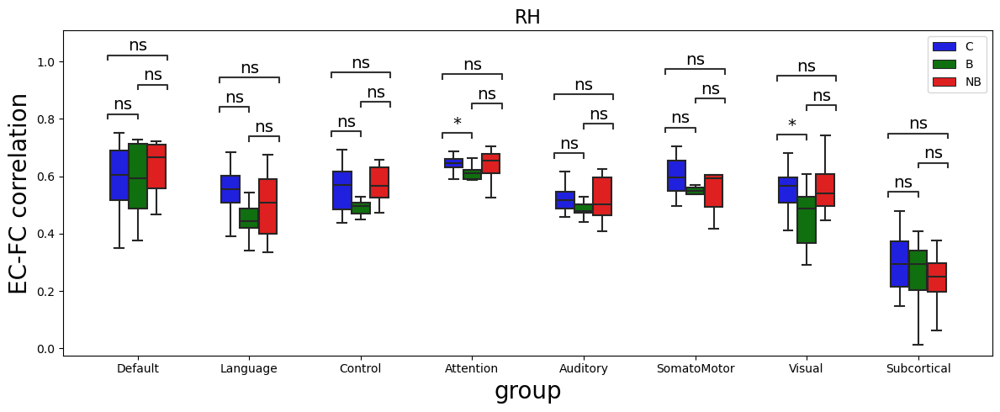

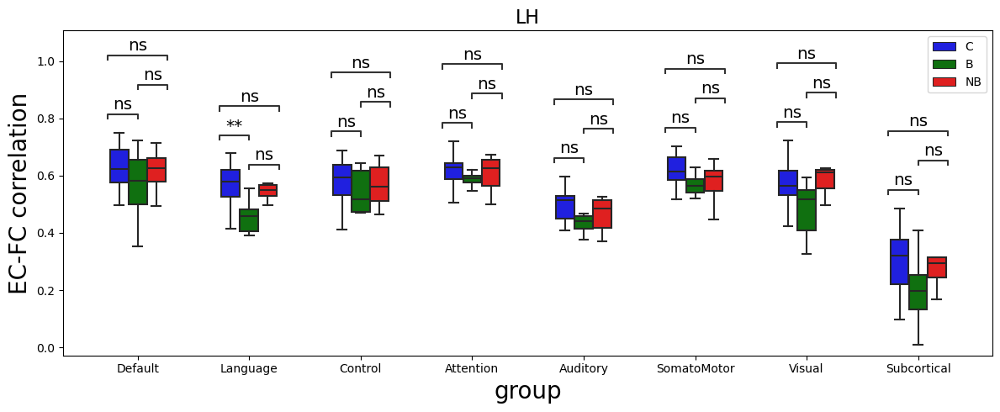

In [43]:
for hemi in ['RH','LH']:
    print('HEMISPHERE ', hemi)
    corr_per_net = []
    nets = []
    groups = []
    for sub in range(n_sub): # Loop over subjects
        group = subjects_group[sub]
        fc = FC_sub[sub]
        ec = GEC_sub[sub]
                
        for network in super_networks: # Loop over all the networks
            network_idx = atlas_labels.loc[atlas_labels['super network']==network]
            network_idx = network_idx.loc[network_idx['hemisphere']==hemi].index.values
            ec_net = ec[network_idx,:].mean(axis=0)
            fc_net = fc[network_idx,:].mean(axis=0)
            corr = pearsonr(ec_net,fc_net)[0]
            # print(corr, network, group)
            
            
            corr_per_net.append(corr)
            nets.append(network)
            groups.append(group)

    df = pd.DataFrame({'corr':corr_per_net, 'network':nets, 'groups':groups})
    groups_order = ['C', 'B', 'NB']
    pairs = [[(k,'C'),(k,'B')] for k in super_networks] + \
             [[(k,'C'),(k,'NB')] for k in super_networks] + \
             [[(k,'B'),(k,'NB')] for k in super_networks]
    my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
    #     annot_test =  'Brunner-Munze'
    annot_test = 't-test_ind'
    
    hue_plot_params = {
        'data': df,
        'x': 'network',
        'y': 'corr',
        "order": super_networks,
        "hue": 'groups',
        "hue_order": groups_order,
        "palette": my_pal
    }
    
    fig,ax = plt.subplots(1,1, figsize=(12,5))
    with sns.plotting_context("notebook", font_scale = 1.2):
        # Create new plot
    #     ax = get_log_ax()
    
        # Plot with seaborn
        sns.boxplot(ax=ax, **hue_plot_params,
                         showfliers=False,
                         width=0.5)
        ax.set_xlabel('group',fontsize=20)
        ax.set_ylabel('EC-FC correlation', fontsize=20)
    
        # Add annotations
        annotator = Annotator(ax, pairs, **hue_plot_params)
        annotator.configure(test=annot_test, text_format='star', loc='inside')
                            # ,comparisons_correction='Benjamini-Hochberg')
        annotator._pvalue_format.pvalue_thresholds =  [[0.0001/3, '****'], [0.001/3, '***'], [0.01/3, '**'], [0.05/3, '*'], [1, 'ns']]
        _, stat = annotator.apply_and_annotate()
    
        # Label and show
        plt.legend(loc='upper right', fontsize=10, bbox_to_anchor=(1.0,1.0))
        plt.title(hemi, fontsize=16)
    plt.tight_layout()

    plt.savefig('output_global/EC-FC_correlation_networks_'+hemi+'.png', dpi=200)

# Looking at local stuff (interesting nodes)

In [35]:
################
## 7 NETWORKS ##
################
cross = False
both_hemi_net = True
out_link = False
in_link = not out_link

state_or_net = 'state'
if state_or_net == 'net':
    len_nets = 7
    nets = networks
    df_lab = 'ROI_network'
    bonf = 14
else:
    len_nets = 3
    nets = ['DMN', 'Somatosensory','Visual']
    df_lab = 'ROI_state'
    bonf = 3*2*4

all_areas = atlas_labels['ROI_name'].values
# Connectivity between a seed network and the other networks
'THA_DP', 'THA_VP', 'THA_DA', 'THA_VA'
seeddini = [['THA_DP', 'THA_VP'],['THA_DA', 'THA_VA'], ['SC'], ['LGN']]
seeddini_labels = ['posterior thal', 'anterior thal', 'SC', 'LGN']
seed_network = 'Subcortical'
networks_minus = [net for net in nets if net!=seed_network]

p_vals = [] # Store the p-values of all the comparisons I perform
p_vals_dic = {}
for s in seeddini_labels:
    p_vals_dic[s+' '+'LH'] = {}
    p_vals_dic[s+' '+'RH'] = {}

    
for seed_i, seed_areas in enumerate(seeddini):
    for hemi in ['RH','LH']:
        not_hemi = [h for h in ['RH','LH'] if h!=hemi][0]
        print('HEMISPHERE ', hemi, ' ',seeddini_labels[seed_i])
        net_conn_sub = np.empty((0,len_nets))
        for sub in range(n_sub): # Loop over subjects
            GEC = GEC_sub[sub]
            # SEED AREA
            areas = []
            for seed in seed_areas:
                areas += [a for a in all_areas if hemi+'_'+seed in a]
            areas = [atlas_labels.loc[atlas_labels['ROI_name']==a].index.values[0] for a in areas] 
            # print(areas)
            if out_link:
                conn = GEC[areas,:].mean(axis=0) # out-link with all the brain
            elif in_link:
                conn = GEC[:,areas].mean(axis=1) # in-link with all the brain
            
            # print(conn.shape)
            net_conn = np.empty((0,))
            for network in networks_minus: # Loop over all the networks
                if network!=seed_network:
                    # Hemisphere for the target network
                    if not cross:
                        hemi_net = hemi
                    else:
                        hemi_net = [h for h in ['RH','LH'] if h!=hemi][0]
                    network_idx = atlas_labels.loc[atlas_labels[df_lab]==network]
                    if not both_hemi_net:
                        network_idx = network_idx.loc[network_idx['Hemisphere']==hemi_net].index.values
                    else:
                        network_idx = network_idx.index.values # Both the empisphere for the network
                    # print(np.array([conn[network_idx].mean()]).shape)
                    net_conn = np.concatenate((net_conn, np.array([conn[network_idx].mean()])), axis=0)
                    # print(net_conn.shape)
            net_conn_sub = np.concatenate((net_conn_sub , net_conn[np.newaxis,:]),axis=0)
        # net_conn_sub.shape
        
        m = np.zeros(atlas.shape)
        target_net_i = atlas_labels.loc[atlas_labels[df_lab]==seed_network]
        target_net_i = target_net_i.loc[target_net_i['Hemisphere']==hemi].index.values
        for a_idx in  target_net_i:
            m[np.where(atlas==a_idx+1)] = -1
        state_conn = net_conn_sub
        state_conn_group = [[],[],[]] # divide per group
        for i, group in enumerate(subjects_group):
            if group=='C':
                state_conn_group[0].append(state_conn[i])
            elif group=='B':
                state_conn_group[1].append(state_conn[i])
            elif group=='NB':
                state_conn_group[2].append(state_conn[i])
        state_conn_group_mean = [np.mean(state_conn_group[0], axis=0), np.mean(state_conn_group[1], axis=0), np.mean(state_conn_group[2], axis=0)]
        # plot_arrays(state_conn_group_mean)
    
        # statistics
        for i in range(len_nets):
            stat, pval = brunnermunzel(np.asarray(state_conn_group[1])[:,i], np.asarray(state_conn_group[2])[:,i])
#             if networks_minus[i]=='Limbic':
#                 print(networks_minus[i], stat, pval)
            p_vals.append(pval)
            p_vals_dic[seeddini_labels[seed_i]+' '+hemi][networks_minus[i]] = {'stat':stat, 'pval':pval}
            if pval*bonf<0.05:
                print(networks_minus[i], stat, pval*bonf)
                networks_minus_i = atlas_labels.loc[atlas_labels[df_lab]==networks_minus[i]]
                networks_minus_i = networks_minus_i.loc[networks_minus_i['Hemisphere']==hemi].index.values
                for a_idx in networks_minus_i:
                    m[np.where(atlas==a_idx+1)] = 1

    print('')
    
p_vals_corr = multipletests(p_vals, alpha=0.05, method='fdr_bh')[1]
# p_vals_corr = p_vals

print('corrected results')
c = 0
for seed_i, seed_areas in enumerate(seeddini):
    for hemi in ['RH','LH']:
        print('HEMISPHERE ', hemi, ' ',seeddini_labels[seed_i])

        for i in range(len_nets):
            stat = p_vals_dic[seeddini_labels[seed_i]+' '+hemi][networks_minus[i]]['stat']
            p = p_vals_corr[c]
            if p<0.05:
                print(networks_minus[i], stat, p)
                networks_minus_i = atlas_labels.loc[atlas_labels[df_lab]==networks_minus[i]]
                networks_minus_i = networks_minus_i.loc[networks_minus_i['Hemisphere']==hemi].index.values
            c += 1
    print('')

HEMISPHERE  RH   posterior thal
HEMISPHERE  LH   posterior thal

HEMISPHERE  RH   anterior thal
HEMISPHERE  LH   anterior thal

HEMISPHERE  RH   SC
HEMISPHERE  LH   SC
Somatosensory -12.549900398011134 6.612896468857751e-07

HEMISPHERE  RH   LGN
HEMISPHERE  LH   LGN

corrected results
HEMISPHERE  RH   posterior thal
HEMISPHERE  LH   posterior thal

HEMISPHERE  RH   anterior thal
HEMISPHERE  LH   anterior thal

HEMISPHERE  RH   SC
HEMISPHERE  LH   SC
Somatosensory -12.549900398011134 6.612896468857751e-07

HEMISPHERE  RH   LGN
HEMISPHERE  LH   LGN



In [38]:
atlas_labels['ROI_name'].unique()

array(['LH_Vis_1', 'LH_Vis_2', 'LH_Vis_3', 'LH_Vis_4', 'LH_Vis_5',
       'LH_Vis_6', 'LH_Vis_7', 'LH_Vis_8', 'LH_Vis_9', 'LH_Vis_10',
       'LH_Vis_11', 'LH_Vis_12', 'LH_Vis_13', 'LH_Vis_14', 'LH_SomMot_1',
       'LH_SomMot_2', 'LH_SomMot_3', 'LH_SomMot_4', 'LH_SomMot_5',
       'LH_SomMot_6', 'LH_SomMot_7', 'LH_SomMot_8', 'LH_SomMot_9',
       'LH_SomMot_10', 'LH_SomMot_11', 'LH_SomMot_12', 'LH_SomMot_13',
       'LH_SomMot_14', 'LH_SomMot_15', 'LH_SomMot_16',
       'LH_DorsAttn_Post_1', 'LH_DorsAttn_Post_2', 'LH_DorsAttn_Post_3',
       'LH_DorsAttn_Post_4', 'LH_DorsAttn_Post_5', 'LH_DorsAttn_Post_6',
       'LH_DorsAttn_Post_7', 'LH_DorsAttn_Post_8', 'LH_DorsAttn_Post_9',
       'LH_DorsAttn_Post_10', 'LH_DorsAttn_FEF_1', 'LH_DorsAttn_FEF_2',
       'LH_DorsAttn_PrCv_1', 'LH_SalVentAttn_ParOper_1',
       'LH_SalVentAttn_ParOper_2', 'LH_SalVentAttn_ParOper_3',
       'LH_SalVentAttn_FrOperIns_1', 'LH_SalVentAttn_FrOperIns_2',
       'LH_SalVentAttn_FrOperIns_3', 'LH_SalVentAttn_

# Average (per network) EC plot

100%|████████████████████████████████████████████████████████████████████████████████████████████████| 33/33 [00:11<00:00,  2.95it/s]


(33, 16, 16)


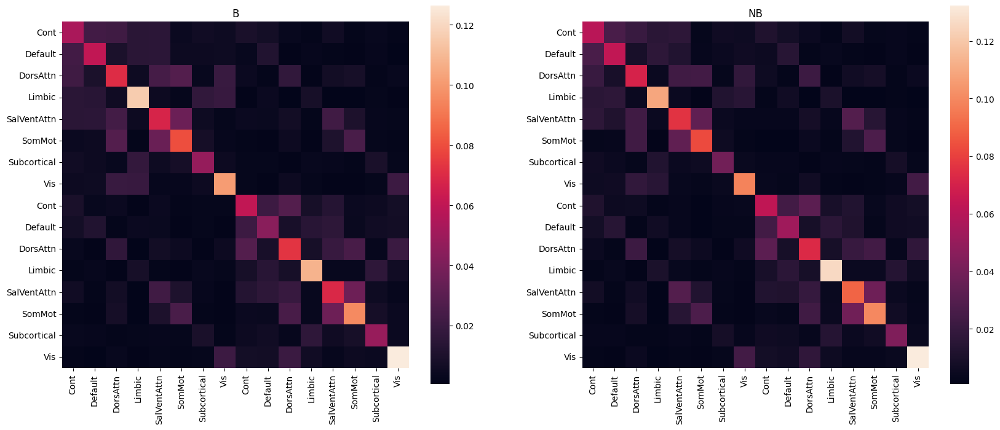

In [228]:
len_net = len(networks)
mean_GEC_all = np.empty((n_sub,2*len_net,2*len_net))
for sub in tqdm(range(n_sub)): # Loop over subjects
    GEC = GEC_sub[sub]
    mean_GEC = np.empty((2*len_net,2*len_net))
    for hemi_row_idx, hemi_row in enumerate(['RH','LH']):
        for hemi_col_idx, hemi_col in enumerate(['RH','LH']):
            mean_GEC_quad = np.empty((len_net,len_net))
            for i,network_row in enumerate(networks): # Loop over all the  networks
                for j,network_col in enumerate(networks):
                    network_idx_row = atlas_labels.loc[atlas_labels['ROI_network']==network_row]
                    network_idx_row = network_idx_row.loc[network_idx_row['Hemisphere']==hemi_row].index.values
        
                    network_idx_col = atlas_labels.loc[atlas_labels['ROI_network']==network_col]
                    network_idx_col = network_idx_col.loc[network_idx_col['Hemisphere']==hemi_col].index.values
                    
                    conn = GEC[network_idx_row,:]
                    conn = conn[:,network_idx_col]
                    mean_GEC_quad[i,j] = conn.mean()
                    # print(conn.shape)
            mean_GEC[len_net*(hemi_row_idx):len_net*(hemi_row_idx+1),len_net*(hemi_col_idx):len_net*(hemi_col_idx+1)] = mean_GEC_quad
    mean_GEC_all[sub,:,:] = mean_GEC
        
print(mean_GEC_all.shape)   

fig, axs = plt.subplots(1, 2, figsize=(20,8))
for i,group in enumerate(['B','NB']):
    group_idx = np.where(subjects_group==group)
    mats = mean_GEC_all[group_idx]
    sns.heatmap(mats.mean(axis=0), ax=axs[i], square=True,
                    xticklabels=networks.tolist()+networks.tolist(), 
                    yticklabels=networks.tolist()+networks.tolist())
    axs[i].set_title(group)

Text(0.5, 1.0, 'NB')

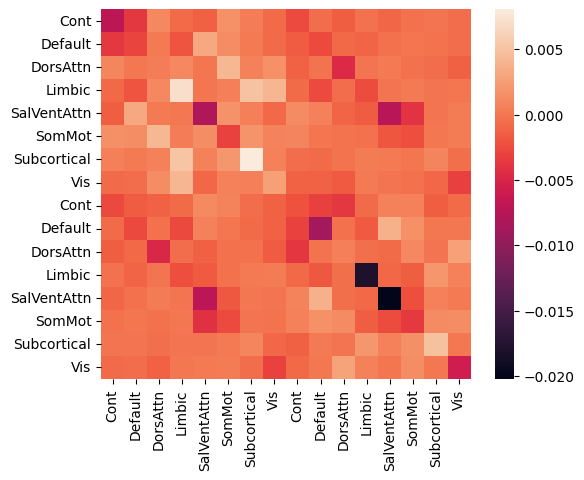

In [232]:
B_GEC = np.asarray(mean_GEC_all)[np.where(subjects_group=='B')].mean(axis=0)
NB_GEC = np.asarray(mean_GEC_all)[np.where(subjects_group=='NB')].mean(axis=0)

subtr_GEC = B_GEC - NB_GEC
sns.heatmap(subtr_GEC, square=True,
                xticklabels=networks.tolist()+networks.tolist(), 
                yticklabels=networks.tolist()+networks.tolist())
axs[i].set_title(group)

In [275]:
sub_areas = [['LH_THA_DP','LH_THA_VP'], ['RH_THA_DP', 'RH_THA_VP'], ['LH_THA_DA', 'LH_THA_VA'], ['RH_THA_DA',
            'RH_THA_VA'],['LH_SC'], ['RH_SC'], ['LH_LGN'], ['RH_LGN']]
sub_lab = ['L post thal', 'R post thal', 'L ant thal', 'R ant thal', 'L SC', 'R SC', 'L LGN', 'R LGN']

1

In [318]:
seeddini = [['LH_THA_DP','LH_THA_VP'], ['RH_THA_DP', 'RH_THA_VP'], ['LH_THA_DA', 'LH_THA_VA'], ['RH_THA_DA',
            'RH_THA_VA'],['LH_SC'], ['RH_SC'], ['LH_LGN'], ['RH_LGN']]

nets_minus_sub = [n for n in networks if n!='Subcortical']

B_GEC = np.asarray(GEC_sub)[np.where(subjects_group=='B')]
NB_GEC = np.asarray(GEC_sub)[np.where(subjects_group=='NB')]

B_GEC.shape
B_GEC_mean = np.empty((8,0,236))
NB_GEC_mean = np.empty((8,0,236))

for sd in seeddini:
    idxs=[]
    for s in sd:
        idx = atlas_labels[atlas_labels['ROI_name']==s].index.values[0]
        idxs.append(idx)
    B_GEC_mean = np.concatenate((B_GEC_mean, B_GEC[:,idxs,:].mean(axis=1)[:,np.newaxis,:]), axis=1)
    NB_GEC_mean = np.concatenate((NB_GEC_mean, NB_GEC[:,idxs,:].mean(axis=1)[:,np.newaxis,:]), axis=1)

print(B_GEC_mean.shape)

mean_vecs = []
for v in [B_GEC_mean, NB_GEC_mean]:
    vec = v
    mean_vec = np.empty((8,8,len(nets_minus_sub)*2))
    c = 0
    for hemi_col_idx, hemi_col in enumerate(['LH','RH']):
        for j,network_col in enumerate(nets_minus_sub):
            network_idx_col = atlas_labels.loc[atlas_labels['ROI_network']==network_col]
            network_idx_col = network_idx_col.loc[network_idx_col['Hemisphere']==hemi_col].index.values

            conn = vec[:,:,network_idx_col]
            mean_vec[:,:,c] = conn.mean(axis=2)
            c += 1
    mean_vecs.append(mean_vec)

(8, 8, 236)


In [319]:
mean_vecs[0].shape

(8, 8, 14)

In [327]:
mean_vecs[0][:,0,3].shape

(8,)

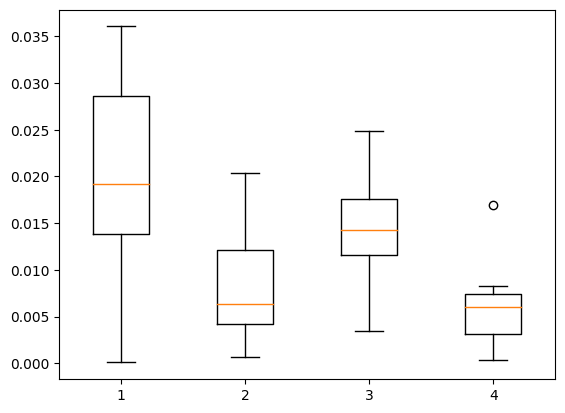

In [345]:
plt.boxplot([mean_vecs[0][:,1,10], mean_vecs[1][:,1,10],mean_vecs[0][:,1,-1], mean_vecs[1][:,1,-1]]);

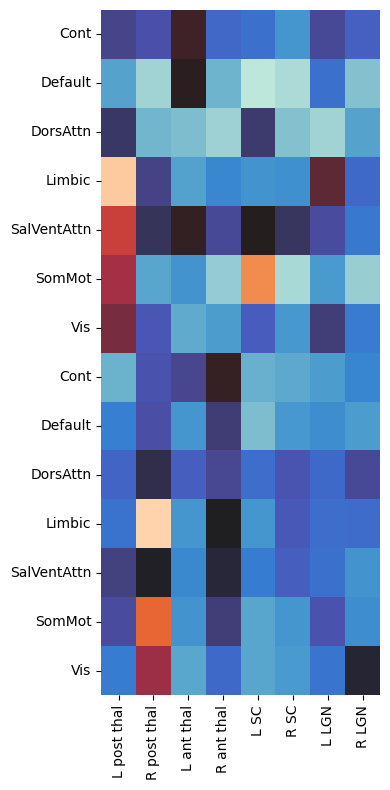

In [354]:
sub_lab = ['L post thal', 'R post thal', 'L ant thal', 'R ant thal', 'L SC', 'R SC', 'L LGN', 'R LGN']
fig = plt.figure(figsize=(4,8))
sns.heatmap((np.median(mean_vecs[0],axis=0)-np.median(mean_vec[1],axis=0)).transpose(),
                xticklabels=sub_lab, 
                yticklabels=nets_minus_sub+nets_minus_sub,annot=False, cbar=False,
                cmap=sns.color_palette("icefire", as_cmap=True))
plt.tight_layout()
plt.savefig(output_folder+'output_global/av_GEC_subcort_net_heatmap.png', dpi=300)

# Graph-based analyisis

## Subject-wise percolation

H001
H002
H005
H006
H008
H009
H010
R006
R011
R013
R014
R017
R018
R020
R023
R024
23M
24F
32M
41F
69M


/tmp/ipykernel_626761/699203751.py:42: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(4.5,3))


71M
73M
112SUB
164SUB
C001
C002
C003
C004
C005
C006
C007
C008


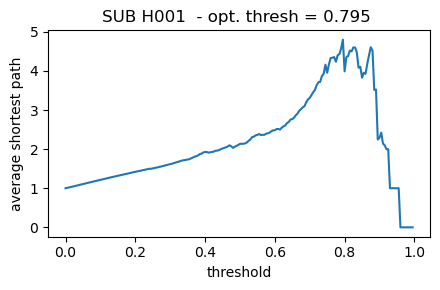

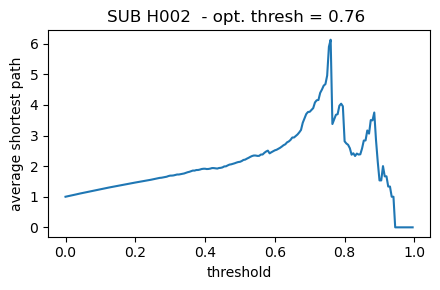

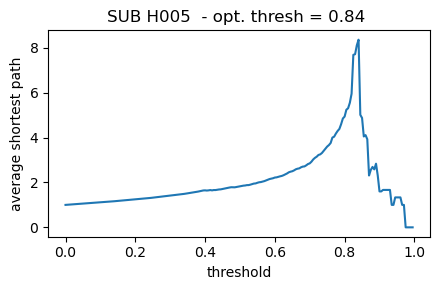

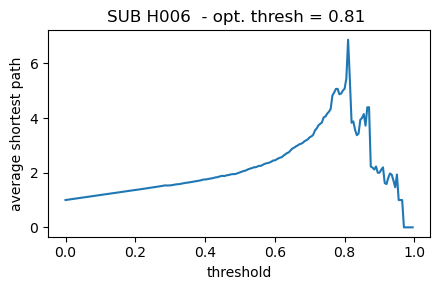

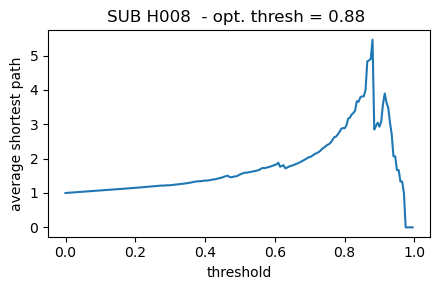

...

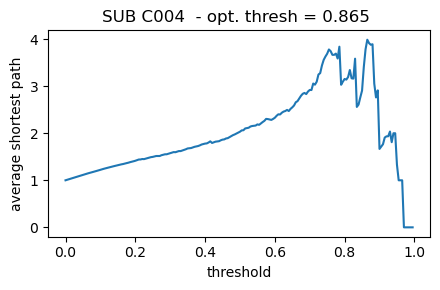

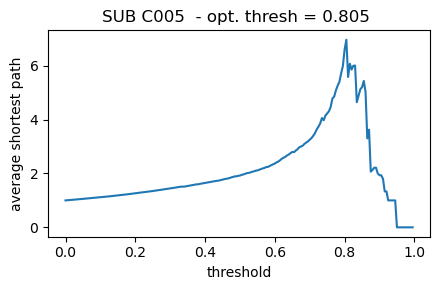

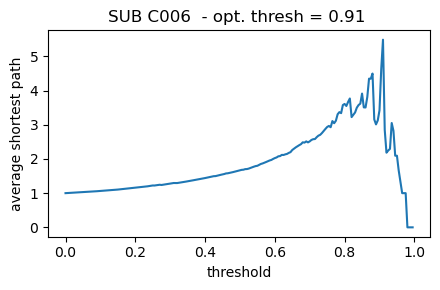

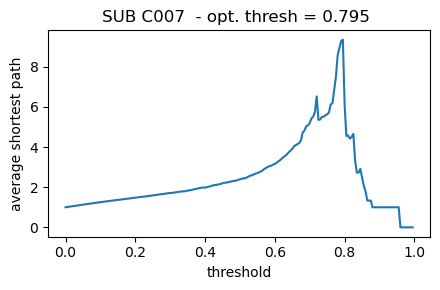

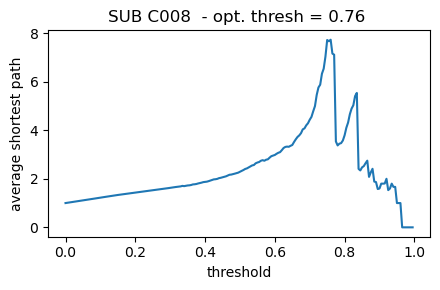

In [46]:
############################
### PERCOLATION ANALYSIS ###
############################

opt_graph_thresh_subs = []

for sub in range(n_sub): # Loop over subjects
    print(subjects_code[sub])
    fc = FC_sub[sub]

    short_path_sub = []
    n_conn_comp_sub = []

    x = np.arange(0,1,0.005) # all the possible threshold values (for the binarization)

    
    short_paths = []
    n_conn_comps = []
    for thresh in x: # Loop over the thresolds for the phase locking matrices
        # Devo thresholdare pure la matrice media
        fc_sub = np.copy(fc)
        fc_sub = np.abs(fc) # Absolutize the pl matrix
        fc_sub[np.where(fc_sub<thresh)] = 0 # Binarize the mean pl matrix according to the current thresh
        fc_sub[np.where(fc_sub>=thresh)] = 1 # Binarize the mean pl matrix according to the current thresh

        G = nx.from_numpy_array(fc_sub)
        # Which metrics I want to look at
        short_paths.append(graph_metrics('average_shortest_path', G, list(mas_list.values())))
        n_conn_comps.append(graph_metrics('number_connected_components', G, list(mas_list.values())))
    short_path_sub.append(short_paths)
    n_conn_comp_sub.append(n_conn_comps)


    # End of the loop over states of the current subject #
    #######################################
    ### PLOTS and find the opt TRESHOLD ###
    #######################################
    
    opt_thresh = x[np.argmax(short_path_sub)]
    opt_graph_thresh_subs.append(opt_thresh)  
    fig = plt.figure(figsize=(4.5,3))
    plt.title('SUB '+subjects_code[sub]+'  - opt. thresh = {} '.format(round(opt_thresh, 4)), fontsize=12)
    plt.plot(x, short_path_sub[0])
    plt.xlabel('threshold')
    plt.ylabel('average shortest path')
    fig.tight_layout()
    # plt.savefig('output/MD_05122023/K'+str(K)+'/Percolation_ShortestPath_sub'+subjects_code[sub]+'_K'+str(K)+'_state'+str(s+1)+'.png',
    #             dpi=200)
                
with open('output_global/opt_graph_thresh.pickle', 'wb') as handle:
    pickle.dump(opt_graph_thresh_subs, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [47]:
with open('output_global/opt_graph_thresh.pickle', 'wb') as handle:
    pickle.dump(opt_graph_thresh_subs, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [48]:
40*16


640

In [49]:
3000/62

48.38709677419355

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 3.33e-03 < p <= 1.67e-02
      **: 3.33e-04 < p <= 3.33e-03
     ***: 3.33e-05 < p <= 3.33e-04
    ****: p <= 3.33e-05

C vs. B: Brunner-Munzel test, P_val:5.355e-02 W=-2.036e+00
B vs. NB: Brunner-Munzel test, P_val:9.693e-04 W=4.243e+00
C vs. NB: Brunner-Munzel test, P_val:1.751e-01 W=1.405e+00
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 3.33e-03 < p <= 1.67e-02
      **: 3.33e-04 < p <= 3.33e-03
     ***: 3.33e-05 < p <= 3.33e-04
    ****: p <= 3.33e-05

C vs. B: Brunner-Munzel test, P_val:5.637e-01 W=5.865e-01
B vs. NB: Brunner-Munzel test, P_val:2.443e-02 W=-2.594e+00
C vs. NB: Brunner-Munzel test, P_val:1.728e-01 W=-1.409e+00
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 3.33e-03 < p <= 1.67e-02
      **: 3.33e-04 < p <= 3.33e-03
     ***: 3.33e-05 < p <= 3.33e-04
    ****: p <= 3.33e-05

C vs. B: Brunner-Munzel test, P_val:6.652e-01 W=-4.405e-01
B vs. NB: Brunner-Munzel test, P_val:1.357e

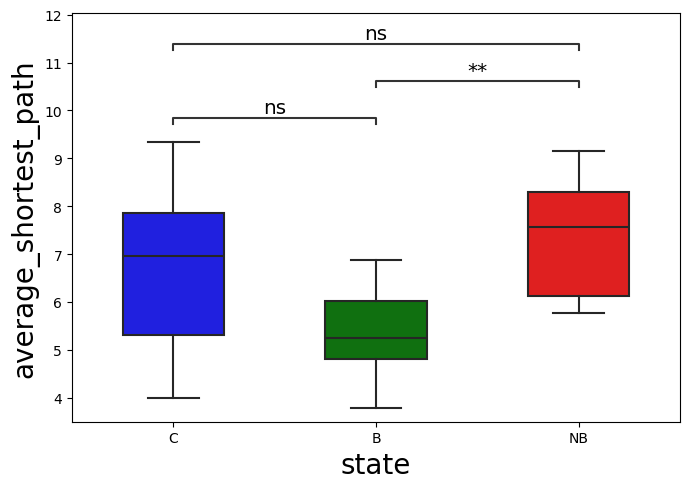

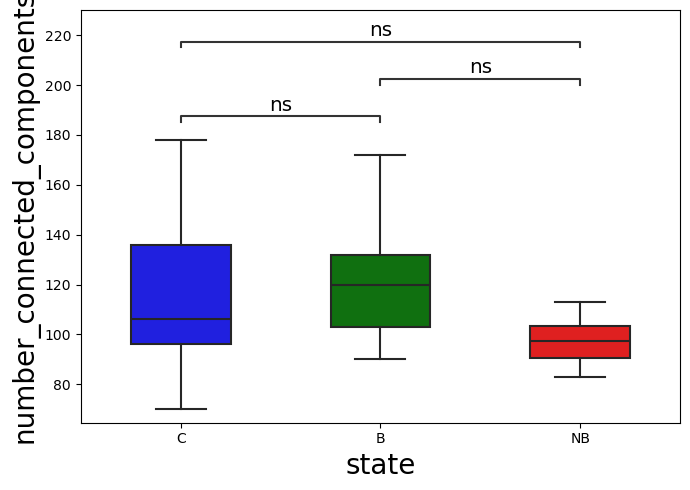

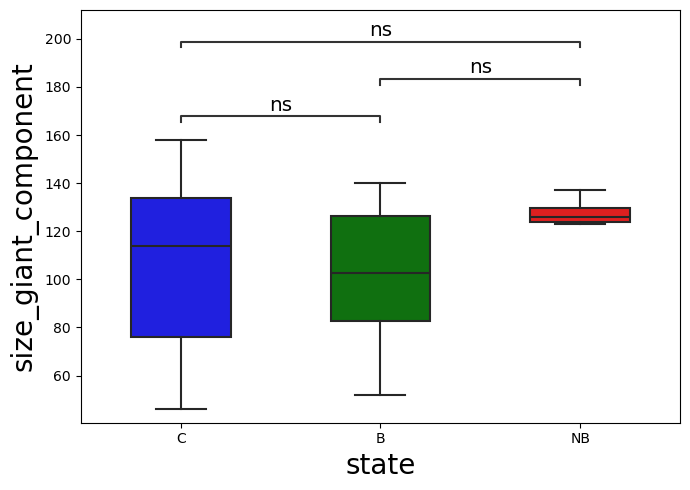

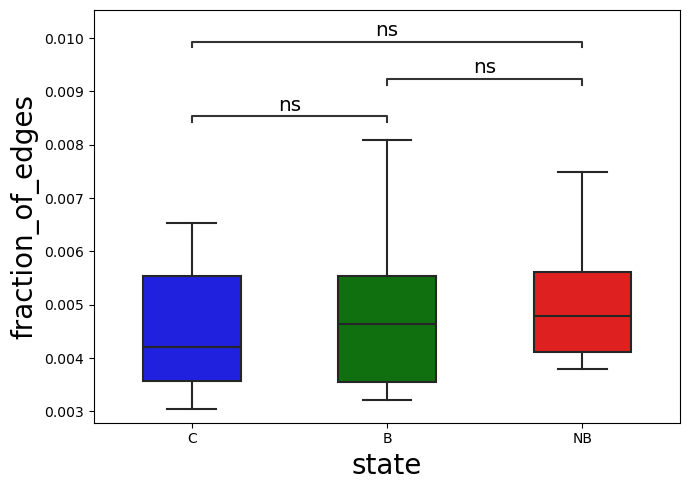

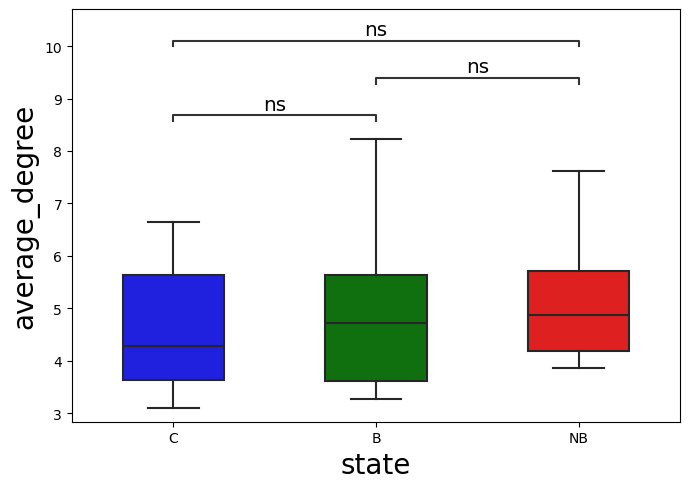

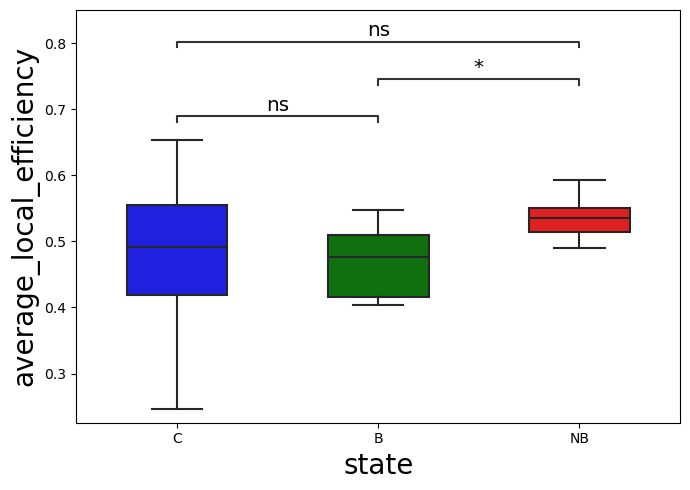

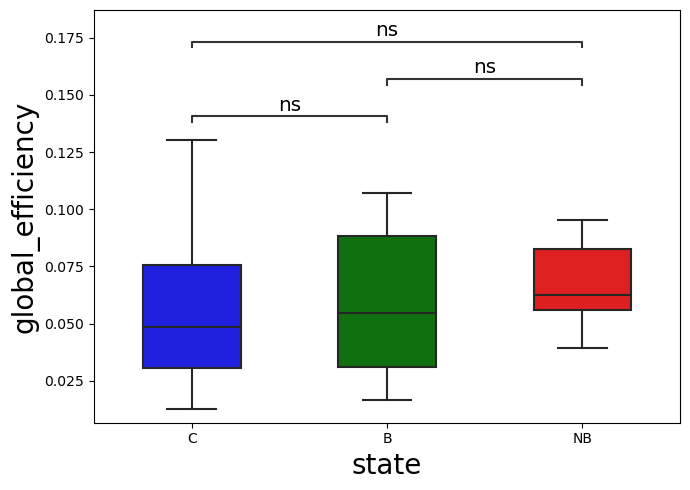

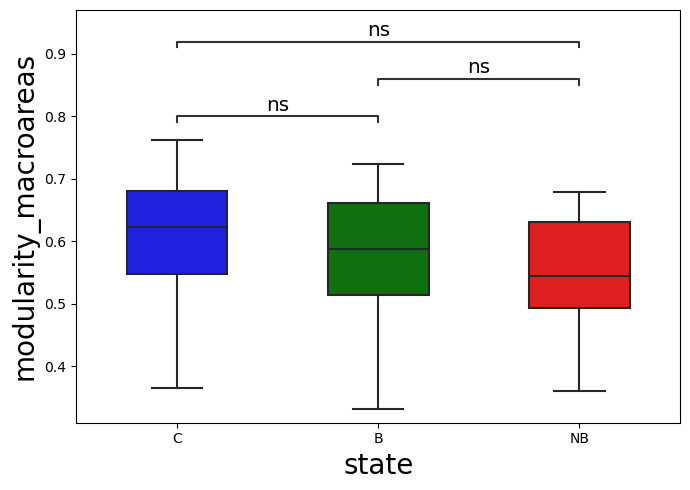

In [57]:
# GLOBAL METRICS


# Once I compute the optimal threshold I can compare metrics between groups
metriche = ['average_shortest_path','number_connected_components','size_giant_component',
            'fraction_of_edges','average_degree',
            'average_local_efficiency', 'global_efficiency', 'modularity_macroareas']



for metrica in metriche:
    mmm = [] # subject-state-wise measures of the current metric
    ggg = [] # group of each subject
    conf_dic = {}
    df_metrics = [] # List which contains dataframe for each state
    metrics = [] # metrics for each state
    for sub in range(n_sub): # Loop over subjects
        fc = FC_sub[sub]
        sub_group = subjects_group[sub]
        thresh = opt_graph_thresh_subs[sub]

        # I have to evaluate the metrics for the three groups
        # Devo thresholdare pure la matrice media
        fc_sub = np.copy(fc)
        fc_sub = np.abs(fc_sub) # Absolutize 
        fc_sub[np.where(fc_sub<thresh)] = 0 # Binarize the mean pl matrix according to the current thresh
        fc_sub[np.where(fc_sub>thresh)] = 1 # Binarize the mean pl matrix according to the current thresh
        G = nx.from_numpy_array(fc_sub)
        measure = graph_metrics(metrica, G, list(mas_list.values()))

        mmm.append(measure)
        ggg.append(sub_group)
    
    df_metrics = pd.DataFrame(data = {metrica: mmm, 'groups': ggg})

    ############
    ### PLOT ###
    ############
    groups_order = ['C', 'B', 'NB']
    pairs = [['C','B'],['C','NB'],['B','NB']]
    my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
    annot_test =  'Brunner-Munzel'
    # annot_test = 't-test_ind'

    hue_plot_params = {
        'data': df_metrics,
        'x': 'groups',
        'y': metrica,
        "order": ['C','B','NB'],
        "palette": my_pal
    }
    
    fig,ax = plt.subplots(1,1, figsize=(7,5))
    with sns.plotting_context("notebook", font_scale = 1.2):
        # Create new plot
    #     ax = get_log_ax()

        # Plot with seaborn
        sns.boxplot(ax=ax, **hue_plot_params,
                         showfliers=False,
                         width=0.5)
        ax.set_xlabel('state',fontsize=20)
        ax.set_ylabel(metrica, fontsize=20)

        # Add annotations
        # Cohen's D calculation
        annotator = Annotator(ax, pairs, **hue_plot_params)
        annotator.configure(test=annot_test, text_format='star', loc='inside')
                            # ,comparisons_correction='Benjamini-Hochberg')
        annotator._pvalue_format.pvalue_thresholds =  [[0.0001/3, '****'], [0.001/3, '***'], [0.01/3, '**'], [0.05/3, '*'], [1, 'ns']]
        _, stat = annotator.apply_and_annotate()
#         annamobbene = annotator.configure(test=annot_test).apply_and_annotate()

        # Label and show
        # plt.legend(loc='lower right', fontsize=10, bbox_to_anchor=(1.2,0))
    plt.tight_layout()

    # plt.savefig('output/MD_05122023/K'+str(K)+'/NO_PL_thresh/GMETRICS_'+metrica+'_npick'+str(n_pick)+'_nsamp75minclust_K'+str(K)+'_no_annot.png',
    #             dpi=200)


# GEC metrics: Trophic coherence, Imbalance, Hierarchy Level, Irreversibility

In [24]:
GEC_metrics = scipy.io.loadmat(pardir+'/data/EffectiveConnectivity/EC_global_metrics/GEC_metrics.mat')

In [25]:
keys = ['hierarchicallevels', 'imbalance', 'trophiccoherence']
hierarchicallevels = GEC_metrics[keys[0]]
imbalance = GEC_metrics[keys[1]]
trophiccoherence = GEC_metrics[keys[2]][0]

## GEC metrics for single regions

In [26]:
I_per_area.shape

(33, 236)

In [27]:
atlas_labels

,ROI_label,ROI_name,ROI_network,Hemisphere,ROI_state
0,1,LH_Vis_1,Vis,LH,Visual
1,2,LH_Vis_2,Vis,LH,Visual
2,3,LH_Vis_3,Vis,LH,Visual
3,4,LH_Vis_4,Vis,LH,Visual
4,5,LH_Vis_5,Vis,LH,Visual
...,...,...,...,...,...
231,232,LH_pCAU,Subcortical,LH,Subcortical
232,233,LH_SC,Subcortical,LH,Subcortical
233,234,RH_SC,Subcortical,RH,Subcortical
234,235,LH_LGN,Subcortical,LH,Subcortical


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

SC_C vs. SC_B: Brunner-Munzel test, P_val:7.743e-01 W=-2.913e-01
LGN_C vs. LGN_B: Brunner-Munzel test, P_val:6.981e-01 W=3.960e-01
anterior thal_B vs. anterior thal_NB: Brunner-Munzel test, P_val:6.214e-01 W=5.051e-01
SC_B vs. SC_NB: Brunner-Munzel test, P_val:5.663e-01 W=-5.883e-01
LGN_B vs. LGN_NB: Brunner-Munzel test, P_val:6.254e-01 W=-4.993e-01
posterior thal_C vs. posterior thal_B: Brunner-Munzel test, P_val:5.700e-01 W=5.790e-01
anterior thal_C vs. anterior thal_B: Brunner-Munzel test, P_val:6.365e-01 W=4.794e-01
posterior thal_B vs. posterior thal_NB: Brunner-Munzel test, P_val:6.215e-01 W=5.051e-01
SC_C vs. SC_NB: Brunner-Munzel test, P_val:4.172e-01 W=-8.298e-01
LGN_C vs. LGN_NB: Brunner-Munzel test, P_val:6.708e-01 W=-4.350e-01
anterior thal_C vs. anterior thal_NB: Brunner-Munzel test, 

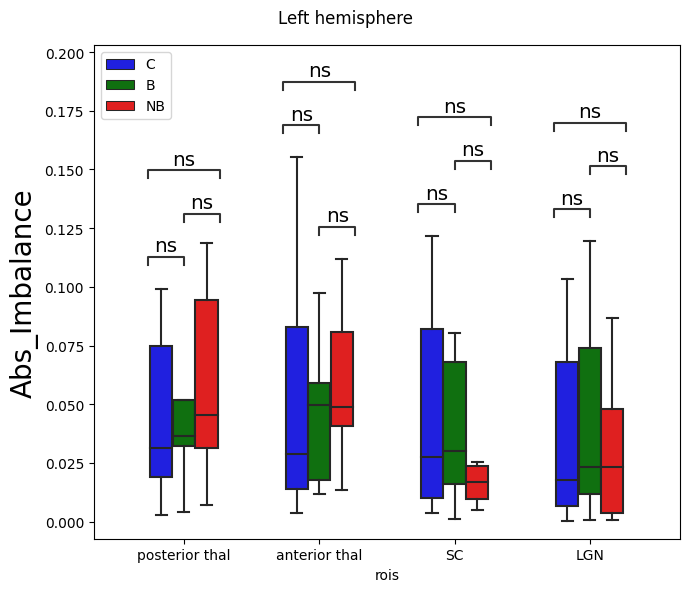

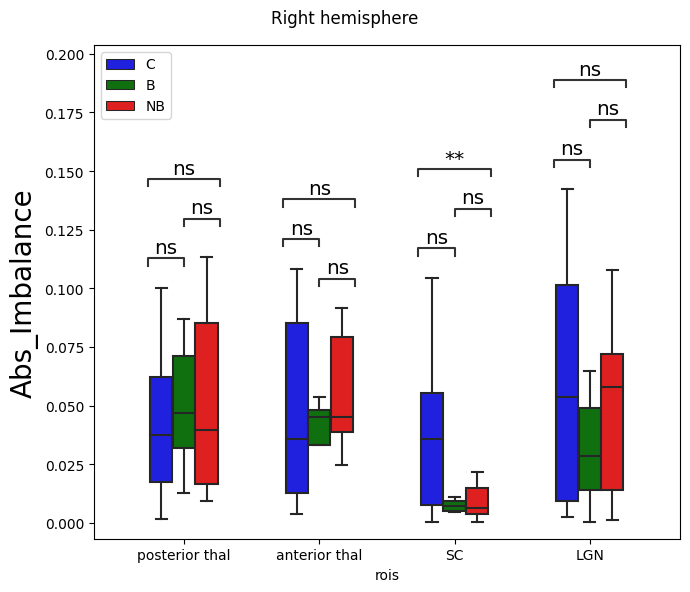

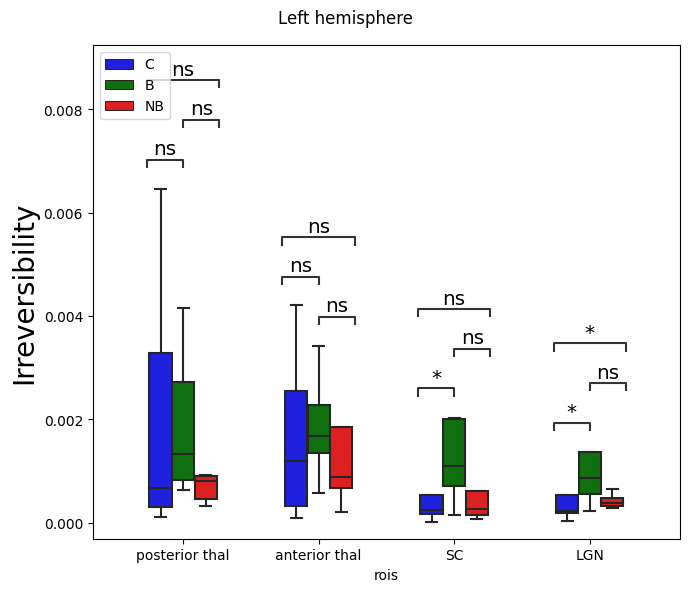

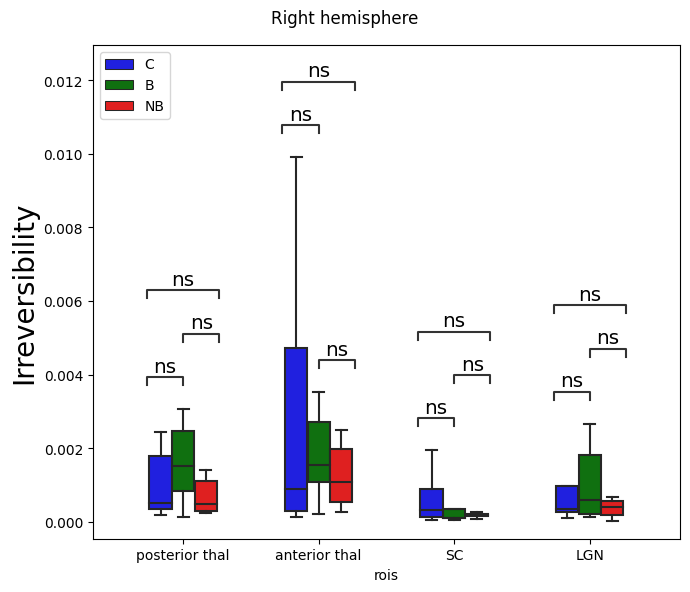

In [38]:
seeddini = [['THA_DP', 'THA_VP'],['THA_DA', 'THA_VA'], ['SC'], ['LGN']]
seeddini_labels = ['posterior thal', 'anterior thal', 'SC', 'LGN']
m_labels = ['Abs_Imbalance', 'Irreversibility']
hemis = ['Left hemisphere', 'Right hemisphere']
abs_imb = np.copy(imbalance)
abs_imb = np.abs(abs_imb)
for m_i,m in enumerate([abs_imb, I_per_area]):
    for h_i,h in enumerate(['LH_','RH_']):
        vals = []
        groups = []
        roi = []
        for i,seed_list in enumerate(seeddini):
            seeds = []
            for s in seed_list:
                seeds.append(atlas_labels[atlas_labels['ROI_name']==h+s].index.values[0])
            vals += m[:,seeds].mean(axis=1).tolist()
            groups += subjects_group.tolist()
            roi += [seeddini_labels[i]]*33
        
        #Plot
        # PLOT WITH STATISTICS
        df_metrics = pd.DataFrame(data = {'vals': vals, 'rois': roi, 'groups':groups})

        pairs = [[(s,'C'),(s,'B+')] for s in seeddini_labels] + \
                 [[(s,'C'),(s,'B-')] for s in seeddini_labels] + \
                 [[(s,'B+'),(s,'B-')] for s in seeddini_labels]
        my_pal = {'C':'blue', 'B+':'g', 'B-':'r'}
        annot_test =  'Brunner-Munzel'

        hue_plot_params = {
            'data': df_metrics,
            'x': 'rois',
            'y': 'vals',
            "order": seeddini_labels,
            "hue": 'groups',
            "hue_order": groups_order,
            "palette": my_pal
        }

        fig,ax = plt.subplots(1,1, figsize=(7,6))
        plt.suptitle(hemis[h_i])
        with sns.plotting_context("notebook", font_scale = 1.2):
            # Create new plot
        #     ax = get_log_ax()

            # Plot with seaborn
            sns.boxplot(ax=ax, **hue_plot_params,
                             showfliers=False,
                             width=0.5)

            # Add annotations
            annotator = Annotator(ax, pairs, **hue_plot_params)
            annotator.configure(test=annot_test, text_format='star', loc='inside')
                                # ,comparisons_correction='Benjamini-Hochberg')
            annotator._pvalue_format.pvalue_thresholds =  [[0.0001, '****'], [0.001, '***'], [0.01, '**'], [0.05, '*'], [1, 'ns']]
            _, stat = annotator.apply_and_annotate()
            ax.set_ylabel(m_labels[m_i], fontsize=20)

            # Label and show
            plt.legend(loc='upper left', fontsize=10)
        plt.tight_layout()
        plt.savefig(output_folder+'output_global/'+m_labels[m_i]+'_'+h+'subcort_boxplots.png', dpi=300)

## Global-level

In [28]:
# count how many node for each network

def count_node_per_net(node_list, network_list, atlas_lab, net_or_state='ROI_network'):
    net_dic = {}
    # Initialize the dicionary with the count of the node for each network
    for net in network_list:
        net_dic[net] = 0
    for node in node_list: # Loop over nodes
        curr_net = atlas_lab.iloc[node][net_or_state]
        net_dic[curr_net] +=1
    return net_dic

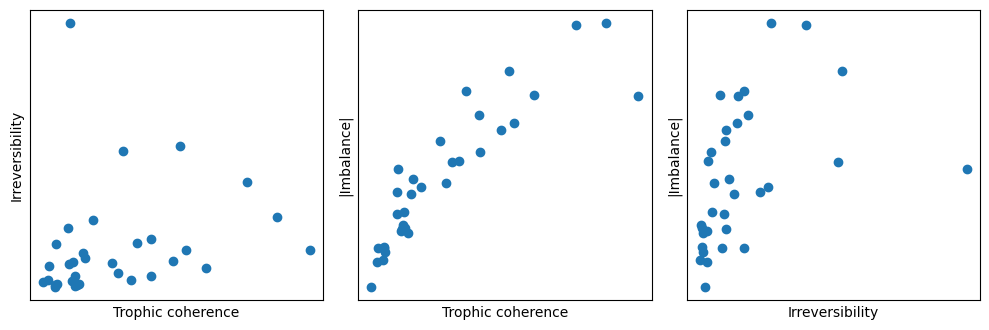

In [29]:
# Correlations between measures among subjects

fig, axs = plt.subplots(1,3, figsize=(10,3.4),)
axs[0].scatter(trophiccoherence, I_global[:,0])
axs[0].set_xlabel('Trophic coherence')
axs[0].set_ylabel('Irreversibility')
axs[0].set_xticks([])
axs[0].set_yticks([])
axs[1].scatter(trophiccoherence, np.abs(imbalance).mean(axis=1))
axs[2].scatter(I_global[:,0], np.abs(imbalance).mean(axis=1))
# axs[1].scatter(trophiccoherence, imbalance.mean(axis=1))
axs[1].set_xlabel('Trophic coherence')
axs[1].set_ylabel('|Imbalance|')
axs[1].set_xticks([])
axs[1].set_yticks([])
# axs[2].scatter(I_global[:,0], imbalance.mean(axis=1))
axs[2].set_xlabel('Irreversibility')
axs[2].set_ylabel('|Imbalance|')
axs[2].set_xticks([])
axs[2].set_yticks([])
plt.tight_layout()
plt.savefig(output_folder+'output_global/GEC_measure_correlations_imb_abs.png', dpi=300)

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: Brunner-Munzel test, P_val:9.176e-01 W=-1.059e-01
B vs. NB: Brunner-Munzel test, P_val:6.330e-01 W=4.883e-01
C vs. NB: Brunner-Munzel test, P_val:5.806e-01 W=5.689e-01


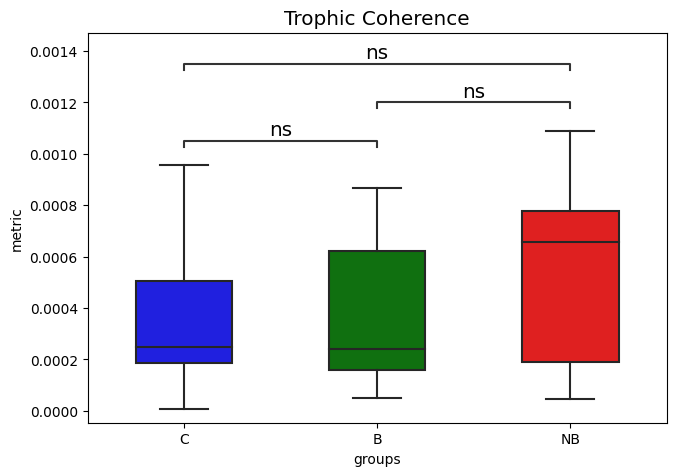

In [48]:
# Trophic Choerence
annot_test =  'Brunner-Munzel'
pairs = [('C','B'),('C','NB'),('B','NB')]


mmm = []
groupz = []
for i,group in enumerate(subjects_group):
    mmm.append(trophiccoherence[i])
    groupz.append(group)

df = pd.DataFrame({'metric':mmm, 'groups':groupz})
hue_plot_params = {
    'data': df,
    'x': 'groups',
    'y': 'metric',
    "order": ['C','B','NB'],
    "palette": my_pal
}
fig,ax = plt.subplots(1,1, figsize=(7,5))
with sns.plotting_context("notebook", font_scale = 1.2):
    sns.boxplot(**hue_plot_params, showfliers=False, width=0.5, ax=ax)
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test=annot_test, text_format='star', loc='inside')
                        # ,comparisons_correction='Benjamini-Hochberg')
    _, stat = annotator.apply_and_annotate()
    plt.title('Trophic Coherence')
    plt.tight_layout()

# plt.savefig('output_global_Malta//TrophicCoherence.png', dpi=200)

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: Brunner-Munzel test, P_val:3.837e-01 W=8.887e-01
B vs. NB: Brunner-Munzel test, P_val:1.288e-01 W=-1.717e+00
C vs. NB: Brunner-Munzel test, P_val:8.224e-01 W=-2.278e-01


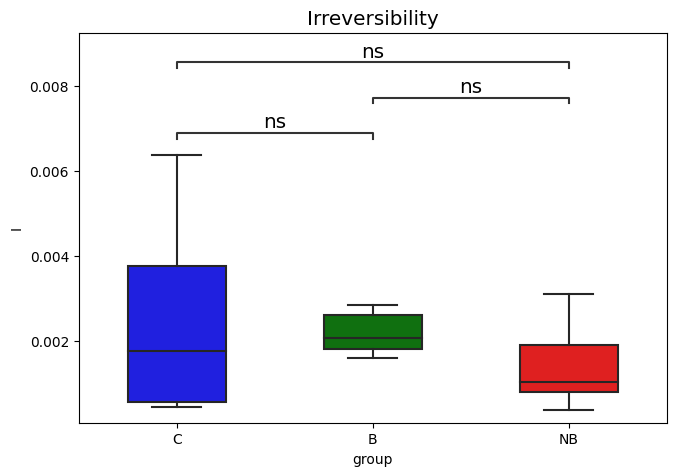

In [49]:
df = pd.DataFrame({'I':I_global[:,0], 'group':subjects_group})
my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
annot_test =  'Brunner-Munzel'
# annot_test = 't-test_ind'
pairs = [('C','B'),('C','NB'),('B','NB')]

hue_plot_params = {
    'data': df,
    'x': 'group',
    'y': 'I',
    "order": ['C','B','NB'],
    "palette": my_pal
}
fig,ax = plt.subplots(1,1, figsize=(7,5))
with sns.plotting_context("notebook", font_scale = 1.2):
    sns.boxplot(**hue_plot_params, showfliers=False, width=0.5, ax=ax)
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test=annot_test, text_format='star', loc='inside')
                        # ,comparisons_correction='Benjamini-Hochberg')
    _, stat = annotator.apply_and_annotate()
    plt.title('Irreversibility')
    plt.tight_layout()

# plt.savefig('output_global_Malta/Global_Irreversibility.png', dpi=200)

Imbalance
('C', 'B+')   1.0
[inf, inf, inf, inf, inf, inf, inf, inf, inf, inf] inf
('C', 'B-')   1.0
[inf, inf, inf, inf, inf, inf, inf, inf, inf, inf] inf
('B+', 'B-')   1.0
[inf, inf, inf, inf, inf, inf, inf, inf, inf, inf] inf
Hierarchical levels
('C', 'B+')   1.0
[0.04062412755120863, 0.04347564241053825, 0.0356072941499923, 0.04311049402144231, 0.03677948289666658, 0.038021144409731304, 0.03765821420311698, 0.04192329483452578, 0.03941180292952837, 0.03465399864433778] 0.013086346177644221
('C', 'B-')   1.0
[0.02995773371064099, 0.030878955489081643, 0.03213675849581099, 0.03322471153802448, 0.031780133494310844, 0.030828133270370733, 0.032948563371576325, 0.03574968958911402, 0.02967349650406411, 0.03219941582393925] 0.01596309524550001
('B+', 'B-')   1.0
[0.04054255541594878, 0.042354795438879815, 0.04093271996355173, 0.04177710826949169, 0.04436863339714499, 0.037626027338551866, 0.04214238174040384, 0.04144554362084793, 0.045855114699028886, 0.03807205029005111] 0.018749314373

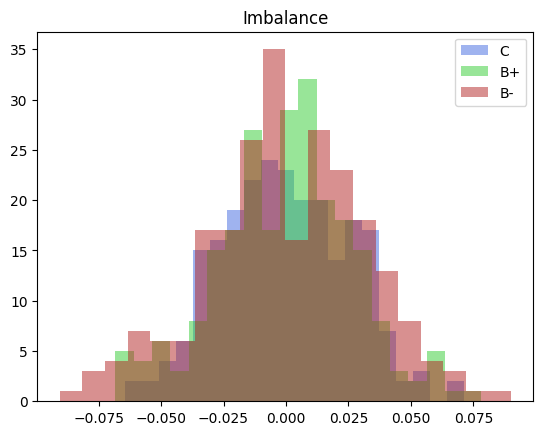

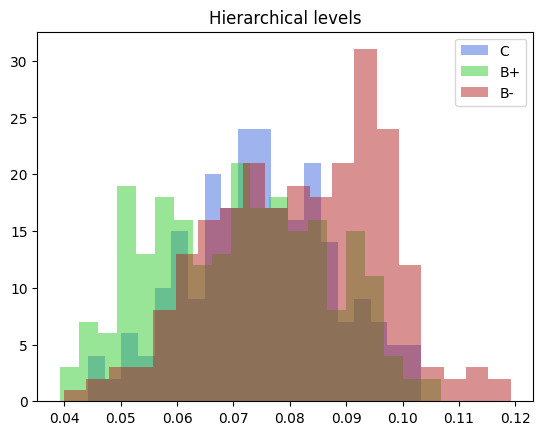

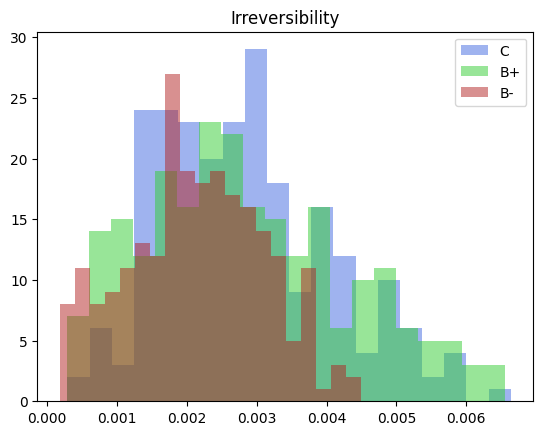

In [157]:
# Kullback-Leibler divergence betwwen distiribution per gruop of average values per nodes

measure_name = ['Imbalance','Hierarchical levels', 'Irreversibility']
measures = [imbalance, hierarchicallevels, I_per_area]
my_pal = {'C':'royalblue', 'B+':'limegreen', 'B-':'firebrick'}

for m_i, measure_n in enumerate(measure_name):
    print(measure_n)
    measure = measures[m_i]
    mes_dic = {'C': np.empty((0,236)),
               'B+': np.empty((0,236)),
               'B-': np.empty((0,236))}
    for i,group in enumerate(subjects_group):
        mes = measure[i]
        group_label = groups_order_labels[group_dic[group]]
        mes_dic[group_label] = np.concatenate((mes_dic[group_label], mes[np.newaxis,:]), axis=0)
            
    fig = plt.figure()
    plt.title(measure_name[m_i])
    plt.hist(mes_dic['C'].mean(axis=0), alpha=0.5, color=my_pal['C'], bins=20, label='C')
    plt.hist(mes_dic['B+'].mean(axis=0), alpha=0.5, color=my_pal['B+'], bins=20, label='B+')
    plt.hist(mes_dic['B-'].mean(axis=0), alpha=0.5, color=my_pal['B-'], bins=20, label='B-')
    plt.legend()
    
    pairs = [('C','B+'),('C','B-'),('B+','B-')]
    for pair in pairs:
        
        p=mes_dic[pair[0]].mean(axis=0)
        q=mes_dic[pair[1]].mean(axis=0)
        p = p / np.sum(p)
        q = q / np.sum(q)
        # Compute the observed KL divergence
        observed_kl = entropy(p, q)

        # Permutation testing
        n_permutations = 10  # Number of permutations
        combined = np.concatenate([p, q])  # Combine the two distributions
        permuted_kl = []

        for _ in range(n_permutations):
            # Shuffle combined data and split into two groups of same size as P and Q
            np.random.shuffle(combined)
            permuted_p = combined[:len(p)]
            permuted_q = combined[len(p):]

            # Normalize the permuted distributions
            permuted_p /= np.sum(permuted_p)
            permuted_q /= np.sum(permuted_q)

            # Compute KL divergence for permuted groups
            permuted_kl.append(entropy(permuted_p, permuted_q))

        # Compute the p-value (proportion of permuted KLs >= observed KL)
        p_value = np.sum(np.array(permuted_kl) >= observed_kl) / n_permutations
        print(pair, ' ',p_value)
        print(permuted_kl, observed_kl)

(17, 236) (8, 236) (8, 236)
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B+: t-test independent samples, P_val:2.139e-03 t=-3.254e+00
B+ vs. B-: t-test independent samples, P_val:8.717e-01 t=-1.623e-01
C vs. B-: t-test independent samples, P_val:4.253e-03 t=-3.008e+00
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B+: t-test independent samples, P_val:1.737e-02 t=2.468e+00
B+ vs. B-: t-test independent samples, P_val:1.773e-02 t=2.460e+00
C vs. B-: t-test independent samples, P_val:3.305e-04 t=3.880e+00


/tmp/ipykernel_52415/961974279.py:231: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DMN vs. Somatosensory: t-test independent samples with Benjamini-Hochberg correction, P_val:9.286e-01 t=-9.026e-02
Somatosensory vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:7.510e-01 t=-3.200e-01
Visual vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:9.697e-01 t=-3.833e-02
DMN vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:6.670e-01 t=-4.342e-01
Somatosensory vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:7.379e-01 t=-3.376e-01
DMN vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:6.609e-01 t=-4.428e-01


/tmp/ipykernel_52415/961974279.py:231: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DMN vs. Somatosensory: t-test independent samples with Benjamini-Hochberg correction, P_val:7.939e-01 t=-2.663e-01
Somatosensory vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:6.636e-01 t=-4.443e-01
Visual vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:5.174e-01 t=6.642e-01
DMN vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:4.507e-01 t=-7.760e-01
Somatosensory vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:8.942e-01 t=1.355e-01
DMN vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:8.645e-01 t=-1.738e-01


/tmp/ipykernel_52415/961974279.py:231: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DMN vs. Somatosensory: t-test independent samples with Benjamini-Hochberg correction, P_val:6.950e-01 t=-4.002e-01
Somatosensory vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:9.809e-01 t=-2.437e-02
Visual vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:4.352e-01 t=8.033e-01
DMN vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:6.548e-01 t=-4.568e-01
Somatosensory vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:4.913e-01 t=7.068e-01
DMN vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:7.628e-01 t=3.078e-01


/tmp/ipykernel_52415/961974279.py:231: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DMN vs. Somatosensory: t-test independent samples with Benjamini-Hochberg correction, P_val:2.466e-01 t=1.180e+00
Somatosensory vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:1.549e-01 t=-1.457e+00
Visual vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:8.821e-01 t=1.495e-01
DMN vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:8.194e-01 t=-2.302e-01
Somatosensory vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:1.601e-01 t=-1.438e+00
DMN vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:9.072e-01 t=-1.175e-01


/tmp/ipykernel_52415/961974279.py:231: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DMN vs. Somatosensory: t-test independent samples with Benjamini-Hochberg correction, P_val:2.098e-01 t=1.314e+00
Somatosensory vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:1.665e-01 t=-1.459e+00
Visual vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:6.305e-01 t=-4.918e-01
DMN vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:8.889e-01 t=-1.423e-01
Somatosensory vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:1.112e-01 t=-1.700e+00
DMN vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:5.825e-01 t=-5.628e-01


/tmp/ipykernel_52415/961974279.py:231: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DMN vs. Somatosensory: t-test independent samples with Benjamini-Hochberg correction, P_val:2.062e-01 t=1.325e+00
Somatosensory vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:7.433e-02 t=-1.928e+00
Visual vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:4.050e-01 t=8.587e-01
DMN vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:4.420e-01 t=-7.912e-01
Somatosensory vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:3.291e-01 t=-1.011e+00
DMN vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:8.309e-01 t=2.176e-01
(17, 236) (8, 236) (8, 236)
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.

/tmp/ipykernel_52415/961974279.py:231: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DMN vs. Somatosensory: t-test independent samples with Benjamini-Hochberg correction, P_val:4.664e-01 t=7.371e-01
Somatosensory vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:6.143e-01 t=-5.089e-01
Visual vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:4.306e-01 t=-7.983e-01
DMN vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:7.873e-01 t=2.720e-01
Somatosensory vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:2.252e-01 t=-1.237e+00
DMN vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:6.164e-01 t=-5.059e-01


/tmp/ipykernel_52415/961974279.py:231: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DMN vs. Somatosensory: t-test independent samples with Benjamini-Hochberg correction, P_val:6.894e-01 t=4.081e-01
Somatosensory vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:7.071e-01 t=-3.836e-01
Visual vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:8.388e-01 t=-2.073e-01
DMN vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:9.818e-01 t=2.318e-02
Somatosensory vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:5.697e-01 t=-5.822e-01
DMN vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:8.559e-01 t=-1.850e-01


/tmp/ipykernel_52415/961974279.py:231: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DMN vs. Somatosensory: t-test independent samples with Benjamini-Hochberg correction, P_val:7.230e-01 t=3.617e-01
Somatosensory vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:5.989e-01 t=-5.382e-01
Visual vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:8.734e-01 t=-1.623e-01
DMN vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:8.454e-01 t=-1.986e-01
Somatosensory vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:4.655e-01 t=-7.503e-01
DMN vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:7.066e-01 t=-3.843e-01


/tmp/ipykernel_52415/961974279.py:231: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DMN vs. Somatosensory: t-test independent samples with Benjamini-Hochberg correction, P_val:4.177e-01 t=8.210e-01
Somatosensory vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:1.990e-01 t=-1.312e+00
Visual vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:4.165e-03 t=3.086e+00
DMN vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:6.484e-01 t=-4.603e-01
Somatosensory vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:1.408e-01 t=1.510e+00
DMN vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:2.062e-02 (ns) t=2.435e+00


/tmp/ipykernel_52415/961974279.py:231: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DMN vs. Somatosensory: t-test independent samples with Benjamini-Hochberg correction, P_val:4.272e-01 t=8.177e-01
Somatosensory vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:2.068e-01 t=-1.324e+00
Visual vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:4.251e-01 t=8.216e-01
DMN vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:4.299e-01 t=-8.129e-01
Somatosensory vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:5.998e-01 t=-5.369e-01
DMN vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:8.974e-01 t=1.313e-01


/tmp/ipykernel_52415/961974279.py:231: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DMN vs. Somatosensory: t-test independent samples with Benjamini-Hochberg correction, P_val:4.736e-01 t=7.365e-01
Somatosensory vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:2.647e-01 t=-1.162e+00
Visual vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:1.268e-01 t=1.624e+00
DMN vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:5.669e-01 t=-5.865e-01
Somatosensory vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:5.131e-01 t=6.711e-01
DMN vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:1.954e-01 t=1.360e+00
(17, 236) (8, 236) (8, 236)
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.0

/tmp/ipykernel_52415/961974279.py:231: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DMN vs. Somatosensory: t-test independent samples with Benjamini-Hochberg correction, P_val:4.138e-01 t=-8.280e-01
Somatosensory vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:4.103e-01 t=8.343e-01
Visual vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:8.095e-01 t=2.431e-01
DMN vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:9.446e-01 t=-6.998e-02
Somatosensory vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:3.367e-01 t=9.754e-01
DMN vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:8.787e-01 t=1.539e-01


/tmp/ipykernel_52415/961974279.py:231: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DMN vs. Somatosensory: t-test independent samples with Benjamini-Hochberg correction, P_val:4.427e-01 t=-7.901e-01
Somatosensory vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:6.237e-01 t=5.016e-01
Visual vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:3.463e-01 t=9.746e-01
DMN vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:6.684e-01 t=-4.375e-01
Somatosensory vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:2.527e-01 t=1.193e+00
DMN vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:6.304e-01 t=4.919e-01


/tmp/ipykernel_52415/961974279.py:231: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DMN vs. Somatosensory: t-test independent samples with Benjamini-Hochberg correction, P_val:6.093e-01 t=-5.228e-01
Somatosensory vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:8.682e-01 t=1.690e-01
Visual vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:4.352e-01 t=8.033e-01
DMN vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:7.474e-01 t=-3.285e-01
Somatosensory vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:3.097e-01 t=1.054e+00
DMN vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:6.437e-01 t=4.727e-01


/tmp/ipykernel_52415/961974279.py:228: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,axs = plt.subplots(1,3, figsize=(14,4))
/tmp/ipykernel_52415/961974279.py:231: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DMN vs. Somatosensory: t-test independent samples with Benjamini-Hochberg correction, P_val:6.076e-02 t=-1.944e+00
Somatosensory vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:3.534e-01 t=9.416e-01
Visual vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:3.898e-03 t=3.112e+00
DMN vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:1.946e-01 t=-1.325e+00
Somatosensory vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:4.471e-03 t=3.059e+00
DMN vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:3.208e-02 (ns) t=2.241e+00


/tmp/ipykernel_52415/961974279.py:231: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DMN vs. Somatosensory: t-test independent samples with Benjamini-Hochberg correction, P_val:5.051e-03 t=-3.321e+00
Somatosensory vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:2.226e-02 t=2.569e+00
Visual vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:1.175e-03 t=4.058e+00
DMN vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:9.953e-02 t=-1.764e+00
Somatosensory vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:1.168e-03 t=4.061e+00
DMN vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:2.479e-03 t=3.679e+00


/tmp/ipykernel_52415/961974279.py:231: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DMN vs. Somatosensory: t-test independent samples with Benjamini-Hochberg correction, P_val:3.060e-01 t=-1.063e+00
Somatosensory vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:4.689e-01 t=7.445e-01
Visual vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:1.711e-02 (ns) t=2.704e+00
DMN vs. Visual: t-test independent samples with Benjamini-Hochberg correction, P_val:5.014e-01 t=-6.902e-01
Somatosensory vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:1.088e-01 t=1.713e+00
DMN vs. Subcortical: t-test independent samples with Benjamini-Hochberg correction, P_val:1.232e-01 t=1.640e+00


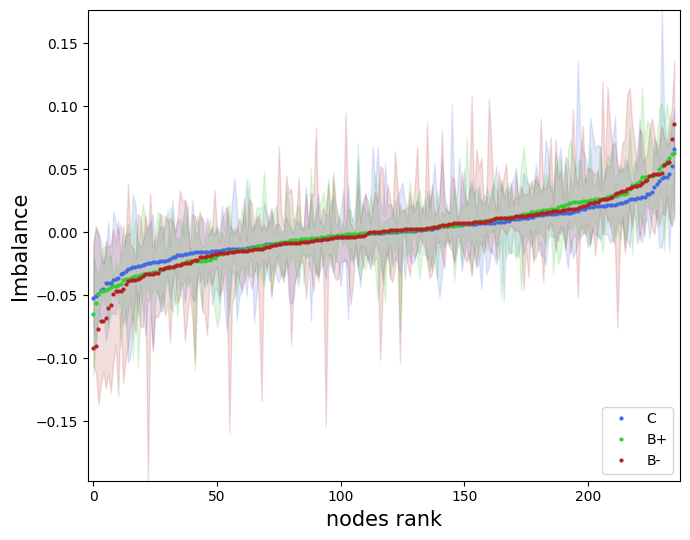

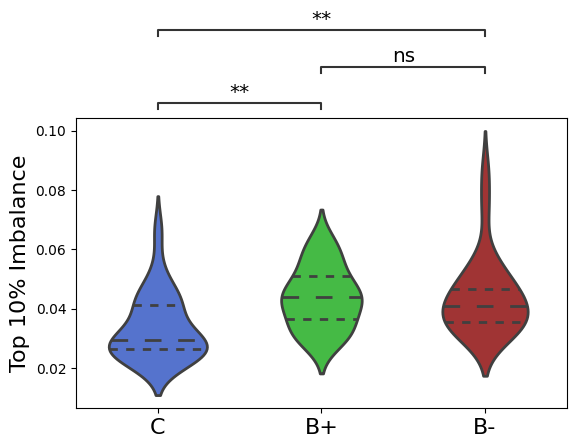

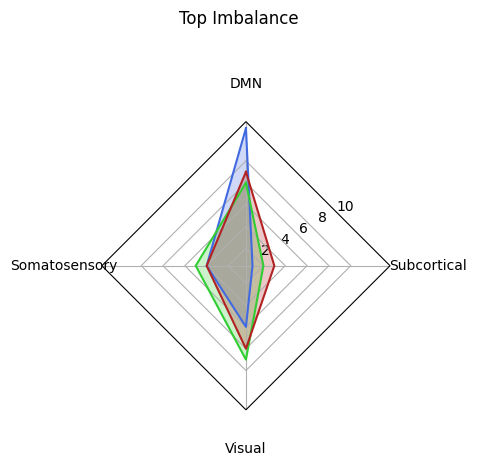

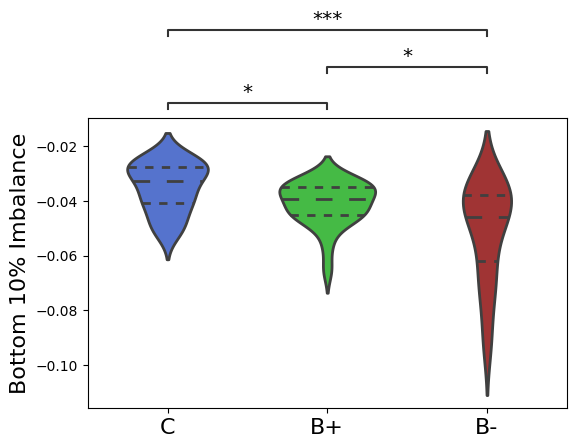

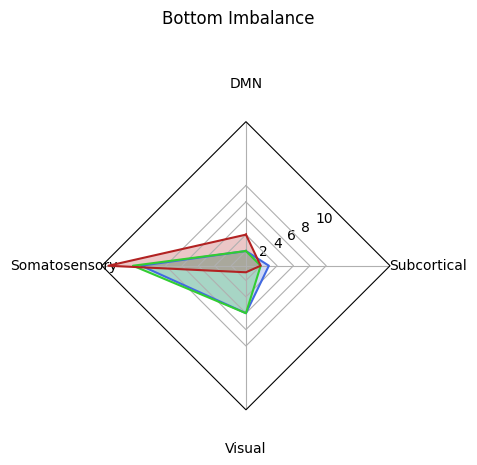

...

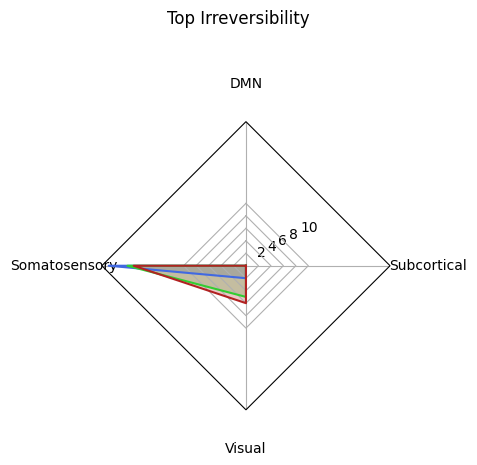

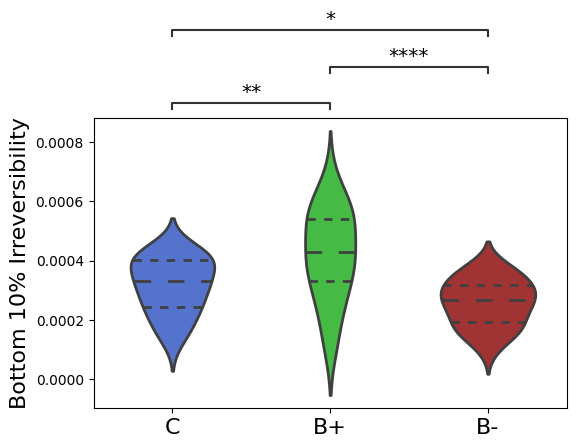

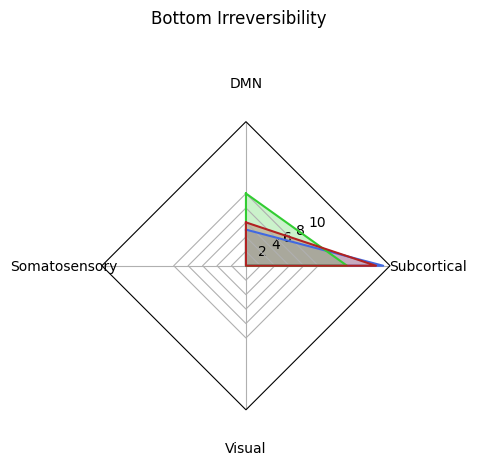

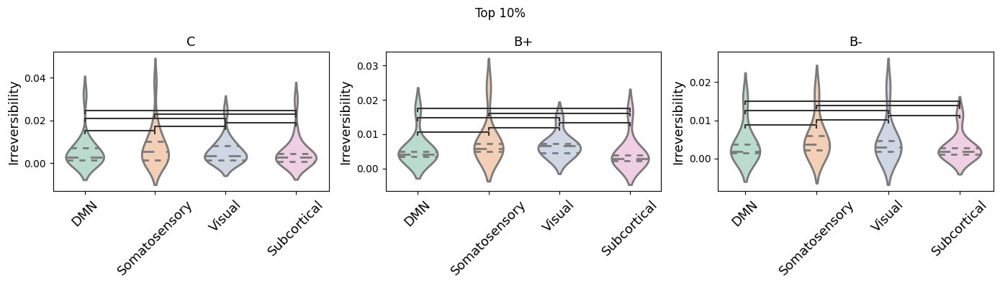

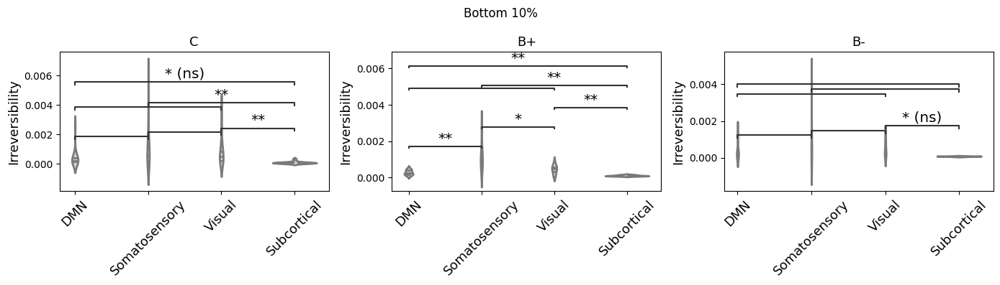

In [39]:
net_or_state = 'ROI_state'
if net_or_state=='ROI_network':
    network_per_area = atlas_labels['ROI_network'].values
    nets=networks
else:
    network_per_area = atlas_labels['ROI_state'].values
    nets = ['DMN', 'Somatosensory','Visual','Subcortical']
    
groups_order_labels = ['C', 'B+', 'B-']

abs_imb = False # Consider the absolute value of the imbalance or not
save = True # Save the plots
    

measure_name = ['Imbalance','Hierarchical levels', 'Irreversibility']
network_per_area = atlas_labels['ROI_network'].values
measures = [imbalance, hierarchicallevels, I_per_area]

plot_1 = False
plot_2 = True
plot_3 = False

top_tail = int(236/100*n)
my_pal = {'C':'blue', 'B+':'g', 'B-':'r'}
my_pal = {'C':'royalblue', 'B+':'limegreen', 'B-':'firebrick'}
groups_order = ['C','B','NB']
annot_test =  'Brunner-Munzel'
annot_test =  't-test_ind'
# annot__test = 'Wilcoxon'
n_perc = 10


for m_i, measure_n in enumerate(measure_name):
    measure = measures[m_i]
    
    ##########################################################
    ## Averaging the values among subjects and then sorting ##
    ##########################################################
    
    if plot_2:
        mes_C = np.empty((0,236))
        mes_B = np.empty((0,236))
        mes_NB = np.empty((0,236))
        for i,group in enumerate(subjects_group):
            mes = np.copy(measure[i])
            if m_i==0 and abs_imb:
                mes = np.abs(mes)
#             mes = np.abs(mes)

            if group=='C':
                mes_C = np.concatenate((mes_C, mes[np.newaxis,:]), axis=0)
            elif group=='B':
                mes_B = np.concatenate((mes_B, mes[np.newaxis,:]), axis=0)
            elif group=='NB':
                mes_NB = np.concatenate((mes_NB, mes[np.newaxis,:]), axis=0)
        print(mes_C.shape, mes_B.shape, mes_NB.shape)    
        mean_mes_C = np.median(mes_C, axis=0)
        perc_mes_C = [np.percentile(mes_C, 25, axis=0), np.percentile(mes_C, 75, axis=0)]
        mean_mes_B = np.median(mes_B, axis=0)
        perc_mes_B = [np.percentile(mes_B, 25, axis=0), np.percentile(mes_B, 75, axis=0)]
        mean_mes_NB = np.median(mes_NB, axis=0)
        perc_mes_NB = [np.percentile(mes_NB, 25, axis=0), np.percentile(mes_NB, 75, axis=0)]
    
        mes_per_group = [mes_C, mes_B, mes_NB]
        measure_per_group = [mean_mes_C, mean_mes_B, mean_mes_NB]
        perc_per_group = [perc_mes_C, perc_mes_B, perc_mes_NB]
        
        fig,ax = plt.subplots(1,1, figsize=(7, 5.5))
        labels = ['C','B+','B-']
        colors = list(my_pal.values())
        cmaps = ['RdBu','PiYG','bwr']
        lens_m_top = []
        lens_m_bottom = []
        m_top = [] # Top 10% of areas for each group
        m_top_arg = []
        m_bottom = [] # Bottom 10% of areas for each group
        m_bottom_arg = []
        for g in range(3):
            mes = measure_per_group[g]
            perc = perc_per_group[g]
            rank = np.argsort(mes)
            # Save the healthy rank
            if g==0:
                h_rank=rank
            m = mes[rank]
            ax.plot(range(m.shape[0]), m, 'o', label=labels[g], color=colors[g], markersize=2)
        
            plt.fill_between(range(m.shape[0]), perc[0][rank], perc[1][rank], color=colors[g], alpha=0.15)
            ax.set_ylabel(measure_n, fontsize=15)
            ax.set_xlabel('nodes rank', fontsize=15)
            ax.margins(0.01, 0)
    
            # TOP 10%
            perc_95 = np.percentile(m, int(100-n_perc))
            lens_m_top.append(len(m[np.where(m>=perc_95)].tolist()))
            m_top += m[np.where(m>=perc_95)].tolist()
            m_top_arg.append(rank[np.where(m>=perc_95)])
            # BOTTOM 10%
            perc_5 = np.percentile(m, n_perc)
            lens_m_bottom.append(len(m[np.where(m<=perc_5)].tolist()))
            m_bottom += m[np.where(m<=perc_5)].tolist()
            m_bottom_arg.append(rank[np.where(m<=perc_5)])
            
        ax.legend(loc='lower right')
        fig.tight_layout()
        if save:
            plt.savefig(output_folder+'output_global/'+measure_n+'.png', dpi=200)
    
        # Plot top 10%
        pairs = [('C','B+'),('C','B-'),('B+','B-')]
        df = pd.DataFrame({'Top '+str(n_perc)+'% '+measure_n :m_top, 'groups':['C']*lens_m_top[0]+['B+']*lens_m_top[1]+['B-']*lens_m_top[2]})
        hue_plot_params = {
            'data': df,
            'x': 'groups',
            'y': 'Top '+str(n_perc)+'% '+measure_n,
            "order": ['C','B+','B-'],
            "palette": my_pal
        }
        fig,ax = plt.subplots(1,1, figsize=(6,5))
        with sns.plotting_context("notebook", font_scale = 1.2):
            sns.violinplot(**hue_plot_params, showfliers=False, width=0.6, ax=ax, inner="quart", linewidth=2)
            annotator = Annotator(ax, pairs, **hue_plot_params)
            annotator.configure(test=annot_test, text_format='star', loc='outside')
                                # ,comparisons_correction='Benjamini-Hochberg')
            _, stat = annotator.apply_and_annotate()
#             plt.title('Top 10% '+measure_n)
            ax.set_ylabel('Top '+str(n_perc)+'% '+measure_n, fontsize=16)
            ax.set_xlabel('', fontsize=16)
            ax.set_xticklabels(groups_order_labels, fontsize=16)
            plt.tight_layout()
        if save:
            plt.savefig(output_folder+'output_global/'+measure_n+'_top'+str(n_perc)+'_distr.png', dpi=200)
    
        ## Who is the top 10%
        ### RADAR ###
        count_for_radar = []
        for g in range(3): 
            countz = count_node_per_net(m_top_arg[g], nets, atlas_labels, net_or_state=net_or_state)
            coun = [v for v in countz.values()]
            count_for_radar.append(coun)
            
        fig = make_radar(nets, count_for_radar, groups_order_labels, 'Top '+measure_n)
        if save:
            if net_or_state=='net':
                plt.savefig(output_folder+'output_global/'+measure_name[m_i]+'_top'+str(n_perc)+'_radar.png', dpi=200)
            else:
                plt.savefig(output_folder+'output_global/'+measure_name[m_i]+'_top'+str(n_perc)+'_radar.png', dpi=200)


        # Plot bottom 10%
        pairs = [('C','B+'),('C','B-'),('B+','B-')]
        df = pd.DataFrame({'Bottom '+str(n_perc)+'% '+measure_n :m_bottom, 'groups':['C']*lens_m_bottom[0]+['B+']*lens_m_bottom[1]+['B-']*lens_m_bottom[2]})
        hue_plot_params = {
            'data': df,
            'x': 'groups',
            'y': 'Bottom '+str(n_perc)+'% '+measure_n,
            "order": ['C','B+','B-'],
            "palette": my_pal
        }
        fig,ax = plt.subplots(1,1, figsize=(6,5))
        with sns.plotting_context("notebook", font_scale = 1.2):
            sns.violinplot(**hue_plot_params, showfliers=False, width=0.6, ax=ax, inner="quart", linewidth=2)
            annotator = Annotator(ax, pairs, **hue_plot_params)
            annotator.configure(test=annot_test, text_format='star', loc='outside')
                                # ,comparisons_correction='Benjamini-Hochberg')
            _, stat = annotator.apply_and_annotate()
#             plt.title('Top 10% '+measure_n)
            ax.set_ylabel('Bottom '+str(n_perc)+'% '+measure_n, fontsize=16)
            ax.set_xlabel('', fontsize=16)
            ax.set_xticklabels(groups_order_labels, fontsize=16)
            plt.tight_layout()
        if save:
            if net_or_state=='net':
                plt.savefig(output_folder+'output_global/'+measure_n+'_bottom'+str(n_perc)+'_distr.png', dpi=200)
            else:
                plt.savefig(output_folder+'output_global/'+measure_n+'_bottom'+str(n_perc)+'_distr.png', dpi=200)

    
        ## Who is the bottom 10%
        ### RADAR ###
        count_for_radar = []
        for g in range(3): 
            countz = count_node_per_net(m_bottom_arg[g], nets, atlas_labels, net_or_state=net_or_state)
            coun = [v for v in countz.values()]
            count_for_radar.append(coun)
            
        fig = make_radar(nets, count_for_radar, groups_order, 'Bottom '+measure_n)
        if save:
            if net_or_state=='ROI_network':
                plt.savefig(output_folder+'output_global/'+measure_name[m_i]+'_bottom'+str(n_perc)+'_radar.png', dpi=200)
            else:
                plt.savefig(output_folder+'output_global/'+measure_name[m_i]+'_bottom'+str(n_perc)+'_radar.png', dpi=200)
    
    #########################################################
    # Compare values within the groups and between networks #
    #########################################################
    # I take only the top n% for each network (n=n_perc)
    
    
    top_values = []
    bottom_values = []
    groups = []
    networkz = []
    for net in nets: # Loop over networks
        for sub_i, sub in enumerate(measure): # Loop over subjects
            group = subjects_group[sub_i]
            if group=='B':
                group='B+'
            elif group=='NB':
                group='B-'
            # idxs of the current network
        
            net_idxs = atlas_labels[atlas_labels[net_or_state]==net].index.values
            net_values = sub[net_idxs]
            top_net_values = net_values[np.where(net_values>=np.percentile(net_values, 100-n_perc))]
            bottom_net_values = net_values[np.where(net_values<=np.percentile(net_values, n_perc))]
            top_values.append(top_net_values.mean())
            bottom_values.append(bottom_net_values.mean())
            groups.append(group)
            networkz.append(net)
    # Violin plots
    my_pastel = 'Pastel2'
    pairs = list(itertools.combinations(nets, 2))
    
    v_i = 0
    for values in [top_values, bottom_values]:
        df_all = pd.DataFrame({measure_n: values, 'groups': groups, 'networks':networkz})
        fig,axs = plt.subplots(1,3, figsize=(14,4))
        for g_i,g in enumerate(groups_order_labels):
            df = df_all.loc[df_all['groups']==g]
            df.drop('groups', axis='columns', inplace=True)

            hue_plot_params = {
                'data': df,
                'x': 'networks',
                'y': measure_n,
                "order": nets,
                "palette": my_pastel
            }
            with sns.plotting_context("notebook", font_scale = 1.2):
                sns.violinplot(**hue_plot_params, showfliers=False, width=0.6, ax=axs[g_i], inner="quart", linewidth=2)
                annotator = Annotator(axs[g_i], pairs, **hue_plot_params)
                annotator.configure(test=annot_test, text_format='star', loc='inside', 
                                    comparisons_correction='Benjamini-Hochberg')
                annotator._pvalue_format.pvalue_thresholds =  [[0.0001, '****'],
                                                               [0.001, '***'],
                                                               [0.01, '**'], [0.05, '*']]

                _, stat = annotator.apply_and_annotate()

                axs[g_i].set_ylabel(measure_n, fontsize=13)
                axs[g_i].set_xlabel('', fontsize=13)
                axs[g_i].set_xticklabels(nets, fontsize=13, rotation=45)
                axs[g_i].set_title(g, fontsize=13)
            if v_i==0:
                fig.suptitle('Top '+str(n_perc)+'%')
            else:
                fig.suptitle('Bottom '+str(n_perc)+'%')
            plt.tight_layout()
            if save:
                if v_i==0:
                    plt.savefig(output_folder+'output_global/'+measure_n+'_'+group+'_'+net_or_state+'_compare_top_'+str(n_perc)+'_distr.png', dpi=200)
                else:
                    plt.savefig(output_folder+'output_global/'+measure_n+'_'+group+'_'+net_or_state+'_compare_bottom_'+str(n_perc)+'_distr.png', dpi=200)
        v_i += 1
            
    ###########################################
    ## Compare standard deviation per groups ##
    ###########################################
    
    if plot_3:
        stds = [mes_per_group[i].std(axis=1) for i in range(3)]
        stds_l = []
        groupz = []
        for i,std in enumerate(stds):
            stds_l += std.tolist()
            groupz += [groups_order_labels[i]]*len(std)
            
        pairs = [('C','B+'),('C','B-'),('B+','B-')]
        
        df = pd.DataFrame({'std':stds_l, 'groups':groupz})
        hue_plot_params = {
            'data': df,
            'x': 'groups',
            'y': 'std',
            "order": ['C','B+','B-'],
            "palette": my_pal
        }
        fig,ax = plt.subplots(1,1, figsize=(7,5))
        with sns.plotting_context("notebook", font_scale = 1.2):
            sns.boxplot(**hue_plot_params, showfliers=False, width=0.5, ax=ax)
            annotator = Annotator(ax, pairs, **hue_plot_params)
            annotator.configure(test=annot_test, text_format='star', loc='inside')
                                # ,comparisons_correction='Benjamini-Hochberg')
            _, stat = annotator.apply_and_annotate()
            plt.title(measure_n+' standard deviation per subject')
            plt.tight_layout()
        if save:
            plt.savefig(output_folder+'output_global/StD_'+measure_n+'.png', dpi=200)


/tmp/ipykernel_372616/744388446.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L vs. R: Brunner-Munzel test with Benjamini-Hochberg correction, P_val:1.333e-02 W=2.620e+00


/tmp/ipykernel_372616/744388446.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L vs. R: Brunner-Munzel test with Benjamini-Hochberg correction, P_val:5.628e-02 W=2.156e+00


/tmp/ipykernel_372616/744388446.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L vs. R: Brunner-Munzel test with Benjamini-Hochberg correction, P_val:4.864e-01 W=7.155e-01


/tmp/ipykernel_372616/744388446.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L vs. R: Brunner-Munzel test with Benjamini-Hochberg correction, P_val:5.834e-01 W=5.541e-01


/tmp/ipykernel_372616/744388446.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L vs. R: Brunner-Munzel test with Benjamini-Hochberg correction, P_val:4.231e-01 W=8.264e-01


/tmp/ipykernel_372616/744388446.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L vs. R: Brunner-Munzel test with Benjamini-Hochberg correction, P_val:4.174e-01 W=8.367e-01


/tmp/ipykernel_372616/744388446.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L vs. R: Brunner-Munzel test with Benjamini-Hochberg correction, P_val:4.523e-01 W=-7.609e-01


/tmp/ipykernel_372616/744388446.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L vs. R: Brunner-Munzel test with Benjamini-Hochberg correction, P_val:4.290e-01 W=-8.165e-01


/tmp/ipykernel_372616/744388446.py:65: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('groups', axis='columns', inplace=True)


p-value annotation legend:
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

L vs. R: Brunner-Munzel test with Benjamini-Hochberg correction, P_val:5.586e-01 W=-6.017e-01


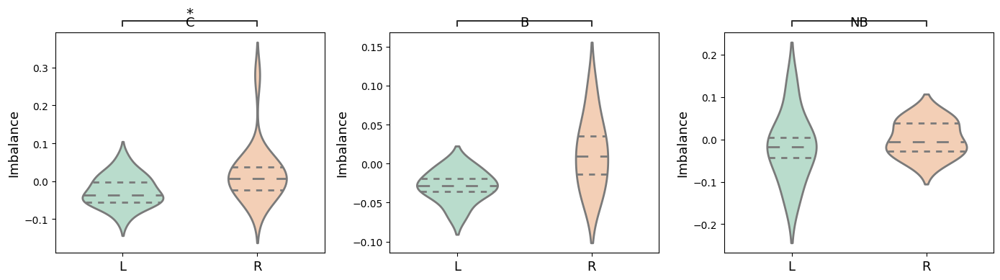

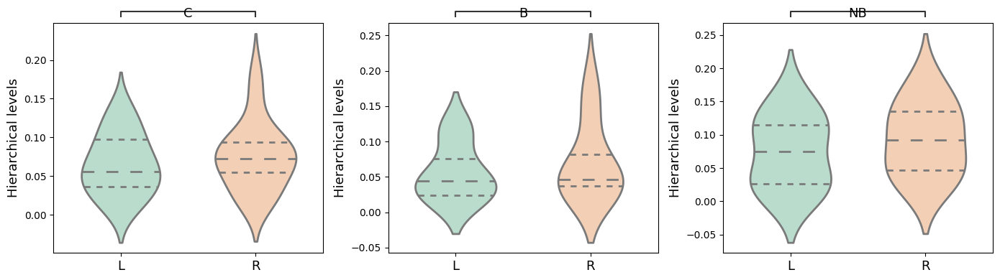

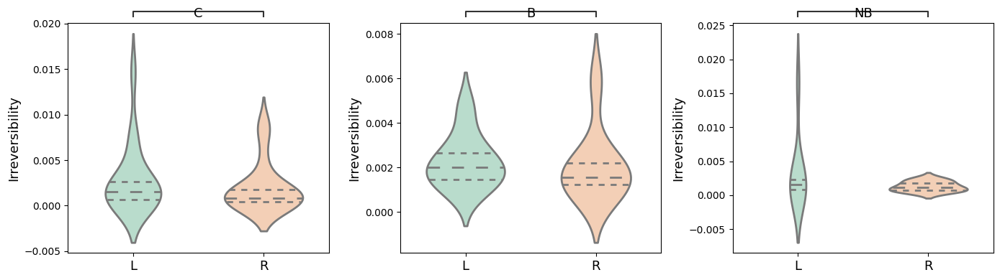

In [588]:
#########################################
## Compare visul left and visual right ##
#########################################

# Is there some lateralization effect?

net_or_state = 'ROI_network'
if net_or_state=='ROI_network':
    network_per_area = atlas_labels['ROI_network'].values
    nets=networks
else:
    network_per_area = atlas_labels['ROI_state'].values
    nets = ['DMN', 'Somatosensory','Visual','Subcortical']
    
groups_order_labels = ['C', 'B+', 'B-']

abs_imb = False # Consider the absolute value of the imbalance or not
save = False # Save the plots
    

measure_name = ['Imbalance','Hierarchical levels', 'Irreversibility']
network_per_area = atlas_labels['ROI_network'].values
measures = [imbalance, hierarchicallevels, I_per_area]

plot_1 = False
plot_2 = True
plot_3 = False

my_pal = {'C':'royalblue', 'B+':'limegreen', 'B-':'firebrick'}
groups_order = ['C','B','NB']
annot_test =  'Brunner-Munzel'
# annot_test =  't-test_ind'
# annot__test = 'Wilcoxon'
n_perc = 5


for m_i, measure_n in enumerate(measure_name):
    measure = measures[m_i]
    values = []
    sides = []
    groups = []
    for i,group in enumerate(subjects_group):
        mes = np.copy(measure[i])
#         net_df = atlas_labels.loc[atlas_labels['ROI_network']=='Vis']

        L_idxs = atlas_labels.loc[atlas_labels['ROI_name']=='LH_Vis_1'].index.values
        R_idxs = atlas_labels.loc[atlas_labels['ROI_name']=='RH_Vis_1'].index.values

#         R_idxs = net_df.loc[net_df['Hemisphere']=='RH'].index.values
#         L_idxs = net_df.loc[net_df['Hemisphere']=='LH'].index.values
        
        values.append(mes[L_idxs].mean())
        sides.append('L')
        groups.append(group)
        values.append(mes[R_idxs].mean())
        sides.append('R')
        groups.append(group)
    # Violin plots
    my_pastel = 'Pastel2'
    pairs = [('L','R')]
    df_all = pd.DataFrame({measure_n: values, 'groups': groups, 'hemisphere':sides})
    fig,axs = plt.subplots(1,3, figsize=(14,4))
    for g_i,g in enumerate(groups_order):
        df = df_all.loc[df_all['groups']==g]
        df.drop('groups', axis='columns', inplace=True)

        hue_plot_params = {
            'data': df,
            'x': 'hemisphere',
            'y': measure_n,
            "order": ['L','R'],
            "palette": my_pastel
        }
        with sns.plotting_context("notebook", font_scale = 1.2):
            sns.violinplot(**hue_plot_params, showfliers=False, width=0.6, ax=axs[g_i], inner="quart", linewidth=2)
            annotator = Annotator(axs[g_i], pairs, **hue_plot_params)
            annotator.configure(test=annot_test, text_format='star', loc='outside', 
                                comparisons_correction='Benjamini-Hochberg')
            annotator._pvalue_format.pvalue_thresholds =  [[0.0001, '****'],
                                                           [0.001, '***'],
                                                           [0.01, '**'], [0.05, '*']]
            
            _, stat = annotator.apply_and_annotate()

            axs[g_i].set_ylabel(measure_n, fontsize=13)
            axs[g_i].set_xlabel('', fontsize=13)
            axs[g_i].set_xticklabels(['L','R'], fontsize=13)
            axs[g_i].set_title(g, fontsize=13)
        plt.tight_layout()
        if save:
            plt.savefig(output_folder+'output_global/'+measure_n+'_net_compare_distr.png', dpi=200)
        
        
    
    

In [503]:
def brain_plot(brain_vol, figsize=(8,6), thresh=0, colorbar=False,cmap='cold_hot', vmin=0, vmax=1):
    brain_vol = np.zeros(atlas.shape) # init the volume
    # Loop over brain areas
    for a in range(1,200+1):
        coord = np.where(atlas==a)
        brain_vol[coord[0],coord[1],coord[2]] = brain[a-1]
        
    map_img = nib.Nifti1Image(brain_vol, atlas_affine)
    fsaverage = datasets.fetch_surf_fsaverage(mesh='fsaverage5')
    texture_left = surface.vol_to_surf(map_img, fsaverage.pial_left)
    texture_right = surface.vol_to_surf(map_img, fsaverage.pial_right)
#     texture_left[np.where(texture_left==0)] = np.nan
#     texture_right[np.where(texture_right==0)] = np.nan

    thresh=thresh
    alpha=1

    fig = plt.figure(figsize=figsize)  # Adjust overall figure size
    gs = GridSpec(2, 2, figure=fig, wspace=0.0, hspace=0.0)  # Reduce space between axes
    
    # Left hemisphere
    ax0 = fig.add_subplot(gs[0], projection='3d')
    plotting.plot_surf_stat_map(fsaverage.pial_left, texture_left, bg_map=fsaverage.sulc_left,hemi='left',
                                title='Left', view='lateral',colorbar=colorbar, threshold=thresh, axes=ax0,
                                cmap=cmap, vmax=vmax, vmin=vmin, bg_on_data=True, alpha=alpha)

    ax1 = fig.add_subplot(gs[1], projection='3d')
    plotting.plot_surf_stat_map(fsaverage.pial_right, texture_right, bg_map=fsaverage.sulc_right,hemi='right',
                                title='Right', view='lateral', colorbar=colorbar, threshold=thresh, axes=ax1,
                                cmap=cmap, vmax=vmax, vmin=vmin, bg_on_data=True, alpha=alpha)
    # Right hemisphere
    ax2 = fig.add_subplot(gs[2], projection='3d')
    plotting.plot_surf_stat_map(fsaverage.pial_left, texture_left, bg_map=fsaverage.sulc_left,hemi='left',
                                view='medial', colorbar=colorbar, threshold=thresh, axes=ax2,
                                cmap=cmap, vmax=vmax, vmin=vmin, bg_on_data=True, alpha=alpha)
    ax3 = fig.add_subplot(gs[3], projection='3d')
    plotting.plot_surf_stat_map(fsaverage.pial_right, texture_right, bg_map=fsaverage.sulc_right,hemi='right',
                                view='medial', colorbar=colorbar, threshold=thresh, axes=ax3,
                                cmap=cmap, vmax=vmax, vmin=vmin, bg_on_data=True, alpha=alpha)
    plt.tight_layout()
    return fig

In [40]:
def subcort_glass_plot(brain, colorbar=True, cmap=cmap, vmin=0, vmax=1, title=''):
    brain_vol = np.zeros(atlas.shape) # init the volume
    # Loop over brain areas
    for a in range(201, int(atlas.max()+1)):
        coord = np.where(atlas==a)
        brain_vol[coord[0],coord[1],coord[2]] = brain[a-1]

    map_img = nib.Nifti1Image(brain_vol, atlas_affine)
    fig, ax = plt.subplots(1, figsize=(11,4))
    plotting.plot_glass_brain(map_img, display_mode='lyrz', colorbar=colorbar, title=title,
                              vmax=brain_max, vmin=vmin, cmap=cmap, axes=ax)
    return fig
    
    

C
LH_Cont_OFC_1
RH_Default_PFCdPFCm_7
LH_LGN
LH_DorsAttn_Post_7
RH_Cont_PFCl_1
RH_Limbic_OFC_1
LH_Default_PFC_4
RH_Cont_PFCl_5
RH_Cont_PFCl_6
RH_Cont_PFCl_2
RH_DorsAttn_Post_1
LH_SC
LH_Cont_Par_1
RH_Vis_6
LH_THA_VA
LH_Cont_Cing_2
LH_Cont_PFCl_3
RH_Vis_8
LH_Cont_PFCl_1
LH_Cont_Temp_1
LH_SalVentAttn_PFCl_1
LH_Default_PFC_11
LH_Cont_PFCl_2


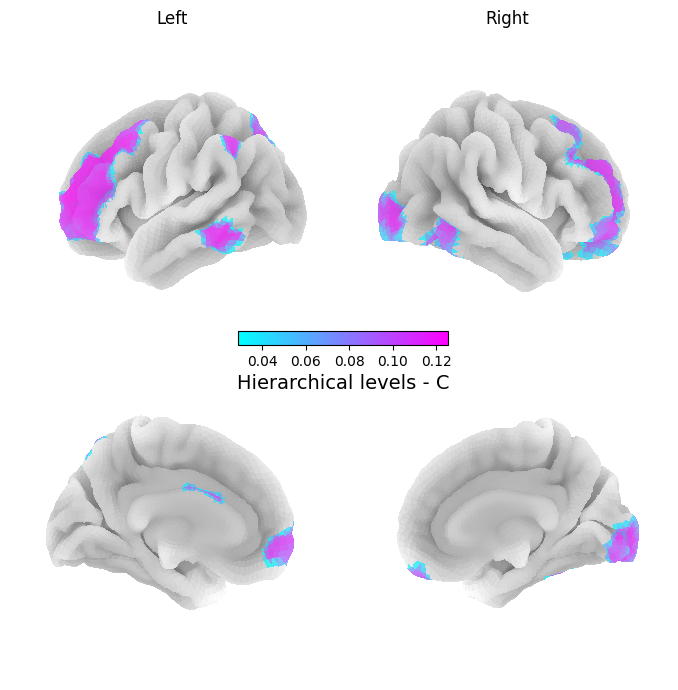

B
RH_Limbic_OFC_3
LH_Cont_PFCl_1
LH_DorsAttn_Post_7
LH_Cont_Temp_1
RH_aCAU
RH_Default_PFCdPFCm_5
LH_NAc_shell
LH_aPUT
LH_DorsAttn_Post_9
RH_pCAU
LH_Default_pCunPCC_4
LH_NAc_core
LH_aCAU
RH_Default_pCunPCC_3
LH_Cont_Cing_1
LH_THA_DA
RH_NAc_core
RH_DorsAttn_Post_6
RH_Cont_PFCl_5
RH_THA_DA
LH_Default_PFC_8
RH_THA_VA
RH_aPUT


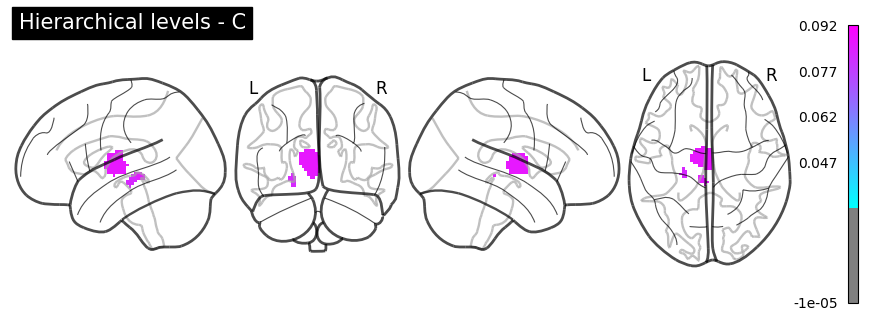

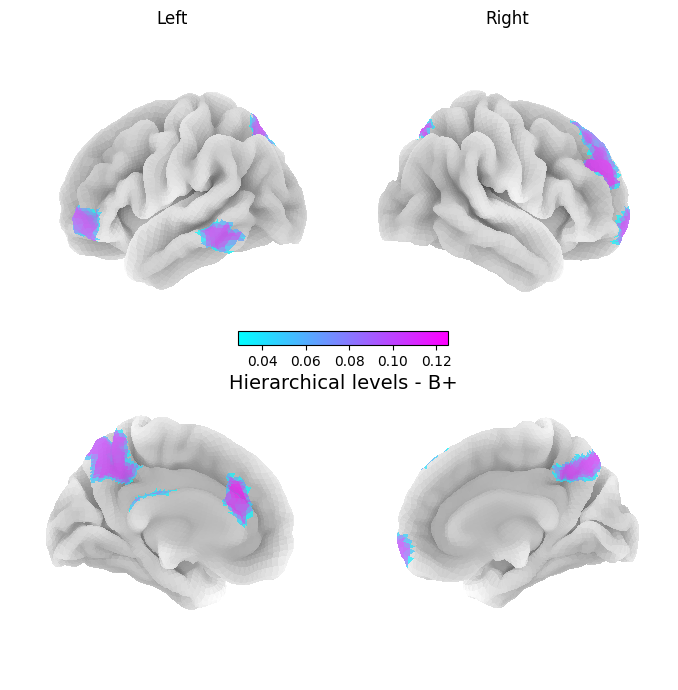

NB
LH_Default_PFC_4
LH_SC
LH_SomMot_13
RH_THA_VA
RH_Default_PFCdPFCm_1
LH_Cont_Par_2
RH_Cont_PFCl_2
LH_Default_Temp_1
RH_Cont_PFCl_7
RH_NAc_shell
RH_aCAU
RH_Cont_PFCl_6
RH_DorsAttn_Post_6
LH_Cont_Temp_1
RH_Default_PFCdPFCm_4
RH_Vis_8
RH_Limbic_OFC_3
RH_Default_PFCdPFCm_5
LH_Vis_5
LH_Vis_9
LH_Default_Temp_2
RH_Vis_6
LH_LGN


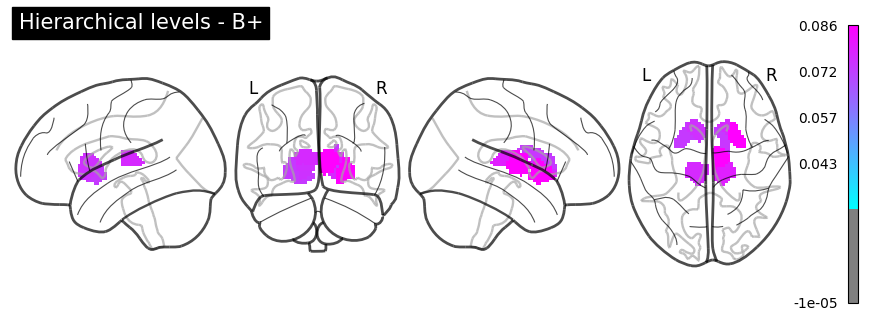

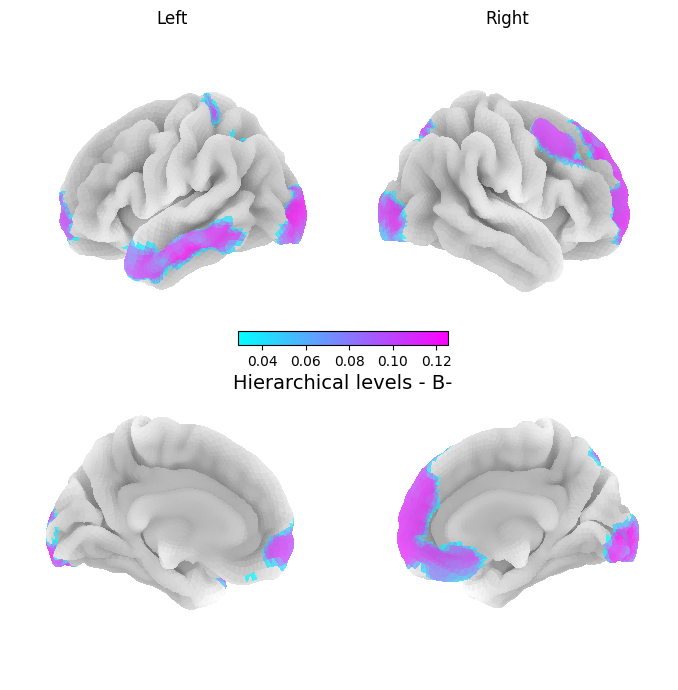

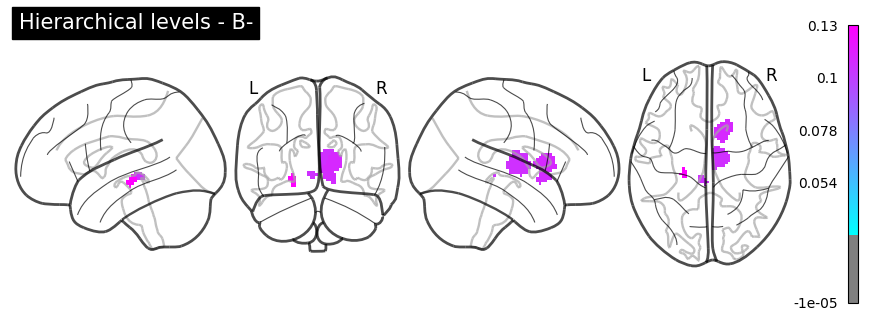

In [371]:
##################################################################################
## Brain maps (per group) of Hierarchical levels, imbalance and irreversibility ##
##################################################################################
top_hierarchy = True
bottom_hierarchy = False
groups_order = ['C', 'B', 'NB']
groups_order_labels = ['C', 'B+', 'B-']

cmaps_ =[[blue_div_cmap, green_div_cmap, red_div_cmap],
         ['Blues', 'YlGn', 'YlOrRd'],
         ['Blues', 'YlGn', 'YlOrRd']]
cmaps_ =[['seismic']*3,
         ['PuRd']*3,
         ['PuRd']*3]
cmaps_ = {'Imbalance':'seismic',
        'Hierarchical levels':'cool',
        'Irreversibility':'PuRd'}
# cmap_ ='coolwarm'
# A brain for each group, then a subtract the brains
network_per_area = atlas_labels['ROI_network'].values

if top_hierarchy or bottom_hierarchy:
    measure_name = ['Hierarchical levels']
    measures = [hierarchicallevels]
else:
    measure_name = ['Imbalance','Hierarchical levels', 'Irreversibility']
    measures = [imbalance, hierarchicallevels, I_per_area]
    

for m_i, measure_n in enumerate(measure_name):
    cmap = cmaps_[measure_n]
    brains = []
    measure = measures[m_i]
    
    # Define the range of values for the plots
    bounds = []
    for g in groups_order:
        brain = np.median(measure[np.where(subjects_group==g)], axis=0)    
        vmax = brain.max()
        vmin = brain.min()
        bounds.append(vmax)
        bounds.append(vmin)
    if measure_name=='Imbalance':
        vmax = np.max(bounds)
        vmin = -vmax
    else:
        vmin=np.min(bounds)
        vmax=np.max(bounds)
    norm = plt.Normalize(vmin=vmin, vmax=vmax)  # Set color scale
    
    for g_i,g in enumerate(groups_order):
        brain = np.median(measure[np.where(subjects_group==g)], axis=0)
        
        # Visualize only the top and the bottom areas of the hierarchy
        if top_hierarchy or bottom_hierarchy:
            # Thresholds value - For each group found the thresholds corresponding to the top and the bottom 10% of the areas
            top_10_n = int(len(brain)*0.1)
            top_10_thresh = np.sort(brain)[-top_10_n]
            bottom_10_thresh = np.sort(brain)[top_10_n]
            # Also the name of the top and bottom areas
            top_10_names = np.argsort(brain)[-top_10_n:]
            bottom_10_names = np.argsort(brain)[:top_10_n]

                
            brain_max = brain.max()
            brain_min = brain.min()
            if top_hierarchy:
                brain[np.where(brain<top_10_thresh)] = 0 # Top 10% areas
                print(g)
                for name in top_10_names:
                    print(atlas_labels.iloc[name]['ROI_name'])
            elif bottom_hierarchy:
                brain[np.where(brain>bottom_10_thresh)] = 0 # Bottom 10% areas
                print(g)
                for name in bottom_10_names:
                    print(atlas_labels.iloc[name]['ROI_name'])
            
            # Cortical surface
            fig = brain_plot(brain, figsize=(7,7), vmax=brain_max, vmin=brain_min, cmap=cmap)
            # colormap
            sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
            cbar_ax = fig.add_axes([0.355, 0.5, 0.3, 0.02], )
            cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')
            cbar.set_label(measure_n+' - '+groups_order_labels[g_i], fontsize=14)
            plotting.show();
#             fig.savefig('../output/GEC_measures/'+measure_n+'_bottom_'+groups_order_labels[g_i]+'.png', dpi=300)
            fig = subcort_glass_plot(brain, colorbar=True, cmap=cmap, vmax=brain_max, vmin=brain_min,
                                     title=measure_n+' - '+groups_order_labels[g_i])
#             fig.savefig('../output/GEC_measures/'+measure_n+'_bottom_'+groups_order_labels[g_i]+'_subcort.png', dpi=300)
        else:
            # Cortical surface
            fig = brain_plot(brain, figsize=(7,7), vmax=norm.vmax, vmin=norm.vmin, cmap=cmap)
            # colormap
            sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
            cbar_ax = fig.add_axes([0.355, 0.5, 0.3, 0.02], )
            cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')
            cbar.set_label(measure_n+' - '+groups_order_labels[g_i], fontsize=14)
            plotting.show();
#             fig.savefig('../output/GEC_measures/'+measure_n+'_'+groups_order_labels[g_i]+'.png', dpi=300)

            fig = subcort_glass_plot(brain, colorbar=True, cmap=cmap, vmax=norm.vmax, vmin=norm.vmin)
#             fig.savefig('../output/GEC_measures/'+measure_n+'_'+groups_order_labels[g_i]+'_subcort.png', dpi=300)
        



In [239]:
len(m_top_arg)

23988

In [249]:
##############
# SUPER PLOT #
##############

net_or_state = 'ROI_network'
if net_or_state=='ROI_network':
    network_per_area = atlas_labels['ROI_network'].values
    nets=networks
else:
    network_per_area = atlas_labels['ROI_state'].values
    nets = ['DMN', 'Somatosensory','Visual','Subcortical']
    
groups_order_labels = ['C', 'B+', 'B-']

save = False # Save the plots
    

measure_name = 'Hierarchical levels'
network_per_area = atlas_labels['ROI_network'].values
measure = hierarchicallevels



top_tail = n
my_pal = {'C':'royalblue', 'B+':'limegreen', 'B-':'firebrick'}
groups_order = ['C','B','NB']
annot_test =  'Brunner-Munzel'
annot_test =  't-test_ind'
annot__test = 'Wilcoxon'


mes_C = np.empty((0,236))
mes_B = np.empty((0,236))
mes_NB = np.empty((0,236))
for i,group in enumerate(subjects_group):
    mes = np.copy(measure[i])

    if group=='C':
        mes_C = np.concatenate((mes_C, mes[np.newaxis,:]), axis=0)
    elif group=='B':
        mes_B = np.concatenate((mes_B, mes[np.newaxis,:]), axis=0)
    elif group=='NB':
        mes_NB = np.concatenate((mes_NB, mes[np.newaxis,:]), axis=0)

mes_per_group = [mes_C, mes_B, mes_NB]
count_for_radar_top = [np.empty((0,17,8)), np.empty((0,8,8)), np.empty((0,8,8))]
count_for_radar_bottom = [np.empty((0,17,8)), np.empty((0,8,8)), np.empty((0,8,8))]
for n in range(1, int(atlas.max())):
    for g in range(3):
        mes = mes_per_group[g]
        all_sub_top = np.empty((0,8))
        all_sub_bottom = np.empty((0,8))
        for sub in range(mes.shape[0]):
            mes_sub = mes[sub]
            rank = np.argsort(mes_sub)
            
            m = mes_sub[rank]

            # TOP 10%
            m_top = m[-n:]
            m_top_arg = rank[-n:]
            # BOTTOM 10%
            m_bottom = m[:n]
            m_bottom_arg = rank[:n]

            ## Who is the top 10%
            countz = count_node_per_net(m_top_arg, nets, atlas_labels, net_or_state=net_or_state)
            coun = np.asarray([v for v in countz.values()])
            all_sub_top = np.concatenate((all_sub_top, coun[np.newaxis,:]), axis=0)
#             print(all_sub_top.shape)

            ## Who is the bottom 10%
            countz = count_node_per_net(m_bottom_arg, nets, atlas_labels, net_or_state=net_or_state)
            coun = np.asarray([v for v in countz.values()])
            all_sub_bottom = np.concatenate((all_sub_bottom, coun[np.newaxis,:]), axis=0)
#             print(all_sub_bottom.shape)
        
        count_for_radar_top[g] = np.concatenate((count_for_radar_top[g], all_sub_top[np.newaxis,:]))
        count_for_radar_bottom[g] = np.concatenate((count_for_radar_bottom[g], all_sub_bottom[np.newaxis,:]))
#         print(count_for_radar_top[g].shape, count_for_radar_bottom[g].shape)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


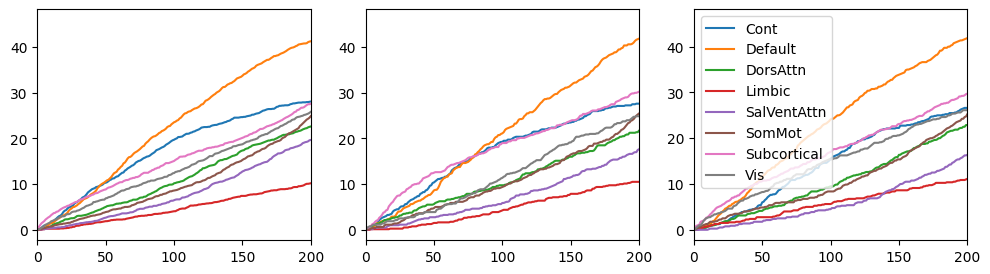

In [273]:
# Super plot per group
fig, axs = plt.subplots(1,3, figsize=(12,3))
for g in range(3):
    for i in range(8):
        axs[g].plot([x for x in range(1,236)], count_for_radar_top[g][:,:,i].mean(axis=-1), label=networks[i])
        axs[g].set_xlim(0,200)
    #     plt.yscale('log')
    plt.legend();

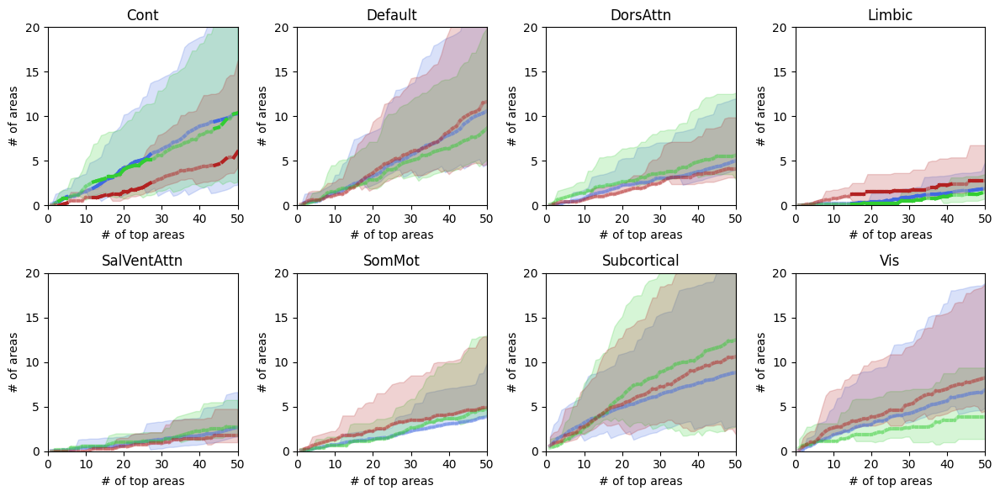

In [376]:
# Super plot per network - Top
max_ = 50
my_pal = {'C':'royalblue', 'B+':'limegreen', 'B-':'firebrick'}
fig, axs = plt.subplots(2,4, figsize=(12,6))
X = [x for x in range(1,max_+1)]
for i, ax in enumerate(axs.flat):
    # pair-wise test for each value of number of top areas
    # Loop over the # of top areas
    p_vals = []
    p_vals_b_nb = []
    for t in range(max_):
        c = count_for_radar_top[0][t,:,i]
        b = count_for_radar_top[1][t,:,i]
        nb = count_for_radar_top[2][t,:,i]
        p_vals.append(ttest_ind(b,nb)[1])
#     p_vals = multipletests(p_vals, alpha=0.05, method='fdr_bh')[1]
    for p in p_vals:
        if p<0.05:
            p_vals_b_nb.append(1)
        elif np.isnan(p):
            p_vals_b_nb.append(0.3)
        else:
            p_vals_b_nb.append(0.3)
    for g in range(3):
        mean=np.mean(count_for_radar_top[g][:,:,i], axis=-1)[:max_]
        perc_25 = np.percentile(count_for_radar_top[g][:,:,i], 25,axis=-1)[:max_]
        perc_75 = np.percentile(count_for_radar_top[g][:,:,i], 75, axis=-1)[:max_]
        for x in range(0,max_):
            ax.plot(X[x:x+2], mean[x:x+2], 
                    color=my_pal[groups_order_labels[g]],
                    label=groups_order_labels[g],
                    alpha=p_vals_b_nb[x], linewidth=3)
        ax.fill_between(X, mean-perc_25, mean+perc_75, alpha=0.2,
                        color=my_pal[groups_order_labels[g]])
        ax.set_xlim(0,max_)
        ax.set_ylim(0,20)
        ax.set_title(networks[i])
        ax.set_xlabel('# of top areas')
        ax.set_ylabel('# of areas')

    #     plt.yscale('log')
    plt.tight_layout()



TypeError: list indices must be integers or slices, not str

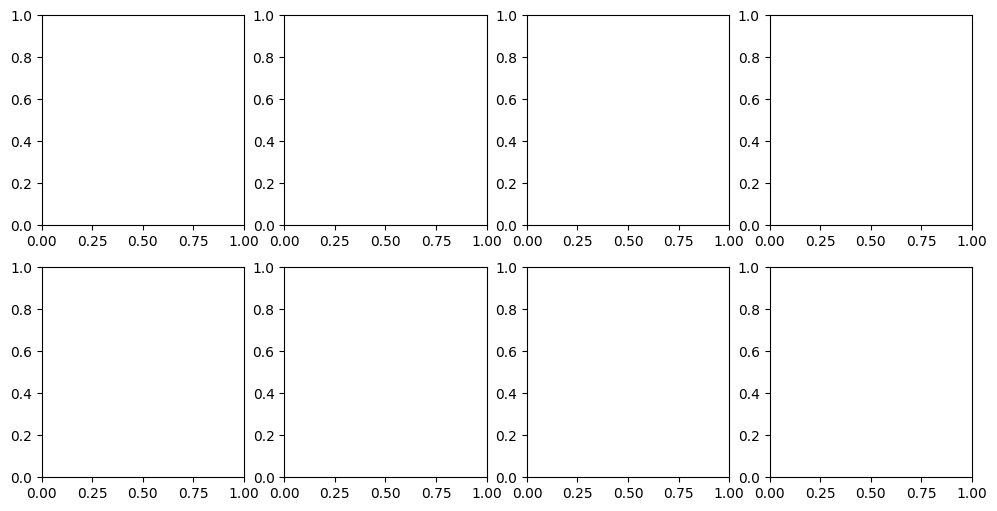

In [373]:
# Super plot per network - Bottom
my_pal = {'C':'royalblue', 'B+':'limegreen', 'B-':'firebrick'}
fig, axs = plt.subplots(2,4, figsize=(12,6))
X = [x for x in range(1,max_+1)]
for i, ax in enumerate(axs.flat):
    # pair-wise test for each value of number of bottom areas
    # Loop over the # of bottom areas
    p_vals = []
    p_vals_b_nb = []
    for t in range(count_for_radar_bottom[g][:,:,i].shape[0]):
        c = count_for_radar_bottom[0][t,:,i]
        b = count_for_radar_bottom[1][t,:,i]
        nb = count_for_radar_bottom[2][t,:,i]
        p_vals.append(ttest_ind(b,nb)[1])
    p_vals = multipletests(p_vals, alpha=0.05, method='fdr_bh')[1]
    for p in p_vals:
        if p<0.05:
            p_vals_b_nb.append(1)
        elif np.isnan(p):
            p_vals_b_nb.append(0.3)
        else:
            p_vals_b_nb.append(0.3)
    for g in range(3):
        mean=np.median(count_for_radar_bottom[g][:,:,i], axis=-1)[:max_]
        perc_25 = np.percentile(count_for_radar_bottom[g][:,:,i], 25,axis=-1)[:max_]
        perc_75 = np.percentile(count_for_radar_bottom[g][:,:,i], 75, axis=-1)[:max_]
        for x in range(0,max_):
            ax.plot(X[x:x+2], mean[x:x+2], 
                    color=my_pal[groups_order_labels[g]],
                    label=groups_order_labels[g],
                    alpha=p_vals_b_nb[x-1], linewidth=3)
        ax.fill_between([x for x in range(1,max_+1)], mean-perc_25, mean+perc_75, alpha=0.2, color=my_pal[groups_order_labels[g]])
        ax.set_xlim(0,max_)
        ax.set_ylim(0,20)
        ax.set_title(networks[i])
        ax.set_xlabel('# of bottom areas')
        ax.set_ylabel('# of areas')

    #     plt.yscale('log')
    plt.tight_layout()

(17, 236) (8, 236) (8, 236)
p-value annotation legend:
      ns: 4.17e-03 < p <= 1.00e+00
       *: 8.33e-04 < p <= 4.17e-03
      **: 8.33e-05 < p <= 8.33e-04
     ***: 8.33e-06 < p <= 8.33e-05
    ****: p <= 8.33e-06

RH_THA_DP_C vs. RH_THA_DP_B+: Brunner-Munzel test, P_val:4.767e-01 W=7.324e-01
RH_THA_VP_C vs. RH_THA_VP_B+: Brunner-Munzel test, P_val:3.862e-01 W=9.062e-01
LH_THA_DA_C vs. LH_THA_DA_B+: Brunner-Munzel test, P_val:5.937e-01 W=5.477e-01
LH_THA_VA_C vs. LH_THA_VA_B+: Brunner-Munzel test, P_val:6.291e-01 W=4.937e-01
RH_THA_DA_C vs. RH_THA_DA_B+: Brunner-Munzel test, P_val:3.197e-01 W=1.041e+00
RH_THA_VA_C vs. RH_THA_VA_B+: Brunner-Munzel test, P_val:4.682e-01 W=7.504e-01
LH_SC_C vs. LH_SC_B+: Brunner-Munzel test, P_val:5.943e-01 W=-5.419e-01
LH_THA_VP_B+ vs. LH_THA_VP_B-: Brunner-Munzel test, P_val:7.715e-01 W=2.962e-01
RH_THA_DP_B+ vs. RH_THA_DP_B-: Brunner-Munzel test, P_val:7.690e-01 W=2.996e-01
RH_THA_VP_B+ vs. RH_THA_VP_B-: Brunner-Munzel test, P_val:4.836e-02 W=-2.2

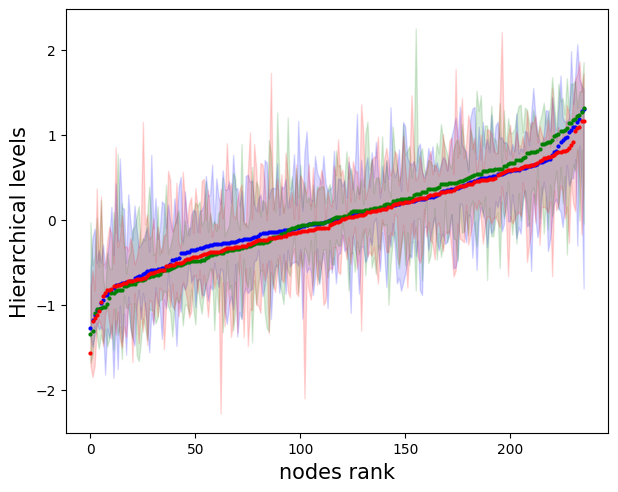

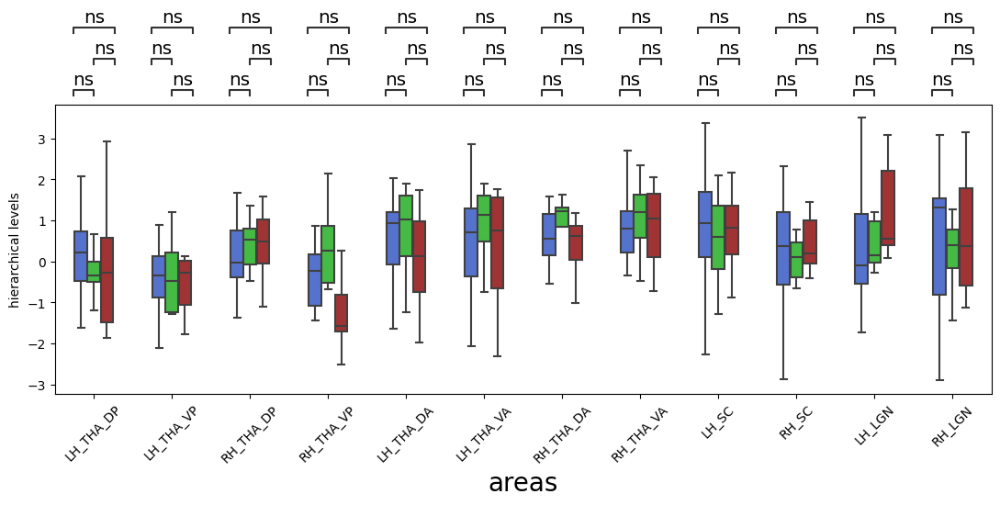

In [209]:
############################################################################################################
## Normalize the hieararchical levels for each subject, than compare interesting areas (e.g. subcortical) ##
############################################################################################################
seeddini = ['LH_THA_DP','LH_THA_VP', 'RH_THA_DP', 'RH_THA_VP', 'LH_THA_DA', 'LH_THA_VA', 'RH_THA_DA',
            'RH_THA_VA','LH_SC', 'RH_SC', 'LH_LGN', 'RH_LGN']

measure_name = 'Hierarchical levels'
measure = np.copy(hierarchicallevels)

sub_areas = atlas_labels['ROI_name'].values[200:].tolist()

groups_labels={'C':'C',
               'B':'B+',
               'NB':'B-'}
groups_order = ['C', 'B', 'NB']

# Normalize the values of each subject
measure = zscore(measure, axis=1)
# scaler = MinMaxScaler()
# measure = scaler.fit_transform(measure)

mes_C = np.empty((0,236))
mes_B = np.empty((0,236))
mes_NB = np.empty((0,236))
for i,group in enumerate(subjects_group):
    mes = np.copy(measure[i])
    if group=='C':
        mes_C = np.concatenate((mes_C, mes[np.newaxis,:]), axis=0)
    elif group=='B':
        mes_B = np.concatenate((mes_B, mes[np.newaxis,:]), axis=0)
    elif group=='NB':
        mes_NB = np.concatenate((mes_NB, mes[np.newaxis,:]), axis=0)
print(mes_C.shape, mes_B.shape, mes_NB.shape)    
mean_mes_C = np.median(mes_C, axis=0)
perc_mes_C = [np.percentile(mes_C, 25, axis=0), np.percentile(mes_C, 75, axis=0)]
mean_mes_B = np.median(mes_B, axis=0)
perc_mes_B = [np.percentile(mes_B, 25, axis=0), np.percentile(mes_B, 75, axis=0)]
mean_mes_NB = np.median(mes_NB, axis=0)
perc_mes_NB = [np.percentile(mes_NB, 25, axis=0), np.percentile(mes_NB, 75, axis=0)]

mes_per_group = [mes_C, mes_B, mes_NB]
measure_per_group = [mean_mes_C, mean_mes_B, mean_mes_NB]
perc_per_group = [perc_mes_C, perc_mes_B, perc_mes_NB]

fig,ax = plt.subplots(1,1, figsize=(7, 5.5))
labels = ['C','B+','B-']
colors = ['blue','green','red']
cmaps = ['RdBu','PiYG','bwr']
m_top = [] # Top 10% of areas for each group
m_top_arg = []
m_bottom = [] # Bottom 10% of areas for each group
m_bottom_arg = []
for g in range(3):
    mes = measure_per_group[g]
    perc = perc_per_group[g]
    rank = np.argsort(mes)
    # Save the healthy rank
    if g==0:
        h_rank=rank
    m = mes[rank]
    ax.plot(range(m.shape[0]), m, 'o', label=labels[g], color=colors[g], markersize=2)

    plt.fill_between(range(m.shape[0]), perc[0][rank], perc[1][rank], color=colors[g], alpha=0.15)
    ax.set_ylabel(measure_name, fontsize=15)
    ax.set_xlabel('nodes rank', fontsize=15)
    
# Now check the values for the normalized hierarchy levels
value = []
areas = []
group = []
for a_i,area in enumerate(seeddini): # Loop over areas
    idx = [atlas_labels[atlas_labels['ROI_name']==area].index.values[0]]
        
    for g in groups_order: # loop over groups
        mes = measure[np.where(subjects_group==g)]
    
        for m in mes: # Loop over subjects
            value.append(m[idx][0])
#             print(m[idx][0]
            areas.append(area)
            group.append(groups_labels[g])
            

# order the areas according to the median hierarchical values of the B+
seeddini_mes = [] # I take the hl values only of the subcort areas that I'm interested in
for seed in seeddini:
    seed_idx = atlas_labels.loc[atlas_labels['ROI_name']==seeddini[0]].index[0]
    seeddini_mes.append(measure[np.where(subjects_group=='B')][1,seed_idx])
    
B_hl_order = np.argsort(seeddini_mes)
# PLOT WITH STATISTICS
df_metrics = pd.DataFrame(data = {'hierarchical levels': value, 'groups': group, 'areas':areas})
seeddini_ordered = [seeddini[idx] for idx in B_hl_order]

groups_order = ['C', 'B+', 'B-']
pairs = [[(a,'C'),(a,'B+')] for a in seeddini] + \
         [[(a,'C'),(a,'B-')] for a in seeddini] + \
         [[(a,'B+'),(a,'B-')] for a in seeddini]
my_pal = {'C':'royalblue', 'B+':'limegreen', 'B-':'firebrick'}
annot_test =  'Brunner-Munzel'

hue_plot_params = {
    'data': df_metrics,
    'x': 'areas',
    'y': 'hierarchical levels',
    "order": seeddini,
    "hue": 'groups',
    "hue_order": groups_order,
    "palette": my_pal
}

fig,ax = plt.subplots(1,1, figsize=(11,6))
with sns.plotting_context("notebook", font_scale = 1.2):
    # Create new plot
#     ax = get_log_ax()

    # Plot with seaborn
    sns.boxplot(ax=ax, **hue_plot_params,
                     showfliers=False,
                     width=0.5)

    # Add annotations
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test=annot_test, text_format='star', loc='outside')
                        # ,comparisons_correction='Benjamini-Hochberg')
    annotator._pvalue_format.pvalue_thresholds =  [[0.0001/len(seeddini), '****'],
                                                   [0.001/len(seeddini), '***'],
                                                   [0.01/len(seeddini), '**'], [0.05/len(seeddini), '*'],
                                                   [1, 'ns']]
    _, stat = annotator.apply_and_annotate();
    ax.set_xlabel('areas',fontsize=20)

    # Label and show
    plt.legend([],[], frameon=False)
#     plt.legend(loc='lower right', fontsize=10, bbox_to_anchor=(1.2, 0))
    ax.set_xticklabels(seeddini_ordered, rotation=45)
#     ax.set_yticklabels([x for x in range(0,100,20)])

#     ax.set_ylim(0,100)
plt.tight_layout()

In [126]:
# Another approach could be to use the hierachical values normalized from 0 to 1 with respect to each group
# Plot the percentile of the hl values of the selected suncbort areas with respect of the distribution 
# of hierarchical values. Plot the distribution of these percentile of all the subject
measure_name = 'Hierarchical levels'
measure = hierarchicallevels

sub_areas = atlas_labels['ROI_name'].values[200:].tolist()


groups_labels={'C':'C',
               'B':'B+',
               'NB':'B-'}
groups_order = ['C', 'B', 'NB']


value = []
areas = []
group = []
for a_i,area in enumerate(sub_areas): # Loop over areas
    for s in sd:
        idx = [atlas_labels[atlas_labels['ROI_name']==area].index.values[0]]
        
    for g in groups_order: # loop over groups
        mes = measure[np.where(subjects_group==g)]
    
        for m in mes: # Loop over subjects
            pos = np.where(m.argsort()==idx)[0][0] # position in the sorted distribution of values
            perc = (pos/236)*100 # percentage version of the position value
            value.append(perc)
            areas.append(area)
            group.append(groups_labels[g])

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

RH_pHIP_C vs. RH_pHIP_B+: Brunner-Munzel test, P_val:2.558e-01 W=1.213e+00
RH_THA_DP_C vs. RH_THA_DP_B+: Brunner-Munzel test, P_val:4.758e-01 W=7.330e-01
RH_THA_VA_C vs. RH_THA_VA_B+: Brunner-Munzel test, P_val:4.772e-01 W=7.341e-01
RH_THA_DA_C vs. RH_THA_DA_B+: Brunner-Munzel test, P_val:4.388e-01 W=7.990e-01
RH_NAc_shell_C vs. RH_NAc_shell_B+: Brunner-Munzel test, P_val:1.708e-01 W=1.479e+00
RH_NAc_core_C vs. RH_NAc_core_B+: Brunner-Munzel test, P_val:1.816e-01 W=1.419e+00
RH_aGP_C vs. RH_aGP_B+: Brunner-Munzel test, P_val:7.920e-01 W=-2.674e-01
RH_aPUT_C vs. RH_aPUT_B+: Brunner-Munzel test, P_val:1.939e-02 W=2.750e+00
RH_aCAU_C vs. RH_aCAU_B+: Brunner-Munzel test, P_val:4.415e-01 W=8.013e-01
RH_pCAU_C vs. RH_pCAU_B+: Brunner-Munzel test, P_val:6.426e-01 W=4.777e-01
LH_THA_VA_C vs. LH_THA_VA_B+:

LH_THA_DP_C vs. LH_THA_DP_B-: Brunner-Munzel test, P_val:4.844e-01 W=-7.320e-01
LH_aGP_C vs. LH_aGP_B-: Brunner-Munzel test, P_val:1.969e-01 W=-1.368e+00
RH_SC_C vs. RH_SC_B-: Brunner-Munzel test, P_val:9.288e-01 W=9.041e-02
LH_LGN_C vs. LH_LGN_B-: Brunner-Munzel test, P_val:1.109e-01 W=1.667e+00


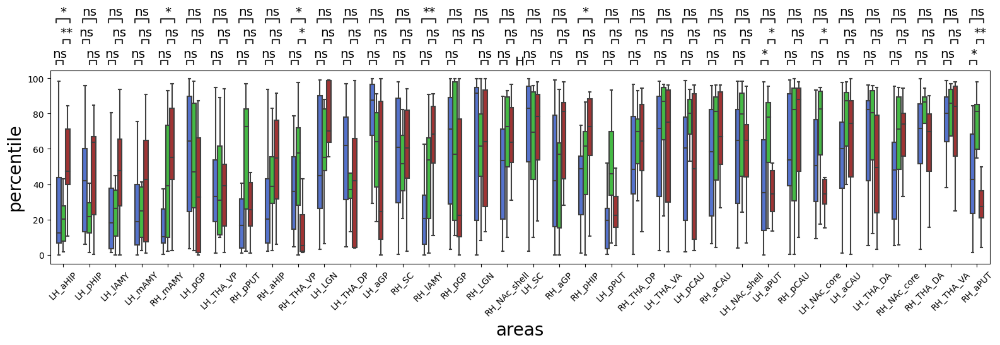

In [149]:
# order the areas according to the median hierarchical values of the B+
mes = np.median(measure[np.where(subjects_group=='B')][:,200:], axis=0)
B_hl_order = mes.argsort()
# PLOT WITH STATISTICS
df_metrics = pd.DataFrame(data = {'percentile': value, 'groups': group, 'areas':areas})
sub_areas_ordered = [sub_areas[idx] for idx in B_hl_order]

groups_order = ['C', 'B+', 'B-']
pairs = [[(a,'C'),(a,'B+')] for a in sub_areas] + \
         [[(a,'C'),(a,'B-')] for a in sub_areas] + \
         [[(a,'B+'),(a,'B-')] for a in sub_areas]
my_pal = {'C':'royalblue', 'B+':'limegreen', 'B-':'firebrick'}
annot_test =  'Brunner-Munzel'

hue_plot_params = {
    'data': df_metrics,
    'x': 'areas',
    'y': 'percentile',
    "order": sub_areas_ordered,
    "hue": 'groups',
    "hue_order": groups_order,
    "palette": my_pal
}

fig,ax = plt.subplots(1,1, figsize=(16,6))
with sns.plotting_context("notebook", font_scale = 1.2):
    # Create new plot
#     ax = get_log_ax()

    # Plot with seaborn
    sns.boxplot(ax=ax, **hue_plot_params,
                     showfliers=False,
                     width=0.5)

    # Add annotations
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test=annot_test, text_format='star', loc='outside')
                        # ,comparisons_correction='Benjamini-Hochberg')
    annotator._pvalue_format.pvalue_thresholds =  [[0.0001, '****'], [0.001, '***'], [0.01, '**'], [0.05, '*'], [1, 'ns']]
    _, stat = annotator.apply_and_annotate();
    ax.set_xlabel('areas',fontsize=20)
    ax.set_ylabel('percentile', fontsize=20)

    # Label and show
    plt.legend([],[], frameon=False)
#     plt.legend(loc='lower right', fontsize=10, bbox_to_anchor=(1.2, 0))
    plt.title(measure_name)
    ax.set_xticklabels(sub_areas_ordered, rotation=45)
#     ax.set_yticklabels([x for x in range(0,100,20)])

#     ax.set_ylim(0,100)
plt.tight_layout()

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Subcortical_B vs. Subcortical_NB: Brunner-Munzel test, P_val:4.646e-01 W=7.638e-01
SomMot_C vs. SomMot_B: Brunner-Munzel test, P_val:8.177e-01 W=-2.339e-01
Subcortical_C vs. Subcortical_B: Brunner-Munzel test, P_val:5.861e-01 W=-5.528e-01
SomMot_B vs. SomMot_NB: Brunner-Munzel test, P_val:4.287e-01 W=8.165e-01
Subcortical_C vs. Subcortical_NB: Brunner-Munzel test, P_val:7.925e-01 W=2.690e-01
SomMot_C vs. SomMot_NB: Brunner-Munzel test, P_val:7.496e-01 W=3.253e-01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Subcortical_B vs. Subcortical_NB: Brunner-Munzel test, P_val:6.334e-01 W=4.883e-01
SomMot_C vs. SomMot_B: Brunner-Munzel test, P_val:7.884e-01 W=-2.

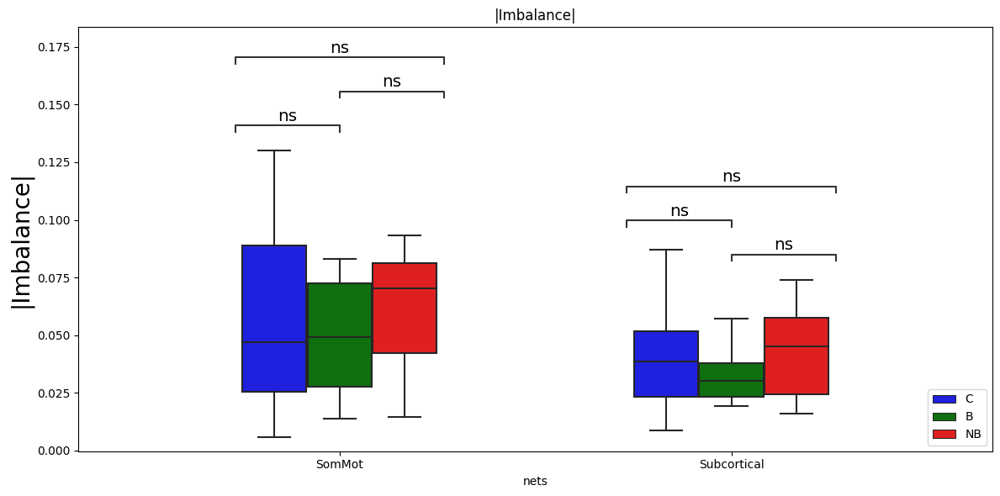

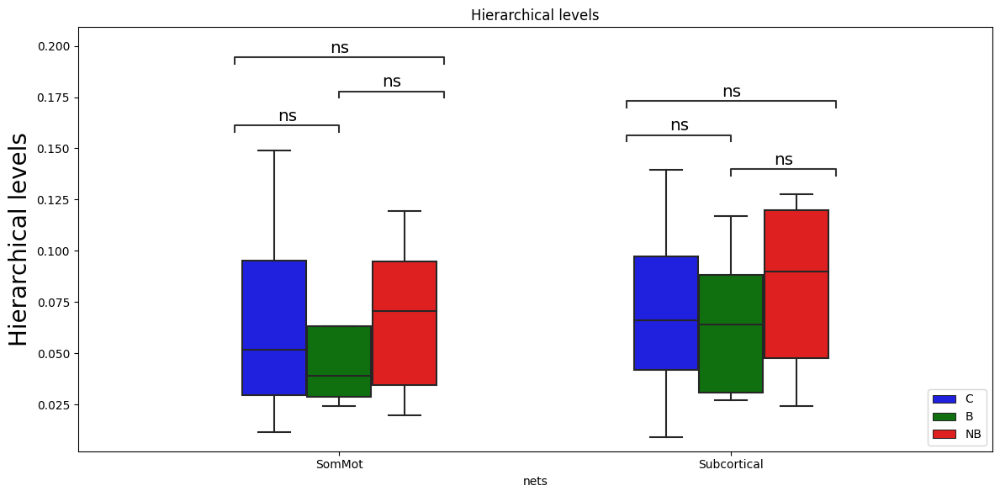

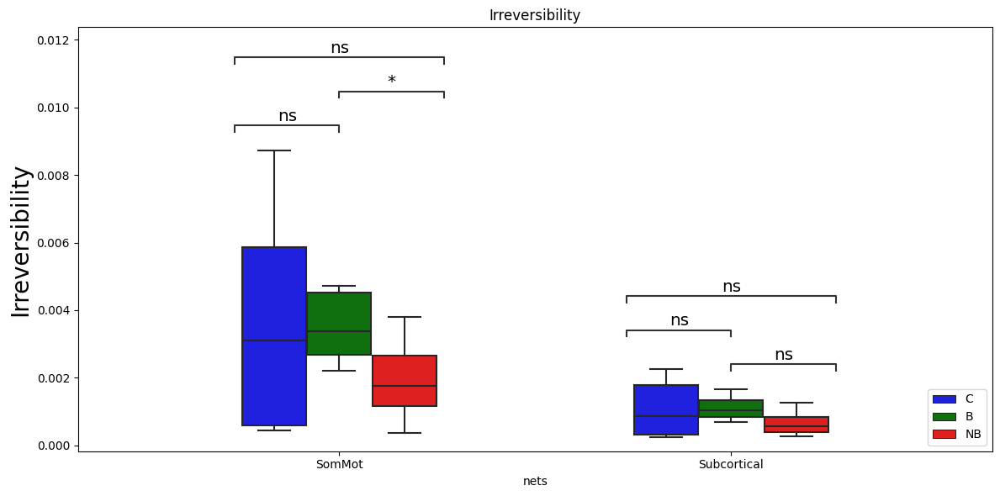

In [215]:
measure_name = ['|Imbalance|','Hierarchical levels', 'Irreversibility']
net_or_state = 'ROI_network'
if net_or_state=='ROI_network':
    network_per_area = atlas_labels['ROI_network'].values
    nets=networks
else:
    network_per_area = atlas_labels['ROI_state'].values
    nets = ['DMN', 'Somatosensory','Visual','Subcortical']

all_net = False
my_nets = ['SomMot','Subcortical']

network_per_area = atlas_labels[net_or_state].values
measures = [imbalance, hierarchicallevels, I_per_area]
col_dic = {'C':'b','B':'g','NB':'r'}
for m_i, measure_n in enumerate(measure_name):
    mes = []
    groups = []
    nets = []
    for g_i, g in enumerate(['C','B','NB']):
        where_g = np.where(subjects_group==g)
        if m_i==0:
            measure = np.abs(measures[m_i][where_g])
        else:
            measure = measures[m_i][where_g]
            
        if all_net:
            mean_mes = np.mean(measure, axis=0)
            mean_mes_reord = np.zeros((len(nets),))

            # Reoder the areas per network
            for n_i, network in enumerate(nets):
                idx = atlas_labels.loc[atlas_labels[net_or_state]==network].index.values
                mean_mes_reord[n_i] = mean_mes[idx].mean()
            plt.bar([x+g_i*0.1 for x in range(1,len(nets)+1)], np.abs(mean_mes_reord), color=col_dic[g], alpha=0.4,tick_label=nets, width=0.7,
                    edgecolor=col_dic[g], linewidth=1.5)
            ax.set_xticklabels(nets, rotation=54)
    
        else:
#             print(measure.shape)
            for n_i, network in enumerate(my_nets):
                idx = atlas_labels.loc[atlas_labels[net_or_state]==network].index.values
                mes += measure[:,idx].mean(axis=1).tolist()
                groups += [g]*len(measure[:,idx].mean(axis=1).tolist())
                nets += [network]*len(measure[:,idx].mean(axis=1).tolist())
        
    #Plot
    # PLOT WITH STATISTICS
    df_metrics = pd.DataFrame(data = {'mes':  mes, 'nets': nets, 'groups':groups})

    groups_order = ['C', 'B', 'NB']
    pairs = [[(s,'C'),(s,'B')] for s in my_nets] + \
             [[(s,'C'),(s,'NB')] for s in my_nets] + \
             [[(s,'B'),(s,'NB')] for s in my_nets]
    my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
    annot_test =  'Brunner-Munzel'

    hue_plot_params = {
        'data': df_metrics,
        'x': 'nets',
        'y': 'mes',
        "order": my_nets,
        "hue": 'groups',
        "hue_order": groups_order,
        "palette": my_pal
    }

    fig,ax = plt.subplots(1,1, figsize=(12,6))
    with sns.plotting_context("notebook", font_scale = 1.2):
        # Create new plot
    #     ax = get_log_ax()

        # Plot with seaborn
        sns.boxplot(ax=ax, **hue_plot_params,
                         showfliers=False,
                         width=0.5)

        # Add annotations
        annotator = Annotator(ax, pairs, **hue_plot_params)
        annotator.configure(test=annot_test, text_format='star', loc='inside')
                            # ,comparisons_correction='Benjamini-Hochberg')
        annotator._pvalue_format.pvalue_thresholds =  [[0.0001, '****'], [0.001, '***'], [0.01, '**'], [0.05, '*'], [1, 'ns']]
        _, stat = annotator.apply_and_annotate()
        ax.set_ylabel(measure_name[m_i], fontsize=20)

    # Label and show
    plt.legend(loc='lower right', fontsize=10)


    plt.title(measure_n)
    plt.tight_layout()
    #     if net_or_state=='ROI_networks':
    #         plt.savefig('output_global_Malta/'+measure_n+'_networks_barplot.png',dpi=200)
    #     else:
    #         plt.savefig('output_global_Malta_states/'+measure_n+'_networks_barplot.png',dpi=200) 

/tmp/ipykernel_244257/1620299420.py:25: RuntimeWarning: Mean of empty slice.
  minchia = mess[np.where(network_per_area_sort==net)].mean()
/home/alessio/miniconda3/envs/enigma/lib/python3.12/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DorsAttn_C vs. DorsAttn_B: Brunner-Munzel test, P_val:4.175e-01 W=8.257e-01
Limbic_C vs. Limbic_B: Brunner-Munzel test, P_val:9.329e-03 W=-2.954e+00
SalVentAttn_C vs. SalVentAttn_B: Brunner-Munzel test, P_val:5.143e-01 W=6.658e-01
SomMot_C vs. SomMot_B: Brunner-Munzel test, P_val:7.153e-01 W=3.694e-01
Subcortical_C vs. Subcortical_B: Brunner-Munzel test, P_val:5.186e-01 W=-6.583e-01
Vis_C vs. Vis_B: Brunner-Munzel test, P_val:9.098e-01 W=1.150e-01
Default_B vs. Default_NB: Brunner-Munzel test, P_val:9.237e-01 W=9.792e-02
DorsAttn_B vs. DorsAttn_NB: Brunner-Munzel test, P_val:9.259e-01 W=9.559e-02
Limbic_B vs. Limbic_NB: Brunner-Munzel test, P_val:3.315e-02 W=2.646e+00
SalVentAttn_B vs. SalVentAttn_NB: Brunner-Munzel test, P_val:1.000e+00 W=0.000e+00
SomMot_B vs. SomMot_NB: Brunner-Munzel test, P_val:5.526e-0

/tmp/ipykernel_244257/1620299420.py:25: RuntimeWarning: Mean of empty slice.
  minchia = mess[np.where(network_per_area_sort==net)].mean()
/home/alessio/miniconda3/envs/enigma/lib/python3.12/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

DorsAttn_C vs. DorsAttn_B: Brunner-Munzel test, P_val:7.911e-01 W=2.717e-01
Limbic_C vs. Limbic_B: Brunner-Munzel test, P_val:6.837e-01 W=-4.164e-01
SalVentAttn_C vs. SalVentAttn_B: Brunner-Munzel test, P_val:9.455e-02 W=-1.748e+00
SomMot_C vs. SomMot_B: Brunner-Munzel test, P_val:5.079e-01 W=6.768e-01
Subcortical_C vs. Subcortical_B: Brunner-Munzel test, P_val:6.004e-01 W=-5.383e-01
Vis_C vs. Vis_B: Brunner-Munzel test, P_val:4.785e-01 W=7.273e-01
Default_B vs. Default_NB: Brunner-Munzel test, P_val:8.491e-01 W=1.940e-01
DorsAttn_B vs. DorsAttn_NB: Brunner-Munzel test, P_val:8.806e-01 W=-1.532e-01
Limbic_B vs. Limbic_NB: Brunner-Munzel test, P_val:7.892e-03 W=3.096e+00
SalVentAttn_B vs. SalVentAttn_NB: Brunner-Munzel test, P_val:9.171e-01 W=1.061e-01
SomMot_B vs. SomMot_NB: Brunner-Munzel test, P_val:7.596e

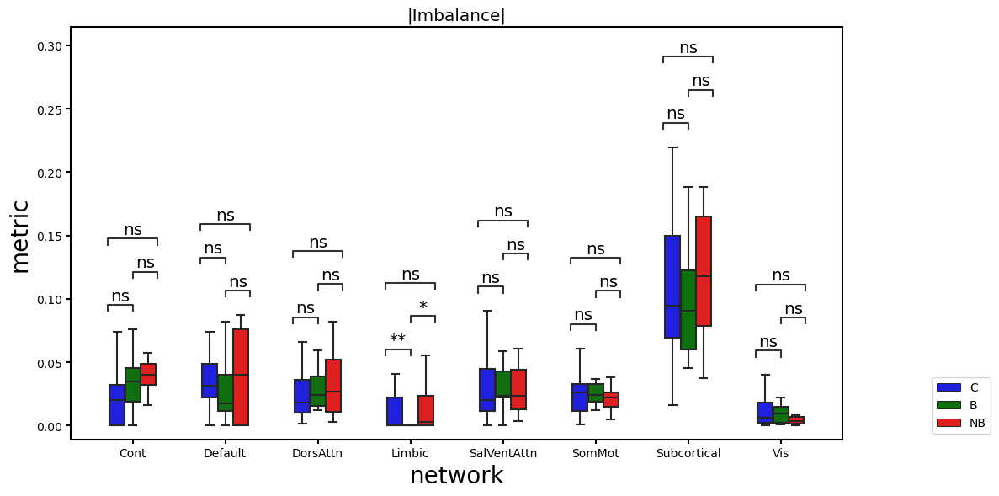

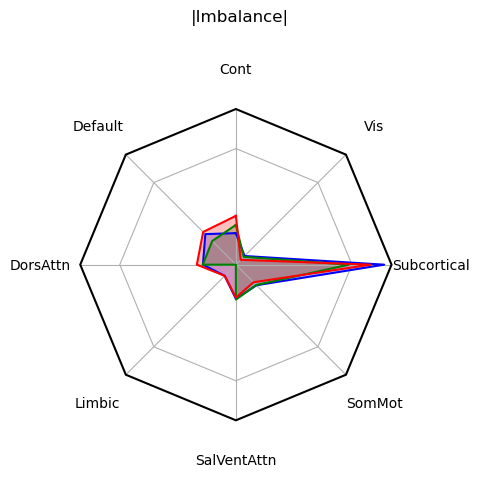

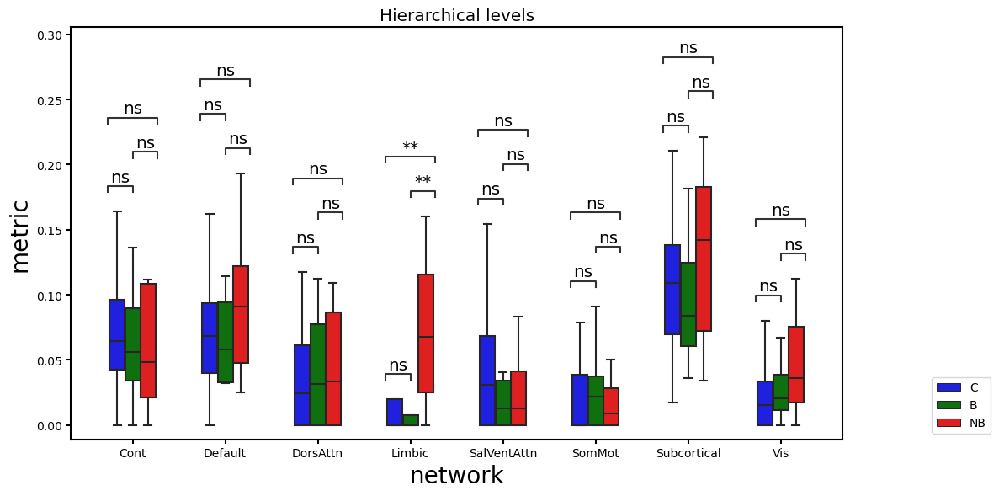

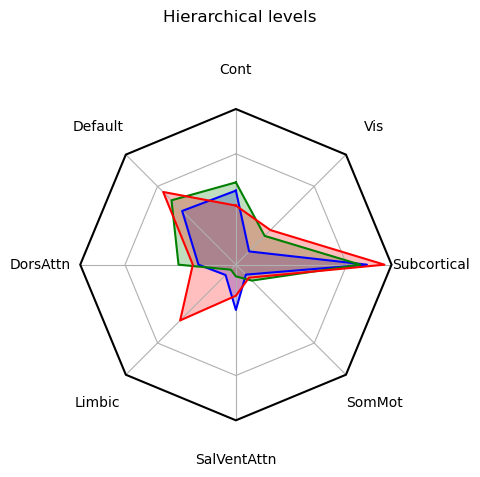

In [136]:
# PLot the distribution of hierarchical levels and imbalance per group per labels
measure_name = ['|Imbalance|','Hierarchical levels']
network_per_area = atlas_labels['ROI_network'].values
top_nodes_ = True
for m_i, measure in enumerate([imbalance, hierarchicallevels]):
    group_all = []
    net_all = []
    mes_all = []
    for i,group in enumerate(subjects_group):
        mes_ = np.copy(measure[i])
        if measure_name[m_i]=='|Imbalance|':
            mes_ = np.abs(mes_)
        mes = np.sort(mes_)
        mes_arg = np.argsort(mes_)
        network_per_area = atlas_labels['ROI_network'].values
        if top_nodes_:
            # Take the n-top nodes based on the rank of the current measure
            top_nodes = mes_arg[-top_tail:]
            network_per_area_sort = network_per_area[top_nodes]
            mess = mes[top_nodes]
        else:
            mess = mes
            network_per_area_sort = network_per_area[mes_arg]
        for net in networks:
            minchia = mess[np.where(network_per_area_sort==net)].mean()
            if np.isnan(minchia):
                minchia = 0
            mes_all.append(minchia)
            net_all.append(net)
            group_all.append(group)
    
    # PLOT WITH STATISTICS
    df_metrics = pd.DataFrame(data = {'metric': mes_all, 'groups': group_all, 'network':net_all})

    groups_order = ['C', 'B', 'NB']
    pairs = [[(net,'C'),(net,'B')] for net in networks] + \
             [[(net,'C'),(net,'NB')] for net in networks] + \
             [[(net,'B'),(net,'NB')] for net in networks]
    my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
    annot_test =  'Brunner-Munzel'
    
    hue_plot_params = {
        'data': df_metrics,
        'x': 'network',
        'y': 'metric',
        "order": networks,
        "hue": 'groups',
        "hue_order": groups_order,
        "palette": my_pal
    }
    
    fig,ax = plt.subplots(1,1, figsize=(12,6))
    with sns.plotting_context("notebook", font_scale = 1.2):
        # Create new plot
    #     ax = get_log_ax()
    
        # Plot with seaborn
        sns.boxplot(ax=ax, **hue_plot_params,
                         showfliers=False,
                         width=0.5)
        
        # Add annotations
        annotator = Annotator(ax, pairs, **hue_plot_params)
        annotator.configure(test=annot_test, text_format='star', loc='inside')
                            # ,comparisons_correction='Benjamini-Hochberg')
        annotator._pvalue_format.pvalue_thresholds =  [[0.0001, '****'], [0.001, '***'], [0.01, '**'], [0.05, '*'], [1, 'ns']]
        _, stat = annotator.apply_and_annotate()
        ax.set_xlabel('network',fontsize=20)
        ax.set_ylabel('metric', fontsize=20)
    
        # Label and show
        plt.legend(loc='lower right', fontsize=10, bbox_to_anchor=(1.2, 0))
        plt.title(measure_name[m_i])
    plt.tight_layout()

    # plt.savefig('output_global/'+measure_name[m_i]+'_top'+str(n)+'_radar.png', dpi=200)

    # RADAR
    count_for_radar = []
    for g in range(3): 
        df_metrics_g = df_metrics.loc[df_metrics['groups']==groups_order[g]]
        coun = [df_metrics_g.loc[df_metrics_g['network']==net]['metric'].values.mean() for net in networks]
        count_for_radar.append(coun)
        
    fig = make_radar(networks, count_for_radar, groups_order, measure_name[m_i])
    # break

KeyError: 'B'

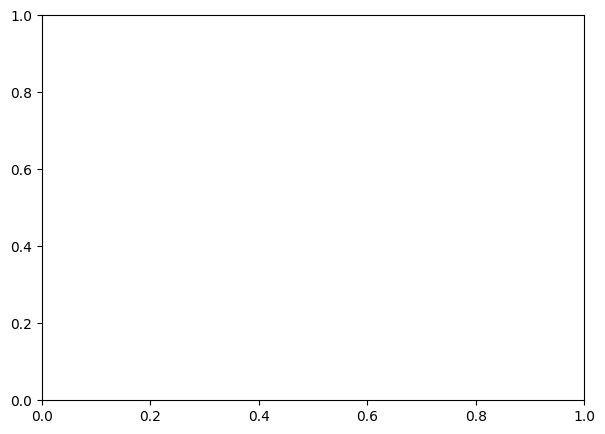

In [477]:
# Find the best n% of the rank
n = 10
top_tail = int(236/100*n)
tot_per_g = [17*top_tail, 8*top_tail, 8*top_tail]
measure_name = ['|Imbalance|','Hierarchical levels']
for m_i, measure in enumerate([imbalance, hierarchicallevels]):
    mes_C = []
    mes_B = []
    mes_NB = []
    count_dic = {'C':{}, 
                 'B':{},
                 'NB':{}}

    count_all = []
    nets_all = []
    groups_all = []
    groups_nodes_all = []
    top_nodes_all = []
    for i,group in enumerate(subjects_group):
        mes_ = np.copy(measure[i])
        if measure_name[m_i]=='|Imbalance|':
            mes_ = np.abs(mes_)
        mes = np.sort(mes_)
        mes_arg = np.argsort(mes_)
        # Take the n-top nodes based on the rank of the current measure
        # print(mes_arg[-top_tail:])
        top_nodes = mes_arg[-top_tail:]
        # print(top_nodes.shape)
        top_nodes_all = top_nodes_all + mes[-top_tail:].tolist()
        groups_nodes_all = groups_nodes_all + [group]*top_tail
        # print(len(top_nodes_all), len(groups_nodes_all))

        top_nodes_count = count_node_per_net(top_nodes, networks, atlas_labels)
        for net in top_nodes_count.keys():
            count_all.append(top_nodes_count[net])
            nets_all.append(net)
            groups_all.append(group)

            if net in count_dic[group]:
                count_dic[group][net] += top_nodes_count[net]
            else:
                count_dic[group][net] = top_nodes_count[net]
            

    # PLOT THE DISTRIBUTION OF THE TOP 10%
    # I put together all the top area of all the patients of a group
    pairs = [('C','B'),('C','NB'),('B','NB')]
    df = pd.DataFrame({'metric':top_nodes_all, 'groups':groups_nodes_all})
    hue_plot_params = {
        'data': df,
        'x': 'groups',
        'y': 'metric',
        "order": ['C','B','NB'],
        "palette": my_pal
    }
    fig,ax = plt.subplots(1,1, figsize=(7,5))
    with sns.plotting_context("notebook", font_scale = 1.2):
        sns.boxplot(**hue_plot_params, showfliers=False, width=0.5, ax=ax)
        annotator = Annotator(ax, pairs, **hue_plot_params)
        annotator.configure(test=annot_test, text_format='star', loc='inside')
                            # ,comparisons_correction='Benjamini-Hochberg')
        _, stat = annotator.apply_and_annotate()
        plt.title('Top 10% '+measure_name[m_i])
        plt.tight_layout()
    
    plt.savefig('output_global/'+measure_name[m_i]+'_top'+str(n)+'_distr.png', dpi=200)
    
    # # PLOT WITH STATISTICS
    # df_metrics = pd.DataFrame(data = {'count': count_all, 'groups': groups_all, 'network':nets_all})

    # groups_order = ['C', 'B', 'NB']
    # pairs = [[(net,'C'),(net,'B')] for net in networks] + \
    #          [[(net,'C'),(net,'NB')] for net in networks] + \
    #          [[(net,'B'),(net,'NB')] for net in networks]
    # my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
    # annot_test =  'Brunner-Munzel'
    
    # hue_plot_params = {
    #     'data': df_metrics,
    #     'x': 'network',
    #     'y': 'count',
    #     "order": networks,
    #     "hue": 'groups',
    #     "hue_order": groups_order,
    #     "palette": my_pal
    # }
    
    # fig,ax = plt.subplots(1,1, figsize=(12,6))
    # with sns.plotting_context("notebook", font_scale = 1.2):
    #     # Create new plot
    # #     ax = get_log_ax()
    
    #     # Plot with seaborn
    #     sns.boxplot(ax=ax, **hue_plot_params,
    #                      showfliers=False,
    #                      width=0.5)
        
    #     # Add annotations
    #     annotator = Annotator(ax, pairs, **hue_plot_params)
    #     annotator.configure(test=annot_test, text_format='star', loc='inside')
    #                         # ,comparisons_correction='Benjamini-Hochberg')
    #     annotator._pvalue_format.pvalue_thresholds =  [[0.0001, '****'], [0.001, '***'], [0.01, '**'], [0.05, '*'], [1, 'ns']]
    #     _, stat = annotator.apply_and_annotate()
    #     ax.set_xlabel('network',fontsize=20)
    #     ax.set_ylabel('count', fontsize=20)
    
    #     # Label and show
    #     plt.legend(loc='lower right', fontsize=10, bbox_to_anchor=(1.2, 0))
    # plt.tight_layout()

    # PLOT WITHOUT STATISTICS
    fig, axs = plt.subplots(1,3, figsize=(13, 4))
    fig.suptitle(measure_name[m_i])
    for g in range(3): 
        countz = count_dic[groups_order[g]]
        
        axs[g].bar(x=np.arange(len(networks)), height=[v/tot_per_g[g] for v in countz.values()], tick_label=networks)
        axs[g].set_xticklabels(networks, rotation=54)
        axs[g].set_ylim(0,0.35)
        axs[g].set_title(groups_order[g])
    plt.tight_layout()
    plt.savefig('output_global/'+measure_name[m_i]+'_top'+str(n)+'_bars.png', dpi=200)


    # RADAR
    count_for_radar = []
    for g in range(3): 
        countz = count_dic[groups_order[g]]
        coun = [v/tot_per_g[g] for v in countz.values()]
        count_for_radar.append(coun)
        
    fig = make_radar(networks, count_for_radar, groups_order, measure_name[m_i])
    # plt.savefig('output_global/'+measure_name[m_i]+'_top'+str(n)+'_radar.png', dpi=200)

        
    # break

## Now look at a single area-level

# makeradar

In [31]:
from matplotlib.patches import Circle, RegularPolygon
from matplotlib.path import Path
from matplotlib.projections.polar import PolarAxes
from matplotlib.projections import register_projection
from matplotlib.spines import Spine
from matplotlib.transforms import Affine2D

# Data has to be in the form of a nested list lines x vertex

def radar_factory(num_vars, frame='polygon'):
    """
    Create a radar chart with `num_vars` axes.

    This function creates a RadarAxes projection and registers it.

    Parameters
    ----------
    num_vars : int
        Number of variables for radar chart.
    frame : {'circle', 'polygon'}
        Shape of frame surrounding axes.

    """
    # calculate evenly-spaced axis angles
    theta = np.linspace(0, 2*np.pi, num_vars, endpoint=False)

    class RadarTransform(PolarAxes.PolarTransform):

        def transform_path_non_affine(self, path):
            # Paths with non-unit interpolation steps correspond to gridlines,
            # in which case we force interpolation (to defeat PolarTransform's
            # autoconversion to circular arcs).
            if path._interpolation_steps > 1:
                path = path.interpolated(num_vars)
            return Path(self.transform(path.vertices), path.codes)

    class RadarAxes(PolarAxes):

        name = 'radar'
        PolarTransform = RadarTransform

        def __init__(self, *args, **kwargs):
            super().__init__(*args, **kwargs)
            # rotate plot such that the first axis is at the top
            self.set_theta_zero_location('N')

        def fill(self, *args, closed=True, **kwargs):
            """Override fill so that line is closed by default"""
            return super().fill(closed=closed, *args, **kwargs)

        def plot(self, *args, **kwargs):
            """Override plot so that line is closed by default"""
            lines = super().plot(*args, **kwargs)
            for line in lines:
                self._close_line(line)

        def _close_line(self, line):
            x, y = line.get_data()
            # FIXME: markers at x[0], y[0] get doubled-up
            if x[0] != x[-1]:
                x = np.append(x, x[0])
                y = np.append(y, y[0])
                line.set_data(x, y)

        def set_varlabels(self, labels):
            self.set_thetagrids(np.degrees(theta), labels, position=(-0.13,-0.13),
                                horizontalalignment='center', fontsize=10 )

        def _gen_axes_patch(self):
            # The Axes patch must be centered at (0.5, 0.5) and of radius 0.5
            # in axes coordinates.
            if frame == 'circle':
                return Circle((0.5, 0.5), 0.5)
            elif frame == 'polygon':
                return RegularPolygon((0.5, 0.5), num_vars,
                                      radius=.5, edgecolor="k")
            else:
                raise ValueError("Unknown value for 'frame': %s" % frame)

        def _gen_axes_spines(self):
            if frame == 'circle':
                return super()._gen_axes_spines()
            elif frame == 'polygon':
                # spine_type must be 'left'/'right'/'top'/'bottom'/'circle'.
                spine = Spine(axes=self,
                              spine_type='circle',
                              path=Path.unit_regular_polygon(num_vars))
                # unit_regular_polygon gives a polygon of radius 1 centered at
                # (0, 0) but we want a polygon of radius 0.5 centered at (0.5,
                # 0.5) in axes coordinates.
                spine.set_transform(Affine2D().scale(.5).translate(.5, .5)
                                    + self.transAxes)
                return {'polar': spine}
            else:
                raise ValueError("Unknown value for 'frame': %s" % frame)

    register_projection(RadarAxes)
    return theta

def make_radar(vertex_ticks, data, labels, title, shape='polygon'):
    N = len(vertex_ticks)
    theta = radar_factory(N, frame=shape)
    
    
    fig, axs = plt.subplots(figsize=(5, 5), nrows=1, ncols=1,
                            subplot_kw=dict(projection='radar'))
    fig.suptitle(title)
    fig.subplots_adjust(wspace=0.25, hspace=0.20, top=0.85, bottom=0.05)
    
    colors = list(my_pal.values())
    # Plot the four cases from the example data on separate axes
    axs.set_rgrids([2,4,6,8,10])
    # axs.set_title('cane', weight='bold', size='medium', position=(0.5, 1.1),
    #              horizontalalignment='center', verticalalignment='center')
    
    
    for d, color in zip(data, colors):
        axs.plot(theta, d, color=color)
        axs.set_rticks([2,4,6,8,10], labels=[2,4,6,8,10])
    #     axs.set_rlabel_position(-360/5)
        axs.set_rlabel_position(-60)
        axs.fill(theta, d, facecolor=color, alpha=0.25, label='_nolegend_')
    axs.set_varlabels(vertex_ticks)
    
    # add legend relative to top-left plot
    # legend = axs.legend(labels, loc=(0.8, .85),
    #                           labelspacing=0.1, fontsize=12)
    
    # plt.show()
    plt.tight_layout()

# Perturbation???

## Response to perturbation in V1

In [207]:
# Take the average among healthy subjects
# Compute the difference in the activity between average of the healthy subjects and pateints
perturb_labels = ['L_V1','R_V1']
dF0 = 0.01
Fmax = 0.1
group_idx = {'C':0, 'B':1, 'NB':2}
for p_i,p in enumerate(perturb_labels): # Loop over perturbed areas
    pat_conc_pert = [[],[],[]]
    for f_i,f in enumerate([dF0*f for f in range(int(Fmax/dF0))]):
        pat_conc = [np.empty((0,236,236)), np.empty((0,236,236)), np.empty((0,236,236))]
        for sub_i,sub in enumerate(subjects_code):
            g = subjects_group[sub_i]
            pert_patient = scipy.io.loadmat('../data/EffectiveConnectivity/perturbations/V1_10sim/Pert_FCsim_'+sub+'.mat')
            pat_conc[group_idx[g]] = np.concatenate((pat_conc[group_idx[g]], pert_patient['FC_pert_all'][p_i][f_i][np.newaxis,:]), axis=0)
        for i in range(3):
            pat_conc_pert[i].append(pat_conc[i])


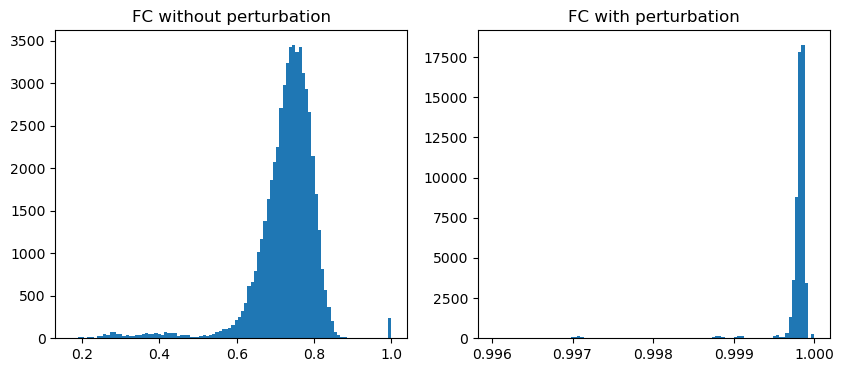

In [208]:
# sns.heatmap(pat_conc_pert[0][0][0])
fig,axs = plt.subplots(1,2, figsize=(10,4))
axs[0].hist(pat_conc_pert[0][0][0].flatten(), alpha=1, bins=100)
axs[1].hist(pat_conc_pert[0][2][0].flatten(), alpha=1, bins=100);
axs[0].set_title('FC without perturbation')
axs[1].set_title('FC with perturbation')
# plt.hist(pat_conc_pert[0][1][0].flatten(), alpha=0.5, bins=100);
plt.savefig('output_global/fc_values_distrib_perturbed', dpi=300)

In [214]:
atlas_labels[200:]

,ROI_label,ROI_name,ROI_network,Hemisphere
200,201,RH_aHIP,Subcortical,RH
201,202,RH_pHIP,Subcortical,RH
202,203,RH_lAMY,Subcortical,RH
203,204,RH_mAMY,Subcortical,RH
204,205,RH_THA_DP,Subcortical,RH
205,206,RH_THA_VP,Subcortical,RH
206,207,RH_THA_VA,Subcortical,RH
207,208,RH_THA_DA,Subcortical,RH
208,209,RH_NAc_shell,Subcortical,RH
209,210,RH_NAc_core,Subcortical,RH


(10, 17, 236, 236)
(10, 8, 236, 236)
(10, 8, 236, 236)


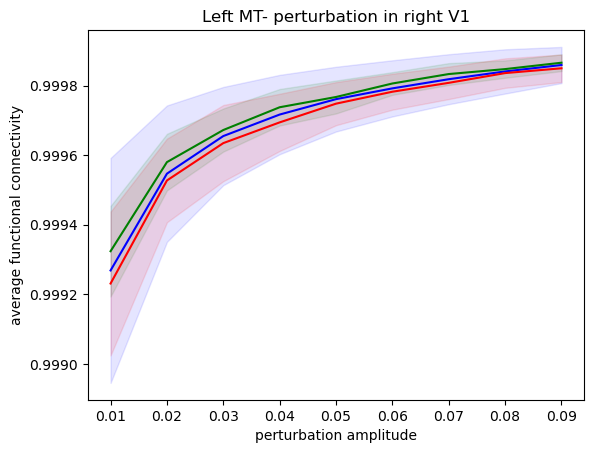

In [226]:
seed_idx = L_MT_idx
# seed_idx = R_MT_idx
# seed_idx = [205,206]
# seed_idx = [220,221]
# seed_idx = [232]
# seed_idx = [233]

colorz=['b','g','r']
x=[dF0*f for f in range(int(Fmax/dF0))][1:]
bold_all_group = []
for g in range(3): # Loop over groups
    pat_conc = np.asarray(pat_conc_pert[g])
    print(pat_conc.shape)
    # fig = plt.figure()
    bold_all = np.empty((0,9))
    for s in range(pat_conc.shape[-3]): # Loop over subjects
        # print(pat_conc[:,s,seed_idx,:].mean(axis=-1).mean(axis=-1).shape)
        bold = pat_conc[:,s,seed_idx,:].mean(axis=-1).mean(axis=-1)
        bold_rate = bold[1:]/bold[0]
        bold_all = np.concatenate((bold_all, bold[np.newaxis,1:]), axis=0)
    bold_all_group.append(bold_all[:,0])
    plt.plot(x, bold_all.mean(axis=0), c=colorz[g])
    plt.fill_between(x,bold_all.mean(axis=0)-bold_all.std(axis=0), bold_all.mean(axis=0)+bold_all.std(axis=0), color=colorz[g], alpha=0.1)
    plt.xlabel('perturbation amplitude')
    plt.ylabel('average functional connectivity')
    plt.title('Left MT- perturbation in right V1')

plt.savefig('output_global/perturbation_effect_example_L_MT', dpi=200)

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

C vs. B: Brunner-Munzel test, P_val:8.141e-01 W=2.385e-01
B vs. NB: Brunner-Munzel test, P_val:2.568e-01 W=-1.182e+00
C vs. NB: Brunner-Munzel test, P_val:3.895e-01 W=-8.861e-01


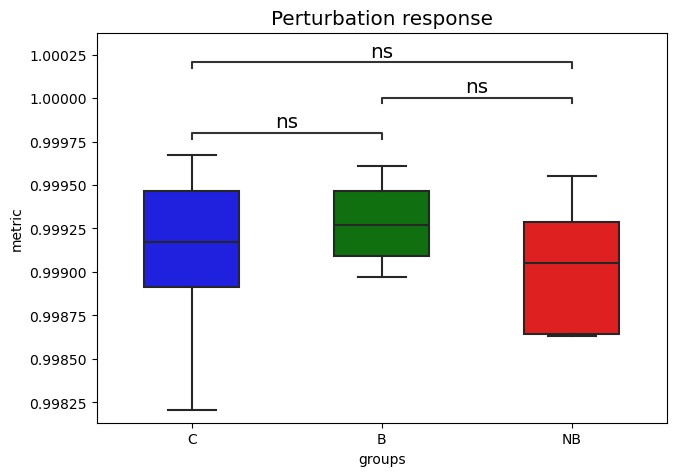

In [223]:
my_pal = {'C':'blue', 'B':'g', 'NB':'r'}
annot_test =  'Brunner-Munzel'
# annot_test = 't-test_ind'
pairs = [('C','B'),('C','NB'),('B','NB')]

mmm = []
ggg = []
o = [['C'],['B'],['NB']]
for i,g in enumerate(bold_all_group):
    mmm += g.tolist()
    ggg += o[i]*len(g)
    
df = pd.DataFrame({'metric':mmm, 'groups':ggg})
hue_plot_params = {
    'data': df,
    'x': 'groups',
    'y': 'metric',
    "order": ['C','B','NB'],
    "palette": my_pal
}
fig,ax = plt.subplots(1,1, figsize=(7,5))
with sns.plotting_context("notebook", font_scale = 1.2):
    sns.boxplot(**hue_plot_params, showfliers=False, width=0.5, ax=ax)
    annotator = Annotator(ax, pairs, **hue_plot_params)
    annotator.configure(test=annot_test, text_format='star', loc='inside')
                        # ,comparisons_correction='Benjamini-Hochberg')
    _, stat = annotator.apply_and_annotate()
    plt.title('Perturbation response')
    plt.tight_layout()



<Axes: >

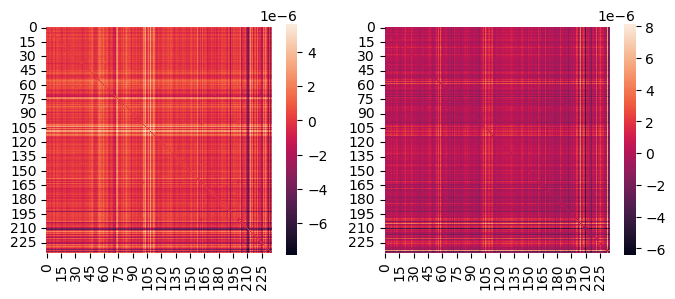

In [28]:
fig,axs = plt.subplots(1,2, figsize=(8,3))
sns.heatmap(pat_diff[0].mean(axis=0), ax=axs[0], square=True)
sns.heatmap(pat_diff[1].mean(axis=0), ax=axs[1], square=True)

## Distance between healthys and patients

In [404]:
# Take the average among subjects
perturb_labels = ['L_MT-V1','R_MT-V1']
dF0 = 0.1
Fmax = 1
group_idx = {'C':0, 'B':1, 'NB':2}
distances = [[], []]
for p_i,p in enumerate(perturb_labels): # Loop over perturbed areas
    for f_i,f in enumerate([dF0*f for f in range(int(Fmax/dF0))]):
        pat_conc = [np.empty((0,236,236)), np.empty((0,236,236)), np.empty((0,236,236))]
        for sub_i,sub in enumerate(subjects_code):
            g = subjects_group[sub_i]
            pert_patient = scipy.io.loadmat('../data/EffectiveConnectivity/perturbations/MT-V1_100sim/Pert_FCsim_'+sub+'.mat')
            pat_conc[group_idx[g]] = np.concatenate((pat_conc[group_idx[g]], pert_patient['FC_pert_all'][p_i][f_i][np.newaxis,:]), axis=0)
        # Compute the avereage of the healthy and compute the distance with all the B and NB patients
        h_av = np.mean(pat_conc[0], axis=0)
        for gr_i, gr in enumerate(pat_conc[1:]):
            pat_dis = []
            for pat in gr:
                 # pat_dis.append(ssim(h_av, pat, data_range=2)) # B+
                 pat_dis.append(pearsonr(h_av.flatten(), pat.flatten())[0]) # B+
            distances[gr_i].append(pat_dis)
    break

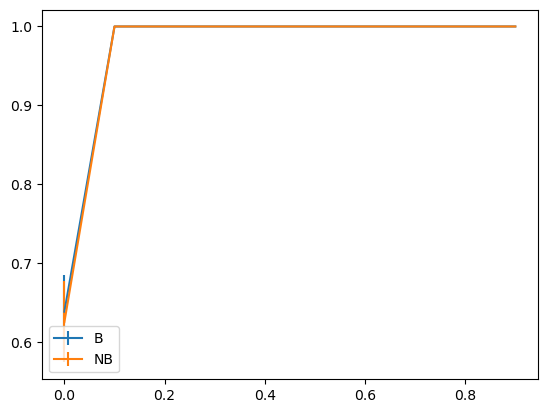

In [403]:
x=[dF0*f for f in range(int(Fmax/dF0))]
plt.errorbar(x, np.asarray(distances[0]).mean(axis=1), yerr=np.asarray(distances[0]).std(axis=1), label='B')
plt.errorbar(x, np.asarray(distances[1]).mean(axis=1), yerr=np.asarray(distances[1]).std(axis=1), label='NB')
# plt.yscale('log')
plt.legend()

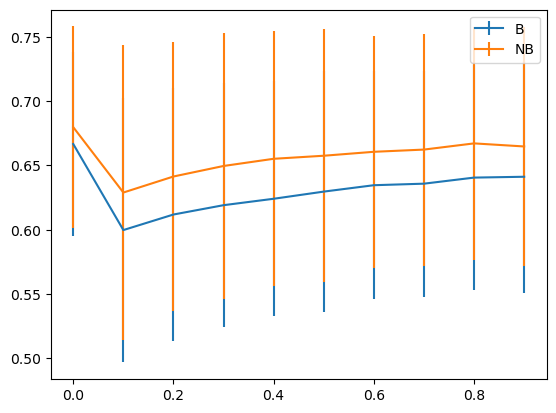

In [405]:
x=[dF0*f for f in range(int(Fmax/dF0))]
plt.errorbar(x, np.asarray(distances[0]).mean(axis=1), yerr=np.asarray(distances[0]).std(axis=1), label='B')
plt.errorbar(x, np.asarray(distances[1]).mean(axis=1), yerr=np.asarray(distances[1]).std(axis=1), label='NB')
# plt.yscale('log')
plt.legend()